Arjun Joshi. Brainstation Capstone <br>
December, 2024<br>
Diploma Program: Data Science

<html>
<style>
sup {
    vertical-align: super;
    font-size: smaller;
}
</style>
<p>
<sub><h3><center>Capstone. Case Study: Application of Anthropogenic WSM </center></h3></sub>
<sup></sup><h1> <center>DATA CLEANING, EDA & PRE-PROCESSING</sup>
<sup><h3> .ANTHROPOGENIC PRESSURES. </h3></sup><center></center></h1>
</html>


##### Run intro scripts

In [533]:
import os
# Set working directory to notebook dir
os.chdir('J:\\Brainstation\\BS Git\\Tampa_Apollo_AnthropogenicIndex\\notebooks')

In [546]:
%run ./scripts/imports.py


FileNotFoundError: [Errno 2] No such file or directory: 'imports.py'

In [540]:
# Load libraries


%run ./scripts/DataDictionary.py

pd.set_option('display.max_columns', None)

FileNotFoundError: [Errno 2] No such file or directory: 'imports.py'

## Introduction

### Context

As stated in the ReadMe, 3 supplementary notebooks cover cleaning, EDA, requisite baseline modelling for each individual environment/ecosystem/overarching framework - which are ultimately used to measure the performance of the Anthropogenic Pressure Index (API)

Figure 1 below shows the geography, scale and basic information about the Tampa Region. The marked area in white in the top left image shows the town where the marine construction in this case study has been proposed.

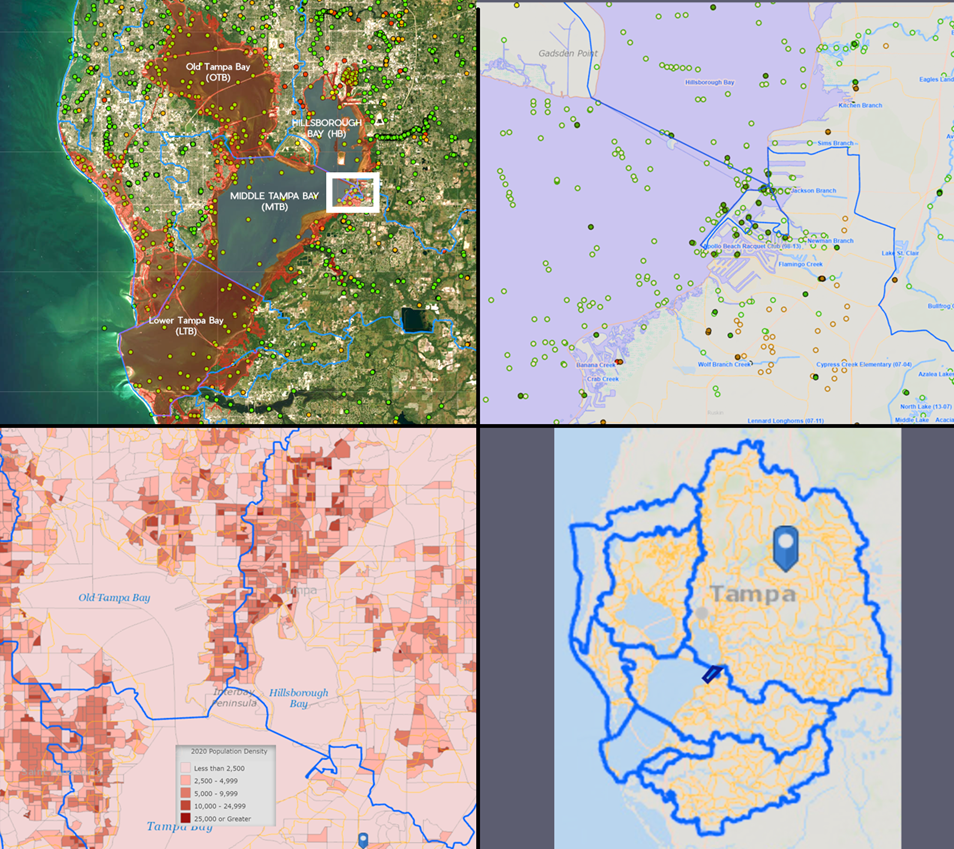

<sup>Figure1.<br>
> (A) Top L. marked sections of Tampa Bay <br>
> (B) Top R. Sampling Sites Near Proposed Construction site. prominent filled circles are active, all others are not inactive <br>
> (C) Bottom L. 2020 Population Density of Tampa Bay Region <br>
> (D) Bottom R. The massive scale of the watershed, the marked area is the HB watershed and the one directly underneath is MTB. <br>Marking in the >     center of the the image is the proposed study site </sup>


>>> Regional Watershed Area Descriptions.<br>
>>> **HB Watershed**: Area (Sq Miles) : 1,281.83 <br>
>>> **MTB watershed**: Area (Sq Miles) : 410.31 <br>

When considering the nutrient loading, nitrogen in particular, it's important to understand the scale of the watershed - all of which flows into the bay. The H.C. is massive, covering nearly 1300 sq miles. That area includes large amounts of agricultral land, new residential and commercial construction.

Notebook Context: This notebook processes what is considered to be data describing Anthropogenic Pressures on the coastal ecosystem.
Notebook Purpose: Clean, Pre-process Anth.Gen. data, including EDA and baseline modelling, in order to establish crucial relationships between features.<br> This notebook requires an understanding of Nitrogen compounds in the ecosystem, if they're organic or not and their patterns over time. Unlike the biology specific data, Anth. Gen. data obtained has a sampling structure and consistency to attempt a Time-Series Analysis.
<br>
<br>
*I encourage anyone reviewing the code to utilize the Table of Contents for easy navigation.*<br>
Each subcategory has it's own section for cleaning, EDA, processing and baselines modelling (if applicable)
There are 3 major areas of focus covered, the notebook is also organized accordingly:<BR>
1. Section: Nitrate Concentrations, Water Quality (ADF, TSA)
2. Section: Property Development Metrics
3. Section: Population Growth Metrics (Linear Regression)


##### Post-Intro Note : 2 Features Omitted

* Two additional possible sources of anth. pressures were in the original design of the study: marine recreational traffic and geospatial analysis to capture possible trends at a higher resolution. These were omitted because it was not feasible to get records of the full transit of the vessels, only port arrivals. This made a difference because shippnig lanes alone aren't informative enough - proximity to localized features would have been a more valuable insight. Data obtained did not include GPS during a trip, only start, end and if any stops were made or ports called upon.
    - Geospatial data had to be omitted for two reasons: corrpution of data files and time limitation of this inital capstone phase. That is an important next step to be made as it provides insight into what specific features are impacting ecosystem health, how and the relative significance of each. In terms of the development of a new index value, this would be a consideration in how weights are calculated for each factor.
    - due to loss of data due to hardware issues. This will be pursued in subsequent expansion on this study.*

* Please refer to the ReadMe for a more detailed look into the complexities and impacts of Anth. Gen. on coastal marine ecosystems.*

### Definitions, Read Data

#### Functions

In [606]:
def check_stationarity(timeseries):
  """
  Performs an Augmented Dickey-Fuller test to check stationarity of a time series.

  Args:
    timeseries: A pandas Series representing the time series data.

  Returns:
    None. Prints the results of the ADF test.
  """
  result = adfuller(timeseries)
  print('ADF Statistic: %f' % result[0])
  print('p-value: %f' % result[1])
  print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


In [607]:
def lag_plots(data_df):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    lag_plot(data_df[data_df.columns[0]], ax=ax1)
    ax1.set_title(data_df.columns[0]);

    lag_plot(data_df[data_df.columns[1]], ax=ax2)
    ax2.set_title(data_df.columns[1]);

    ax1.set_ylabel('$y_{t+1}$');
    ax1.set_xlabel('$y_t$');
    ax2.set_ylabel('$y_{t+1}$');
    ax2.set_xlabel('$y_t$');

    plt.tight_layout()

#### Read CSV into Pandas DF

##### Nutrient Loading Data

In [7]:
os.chdir('J:/Brainstation/BS Git/data/human Imact')

In [8]:
# There are 4 sections of Tampa Bay.
# This study covers 2 but can expanded to all. Refer to map in introduction section

# Import Middle Tampa Bay (MTB) Water Quality (WQ) data. 1990-2024
mtbwq=pd.read_csv('MTB_WQ.csv',low_memory=False)

# Import Hillsborough Bay (HB) W.Q. data. 1990-2024
hbwq=pd.read_csv('HB_WTQ.csv',low_memory=False)

##### Property Development

In [9]:

os.chdir('J:/Brainstation/BS Git/Property Records')

In [10]:
proprx=pd.read_csv('PRIMARY_PROPRX.csv',low_memory='False')

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\3142466767.py:1: DtypeWarning: Columns (1,4,38,39,40) have mixed types. Specify dtype option on import or set low_memory=False.
  proprx=pd.read_csv('PRIMARY_PROPRX.csv',low_memory='False')


In [11]:
# Old Table read-ins from design phase using subset data
# Subset dfs
# Original Sectioned Property Records
AB_1=pd.read_csv('AB_1.csv')
AB_2=pd.read_csv('AB_BLVD_SPIT_1.csv')
AB_3=pd.read_csv('AB_Central_1.csv')
AB_4=pd.read_csv('AB_INTSXN_1.csv')
AB_5=pd.read_csv('AB_SOUTH_1.csv')
AB_6=pd.read_csv('AB_SOUTH_2.csv')
AB_7=pd.read_csv('AB_SPIT_1.csv')
GIB_8=pd.read_csv('GIB_MAIN_1.csv')
RIV_1=pd.read_csv('RIV_W_1.csv')

##### Population Growth

In [12]:
os.chdir('J:\\Brainstation\\BS Git\\data\\human Imact\\MarineTraffic')

In [13]:
#WHO population figures
dfpop_staged=pd.read_csv('StagedPopulations.csv')

In [14]:
os.chdir('J:\\Brainstation\\Capstone Git\\data\\human Imact\\Population Data')

In [15]:
#Hillsborough county sourced data, metro area (subset)
pop_metro=pd.read_csv('tampa_metro_population.csv',header=0)

## Feature Space 1: Nitrate Loading; Water Quality Index

Tables loaded in at start of notebook.<br>Tables:<BR>
> _(hbwq)_   Hillsborough Bay (HB)<br>
> _(mtbwq)_ Middle Tampa Bay (MTB)<br>
These 2 data sets are closest in proximmity to the study site, the focus of the study. <br>
This dataset can always be expanded at a later date.

Objective: <BR>Establish clear pattern between 3 forms of Nitrogen compounds in the bay:<br>
Nitrates and Nitrates (NO3,NO2-).   Ammonia/Ammonium (NH3).       Organic Nitrogen.

Key Info:<BR>
Nitrates/Nitrites (NO3, No2-), and ammonia(NH3/NH4+) are inorganic forms of nitrogen and either represent the slow breakdown of organic material or input from external sources. Part 1 must demonstrate that NH3 and N03 compound(s) vary, with significance, from behaviors and patterns observed in Organic Nitrogen.
mtbwq.head(5)

In [16]:
# Df read-in check
hbwq.head(5)

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude_DD,Longitude_DD,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
0,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Fluorides,1.00,mg/l,NaN,NaN,20005,Hillsborough Bay
1,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Fecal Coliform,10.00,cfu/100ml,NaN,NaN,20005,Hillsborough Bay
2,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Dissolved Solids,27200.00,mg/l,NaN,NaN,20005,Hillsborough Bay
3,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Dissolved oxygen saturation,80.80,percent (%),NaN,NaN,20005,Hillsborough Bay
4,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Dissolved oxygen (DO),4.68,mg/l,NaN,NaN,20005,Hillsborough Bay


In [17]:
# Df read-in check
mtbwq.head(5)

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Actual_Latitude,Actual_Longitude,DEP_WBID,SampleDate,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
0,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,Cl_mgl,Chloride,NaN,18000.0,NaN,NaN,NaN,18000,mg/l
1,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,550.0,NaN,NaN,NaN,0.55,mg/l
2,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,580.0,NaN,NaN,NaN,0.58,mg/l
3,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,NO3_ugl,"Nitrogen, Nitrate (NO3) as N",NaN,10.0,NaN,NaN,NaN,0.01,mg/l
4,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,pH,pH,NaN,8.3,NaN,NaN,NaN,8.3,NaN


In [18]:
#null check
print(mtbwq.isna().sum())
hbwq.isna().sum()

WBodyID                       0
WaterBodyName                 0
DataSource                    0
StationID                     0
StationName                   0
Actual_StationID              0
Actual_Latitude               0
Actual_Longitude              0
DEP_WBID                      0
SampleDate                    0
ActivityDepth             47806
DepthUnits                    0
Parameter                     0
Characteristic             5507
Sample_Fraction          505439
Result_Value                  0
Result_Unit              102440
QACode                   449145
Result_Comment           501969
Original_Result_Value    153389
Original_Result_Unit     167747
dtype: int64


DataSourceName             0
DataSourceCode             0
StationID                  0
ActualStationID      1048575
Latitude_DD                0
Longitude_DD               0
SampleDate                 0
SampleTime                 0
ActivityDepth         766156
ActivityDepthUnit     758436
Characteristic        748461
ResultValue              985
ResultUnit            786325
ValueQualifier       1005190
ResultComment        1035222
WaterbodyID                0
WaterbodyName              0
dtype: int64

In [19]:
# Checking column names
mtbwq.Actual_Latitude
mtbwq.columns[[6,7]]

Index(['Actual_Latitude', 'Actual_Longitude'], dtype='object')

In [20]:
# Standardizing some columns between these 2 datasets

In [21]:
hbwq.rename(columns={'Latitude_DD':'Latitude','Longitude_DD':'Longitude'},inplace=True)
hbwq.head(5)

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
0,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Fluorides,1.00,mg/l,NaN,NaN,20005,Hillsborough Bay
1,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Fecal Coliform,10.00,cfu/100ml,NaN,NaN,20005,Hillsborough Bay
2,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Dissolved Solids,27200.00,mg/l,NaN,NaN,20005,Hillsborough Bay
3,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Dissolved oxygen saturation,80.80,percent (%),NaN,NaN,20005,Hillsborough Bay
4,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,4/25/2006,0:00:00,0.2,m,Dissolved oxygen (DO),4.68,mg/l,NaN,NaN,20005,Hillsborough Bay


In [22]:
# Standardizing some columns between these 2 datasets

In [23]:
mtbwq.rename(columns={'Actual_Latitude':'Latitude','Actual_Longitude':'Longitude'},inplace=True)
mtbwq.head(5)

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Latitude,Longitude,DEP_WBID,SampleDate,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
0,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,Cl_mgl,Chloride,NaN,18000.0,NaN,NaN,NaN,18000,mg/l
1,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,550.0,NaN,NaN,NaN,0.55,mg/l
2,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,580.0,NaN,NaN,NaN,0.58,mg/l
3,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,NO3_ugl,"Nitrogen, Nitrate (NO3) as N",NaN,10.0,NaN,NaN,NaN,0.01,mg/l
4,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,7/10/1972 0:00,NaN,m,pH,pH,NaN,8.3,NaN,NaN,NaN,8.3,NaN


In [24]:
hbwq.Characteristic.value_counts()

Characteristic
Temperature, water                               45421
Salinity                                         33622
Specific conductance                             31115
Dissolved oxygen (DO)                            30145
pH                                               29934
                                                 ...  
Manganese                                            2
Nickel                                               2
Zinc                                                 2
Nitrogen, Nitrite (NO2) as N                         2
Anatoxin (toxin produced by blue green algae)        1
Name: count, Length: 61, dtype: int64

** This study uses Organic and Inorganic forms of nitrogen and phosphorous as a proxy for anthropogenic introduction of harmful chemicals into the bay. This study examines these 2 features in 2 main ways:<br>
- As an aggregate statistic that describes the functioning of the bay at large
- The  ratio of organic to inorganic  compounds that describe that extent of anthropogenic and ultimately harmful versions of these compounds introduced.

In [25]:
# looking specifically for the forms of Nitrogen.
# Nitrogen comes in Nitrogen Organic, Nitrogen, Nitrates, Nitrites, Ammonia, Ammonium

# HBWQ - Hillsborough Bay Water Quality
# MTBWQ - Middle Tampa Bay Water Quality

index_1=hbwq.Characteristic.str.contains('Nit,nit').index==True

In [26]:
len(index_1)

1048575

In [27]:
# Isolate Nit. in HB
Nit=hbwq.Characteristic.str.contains('Nitrogen')

In [28]:
Nit.head()

0    False
1    False
2    False
3    False
4    False
Name: Characteristic, dtype: object

In [29]:
# Phosphate isolation. Omitted.
# Remnant from initial EDA 
pho_hb=hbwq.Characteristic.str.contains('Phosph')

### Data Wrangling, EDA / Pre-Processing

#### WQI Sample Frequency, Consistency Check

In [30]:
# Begin EDA, aggregations for patterns
hbwq.SampleDate.str.slice(-4).value_counts().reset_index().sort_values(by='SampleDate')

,SampleDate,count
29,1990,5554
27,1991,6780
22,1992,10118
25,1993,7243
30,1994,5342
28,1995,5786
33,1996,4647
34,1997,4210
32,1998,4774
31,1999,5241


In [31]:
hbwq.SampleDate=pd.to_datetime(hbwq.SampleDate)

In [32]:
mtbwq.SampleDate=pd.to_datetime(mtbwq.SampleDate)

In [33]:
# Sanity Check
hbwq.head(3)

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
0,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Fluorides,1.0,mg/l,NaN,NaN,20005,Hillsborough Bay
1,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Fecal Coliform,10.0,cfu/100ml,NaN,NaN,20005,Hillsborough Bay
2,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Dissolved Solids,27200.0,mg/l,NaN,NaN,20005,Hillsborough Bay


In [34]:
mtbwq.head(3)

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Latitude,Longitude,DEP_WBID,SampleDate,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
0,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,Cl_mgl,Chloride,NaN,18000.0,NaN,NaN,NaN,18000,mg/l
1,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,550.0,NaN,NaN,NaN,0.55,mg/l
2,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,580.0,NaN,NaN,NaN,0.58,mg/l


    SampleDate  count
10           1    419
9            2    439
6            3    462
11           4    346
0            5    530
7            6    455
8            7    450
2            8    499
1            9    500
5           10    481
3           11    491
4           12    482


array([[<Axes: title={'center': 'SampleDate'}>,
        <Axes: title={'center': 'count'}>]], dtype=object)

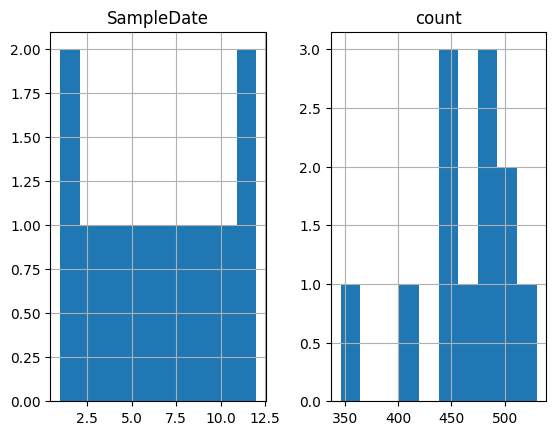

In [35]:
#Look at sample counts over time.
print(hbwq[hbwq.SampleDate.dt.year==1990].SampleDate.dt.month.value_counts().reset_index().sort_values(by='SampleDate'))
hbwq[hbwq.SampleDate.dt.year==1990].SampleDate.dt.month.value_counts().reset_index().sort_values(by='SampleDate').hist()

    SampleDate  count
6            1    795
7            2    791
9            3    766
10           4    718
2            5    827
4            6    805
8            7    786
1            8    886
3            9    809
0           10    981
11          11    658
5           12    803


array([[<Axes: title={'center': 'SampleDate'}>,
        <Axes: title={'center': 'count'}>]], dtype=object)

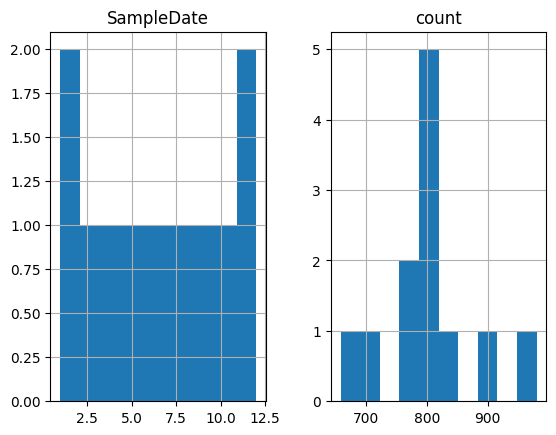

In [36]:
# Checking for distribution of sample counts by month
print(mtbwq[mtbwq.SampleDate.dt.year==1990].SampleDate.dt.month.value_counts().reset_index().sort_values(by='SampleDate'))
mtbwq[mtbwq.SampleDate.dt.year==1990].SampleDate.dt.month.value_counts().reset_index().sort_values(by='SampleDate').hist()

#### _Preliminary EDA and processing of subset, 1990, used in initial EDA and construction of baseline models. CODE OUTDATED_

In [37]:
# MTB. HB. Isolate for 1990
mtbwq1990=mtbwq[mtbwq.SampleDate.dt.year==1990]
hbwq1990=hbwq[hbwq.SampleDate.dt.year==1990]

In [38]:
# Exploring at data for 1 month
mtbwq1990[mtbwq1990.SampleDate.dt.month==1].sort_values(by='SampleDate')

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Latitude,Longitude,DEP_WBID,SampleDate,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
510825,20007,Middle Tampa Bay,HCEPC_WQ,32,Tampa Bay Marker 5G,"=""32""",27.7931,-82.570600,1558C,1990-01-03 00:00:00,3.20,m,Cond_umhocm,Specific conductance,NaN,45300.00,umho,NaN,NaN,NaN,NaN
130386,20007,Middle Tampa Bay,HCEPC_WQ,33,Lower Old Tampa Bay,"=""33""",27.8261,-82.567500,1558C,1990-01-03 00:00:00,4.42,m,Turb_ntu,Turbidity,NaN,3.00,NTU,NaN,NaN,NaN,NaN
130385,20007,Middle Tampa Bay,HCEPC_WQ,33,Lower Old Tampa Bay,"=""33""",27.8261,-82.567500,1558C,1990-01-03 00:00:00,4.42,m,Tcoli_100ml,Total Coliform,NaN,4.00,cfu/100ml,NaN,NaN,NaN,NaN
130384,20007,Middle Tampa Bay,HCEPC_WQ,33,Lower Old Tampa Bay,"=""33""",27.8261,-82.567500,1558C,1990-01-03 00:00:00,4.42,m,TKN_ugl,"Nitrogen, Kjeldahl",NaN,680.00,ug/l,NaN,NaN,NaN,NaN
130383,20007,Middle Tampa Bay,HCEPC_WQ,33,Lower Old Tampa Bay,"=""33""",27.8261,-82.567500,1558C,1990-01-03 00:00:00,4.42,m,Fcoli_100ml,Fecal Coliform,NaN,4.00,cfu/100ml,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82437,20007,Middle Tampa Bay,EPC_ROUTINE_MONITORING,136,Cockroach Bay,"=""136""",27.6800,-82.499199,1778,1990-01-31 11:12:00,0.30,m,TP_mgl,Phosphorus as P,NaN,0.52,mg/l,NaN,NaN,0.52,mg/L
82438,20007,Middle Tampa Bay,EPC_ROUTINE_MONITORING,136,Cockroach Bay,"=""136""",27.6800,-82.499199,1778,1990-01-31 11:12:00,0.30,m,TKN_mgl,"Nitrogen, Kjeldahl",NaN,1.31,mg/l,NaN,NaN,1.31,mg/L
82439,20007,Middle Tampa Bay,EPC_ROUTINE_MONITORING,136,Cockroach Bay,"=""136""",27.6800,-82.499199,1778,1990-01-31 11:12:00,0.30,m,TN_mgl,Nitrogen,NaN,1.38,mg/l,C,NaN,1.38,mg/L
82427,20007,Middle Tampa Bay,EPC_ROUTINE_MONITORING,136,Cockroach Bay,"=""136""",27.6800,-82.499199,1778,1990-01-31 11:12:00,0.30,m,norg_ugl,"Nitrogen, organic",NaN,1270.00,ug/l,C,NaN,1.27,mg/L


In [39]:
# Format dt values
mtbwq.SampleDate=pd.to_datetime(mtbwq.SampleDate)
hbwq.SampleDate=pd.to_datetime(hbwq.SampleDate)

<Axes: >

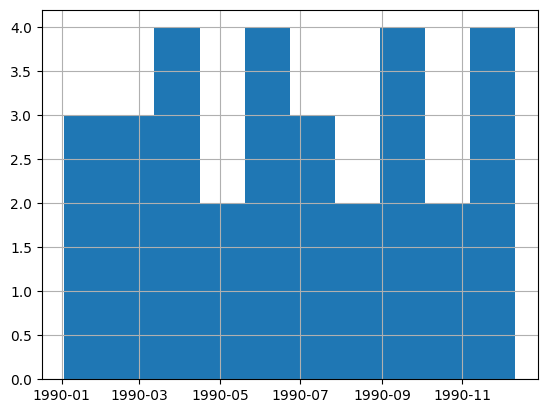

In [40]:
# Look at sampling
hbwq1990_samplefreq=hbwq1990.SampleDate.value_counts().reset_index().sort_values(by='SampleDate').reset_index(drop=True)
hbwq1990_samplefreq.SampleDate.hist()

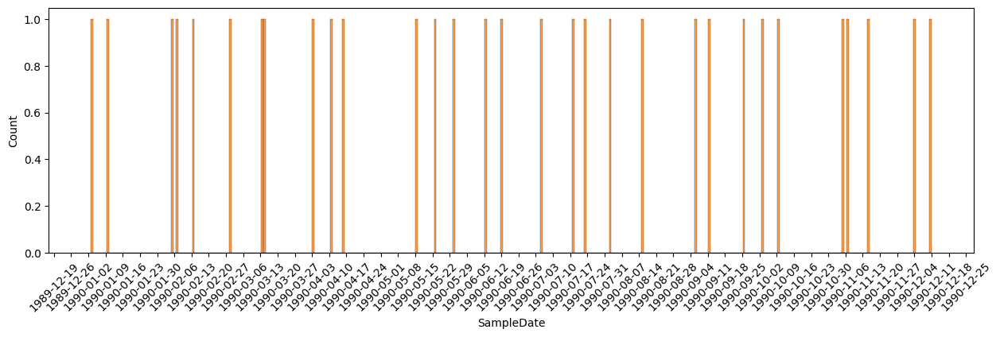

In [41]:
# Looking for missing weekly samples
import matplotlib.dates as mdates

plt.figure(figsize=(15,4))
sns.histplot()
ax = sns.histplot(x=hbwq1990_samplefreq.SampleDate,bins=365)
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xticks(rotation=45)
#plt.xticks(range('1990-01-01','1990-12-31', 365))
plt.show()

In [42]:
#sanity
hbwq1990.head(2)

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
22449,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-01-10,0:00:00,2.23,m,Fecal Coliform,4.0,cfu/100ml,NaN,NaN,20005,Hillsborough Bay
22450,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-02-14,0:00:00,2.44,m,Fecal Coliform,4.0,cfu/100ml,NaN,NaN,20005,Hillsborough Bay


In [43]:
# Isolate Nitrates, complete examination of subset of data
nitrogen_1990=hbwq1990[hbwq1990.Characteristic.str.contains('Nitr','nitr')==True]
nitrogen_1990.head(5)

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
22768,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-01-10,0:00:00,2.23,m,Nitrogen,930.0,ug/l,NaN,NaN,20005,Hillsborough Bay
22769,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-02-14,0:00:00,2.44,m,Nitrogen,1120.0,ug/l,NaN,NaN,20005,Hillsborough Bay
22770,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-03-14,0:00:00,2.59,m,Nitrogen,720.0,ug/l,NaN,NaN,20005,Hillsborough Bay
22771,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-04-11,0:00:00,2.59,m,Nitrogen,610.0,ug/l,NaN,NaN,20005,Hillsborough Bay
22772,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-05-16,0:00:00,2.59,m,Nitrogen,940.0,ug/l,NaN,NaN,20005,Hillsborough Bay


##### EDA: Isolation of Nitrogen Compounds, 1990 subset

The dataset has multiple entries for each sample event. The same sample is analyzed and described in multiple ways. Consequently, data needs to be isolated to get a consistent single data set.

In [44]:
# Create Phosphate df
phosphate_hb=hbwq[hbwq.Characteristic.str.contains('Phos','phos')==True]
phosphate_hb.SampleDate=pd.to_datetime(phosphate_hb.SampleDate)
phosphate_hb.head(2)

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\345737480.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  phosphate_hb.SampleDate=pd.to_datetime(phosphate_hb.SampleDate)


,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
21,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-10-03,0:00:00,0.2,m,Phosphorus as P,280.0,ug/l,NaN,NaN,20005,Hillsborough Bay
22,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-10-03,0:00:00,0.2,m,"Phosphorus, phosphate (PO4) as P",0.2,mg/l,NaN,NaN,20005,Hillsborough Bay


In [45]:
#Isolate Phosphate
phosphate_1990=hbwq1990[hbwq1990.Characteristic.str.contains('Phos','phos')==True]
phosphate_1990.head(5)

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
23711,EPC Water Quality Data,HCEPC_WQ,44,NaN,27.923609,-82.480832,1990-12-11,0:00:00,0.91,m,"Phosphorus, phosphate (PO4) as P",0.30,mg/l,NaN,NaN,20005,Hillsborough Bay
25728,EPC Water Quality Data,HCEPC_WQ,44,NaN,27.923609,-82.480832,1990-06-13,0:00:00,1.07,m,Phosphorus as P,0.65,mg/l,NaN,NaN,20005,Hillsborough Bay
25729,EPC Water Quality Data,HCEPC_WQ,44,NaN,27.923609,-82.480832,1990-10-10,0:00:00,0.91,m,Phosphorus as P,0.42,mg/l,NaN,NaN,20005,Hillsborough Bay
25764,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-09-12,0:00:00,2.44,m,Phosphorus as P,0.63,mg/l,NaN,NaN,20005,Hillsborough Bay
25849,EPC Water Quality Data,HCEPC_WQ,6,NaN,27.889443,-82.477497,1990-02-14,0:00:00,1.52,m,Phosphorus as P,0.52,mg/l,NaN,NaN,20005,Hillsborough Bay


In [46]:
# Checking Units
pd.concat([nitrogen_1990.Characteristic.value_counts(),nitrogen_1990.ResultUnit.value_counts()],axis=1)

,count,count
"Nitrogen, Kjeldahl",362.0,NaN
Nitrogen,349.0,NaN
"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",338.0,NaN
"Nitrogen, ammonia as N",319.0,NaN
"Nitrogen, organic",311.0,NaN
"Nitrogen, Nitrate (NO3) as N",14.0,NaN
mg/l,NaN,831.0
ug/l,NaN,699.0


In [47]:
# Isolate Nit
nitrate1990=nitrogen_1990[nitrogen_1990.Characteristic.str.contains('Nitrogen, Nitrite')]
print(nitrate1990.shape)
nitrate1990.reset_index(drop=True,inplace=True)
nitrate1990.head(3)

(338, 17)


,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
0,EPC Water Quality Data,HCEPC_WQ,7,NaN,27.858887,-82.468609,1990-01-10,0:00:00,1.68,m,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",10.0,ug/l,NaN,NaN,20005,Hillsborough Bay
1,EPC Water Quality Data,HCEPC_WQ,7,NaN,27.858887,-82.468609,1990-02-14,0:00:00,1.68,m,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",20.0,ug/l,NaN,NaN,20005,Hillsborough Bay
2,EPC Water Quality Data,HCEPC_WQ,7,NaN,27.858887,-82.468609,1990-03-14,0:00:00,1.83,m,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",10.0,ug/l,NaN,NaN,20005,Hillsborough Bay


In [48]:
# Test nitrate isolation
nitrate1990[nitrate1990.ResultUnit.isna()]
nitrate1990.ResultUnit.fillna('ug/l',inplace=True)
nitrate1990[nitrate1990.ResultUnit.isna()]

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\2110313770.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  nitrate1990.ResultUnit.fillna('ug/l',inplace=True)
C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\2110313770.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nitrate1990.ResultUnit.fillna('ug/l',inplace=True)


,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName


In [49]:
# Standardize units
for i in nitrate1990.index:
    if nitrate1990.loc[i,'ResultUnit']=='ug/l':
        nitrate1990.loc[i,'ResultValue']=nitrate1990.loc[i,'ResultValue']/1000
        nitrate1990.loc[i,'ResultUnit']='mg/l'
        #ammonia1990.ResultValue=ammonia1990.ResultValue/1000

In [50]:
# Create subset with features of interest
nitrate_subset=nitrate1990[['DataSourceName','StationID','SampleDate','SampleTime','ResultValue','ResultUnit','Latitude','Longitude']]

In [51]:
# date format
nitrate_subset['month']=nitrate_subset.SampleDate.dt.month
nitrate_subset

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\958506387.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nitrate_subset['month']=nitrate_subset.SampleDate.dt.month


,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude,month
0,EPC Water Quality Data,7,1990-01-10,0:00:00,0.010,mg/l,27.858887,-82.468609,1
1,EPC Water Quality Data,7,1990-02-14,0:00:00,0.020,mg/l,27.858887,-82.468609,2
2,EPC Water Quality Data,7,1990-03-14,0:00:00,0.010,mg/l,27.858887,-82.468609,3
3,EPC Water Quality Data,7,1990-04-11,0:00:00,0.020,mg/l,27.858887,-82.468609,4
4,EPC Water Quality Data,7,1990-05-16,0:00:00,0.010,mg/l,27.858887,-82.468609,5
...,...,...,...,...,...,...,...,...,...
333,EPC Monthly Routine Water Monitoring,44,1990-07-18,9:50:00,0.003,mg/l,27.923700,-82.480698,7
334,EPC Monthly Routine Water Monitoring,2,1990-10-10,9:30:00,0.020,mg/l,27.940800,-82.457901,10
335,EPC Monthly Routine Water Monitoring,52,1990-11-07,14:51:00,0.020,mg/l,27.896999,-82.438202,11
336,USGS National Water Information System,2.75134E+14,1990-02-07,0:00:00,0.040,mg/l,27.859747,-82.451205,2


In [52]:
# look at nitrate patterns over 1 year period
nitrate_subset_plot=nitrate_subset.groupby('month').ResultValue.agg(['mean','std','min','max'])
nitrate_subset_plot.head(12)

,mean,std,min,max
month,,,,
1,0.022138,0.031466,0.003,0.15
2,0.020667,0.013374,0.010,0.08
3,0.011304,0.003444,0.010,0.02
4,0.013107,0.009171,0.003,0.03
5,0.007826,0.005140,0.003,0.02
6,0.009552,0.005779,0.003,0.02
7,0.009769,0.005969,0.003,0.02
8,0.009455,0.009145,0.003,0.05
9,0.009552,0.006905,0.003,0.03


In [53]:
# Isolate ammmonia
ammonia1990=nitrogen_1990[nitrogen_1990.Characteristic.str.contains('ammon')].sort_values(by='SampleDate').reset_index(drop=True)
print(ammonia1990.shape)
ammonia1990.head()

(319, 17)


,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
0,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,2,NaN,27.940800,-82.457901,1990-01-10,13:45:00,0.30,m,"Nitrogen, ammonia as N",0.02,mg/l,JI,NaN,20005,Hillsborough Bay
1,EPC Water Quality Data,HCEPC_WQ,6,NaN,27.889443,-82.477497,1990-01-10,0:00:00,1.52,m,"Nitrogen, ammonia as N",40.00,NaN,NaN,NaN,20005,Hillsborough Bay
2,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,44,NaN,27.923700,-82.480698,1990-01-10,10:45:00,0.70,m,"Nitrogen, ammonia as N",30.00,ug/l,JI,NaN,20005,Hillsborough Bay
3,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,58,NaN,27.939800,-82.419601,1990-01-10,9:47:00,1.50,m,"Nitrogen, ammonia as N",0.06,mg/l,JI,NaN,20005,Hillsborough Bay
4,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,71,NaN,27.876499,-82.413803,1990-01-10,14:27:00,1.10,m,"Nitrogen, ammonia as N",40.00,ug/l,JI,NaN,20005,Hillsborough Bay


In [54]:
# Check for units for standardization
ammonia1990.ResultUnit.value_counts()

ResultUnit
mg/l    168
ug/l    100
Name: count, dtype: int64

In [55]:
# Will need to standardize units
ammonia1990[ammonia1990.ResultUnit=='ug/l'].ResultValue

2       30.0
4       40.0
8       60.0
9       20.0
10     100.0
       ...  
306     20.0
313     50.0
314     40.0
315     20.0
316     90.0
Name: ResultValue, Length: 100, dtype: float64

In [56]:
# Std. ammonia units
for i in ammonia1990.index:
    if ammonia1990.loc[i,'ResultUnit']=='ug/l':
        ammonia1990.loc[i,'ResultValue']=ammonia1990.loc[i,'ResultValue']/1000
        ammonia1990.loc[i,'ResultUnit']='mg/l'
        #ammonia1990.ResultValue=ammonia1990.ResultValue/1000

In [57]:
ammonia1990.ResultUnit.value_counts()

ResultUnit
mg/l    268
Name: count, dtype: int64

In [58]:
ammonia_subset=ammonia1990[['DataSourceName','StationID','SampleDate','SampleTime','ResultValue','ResultUnit','Latitude','Longitude']]

In [59]:
#Drop amm. dupes
print(ammonia_subset.duplicated().value_counts())
ammonia_subset=ammonia_subset.drop_duplicates()
print(ammonia_subset.duplicated().value_counts())
ammonia_subset.head(5)

False    254
True      65
Name: count, dtype: int64
False    254
Name: count, dtype: int64


,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude
0,EPC Monthly Routine Water Monitoring,2,1990-01-10,13:45:00,0.02,mg/l,27.940800,-82.457901
1,EPC Water Quality Data,6,1990-01-10,0:00:00,40.00,NaN,27.889443,-82.477497
2,EPC Monthly Routine Water Monitoring,44,1990-01-10,10:45:00,0.03,mg/l,27.923700,-82.480698
3,EPC Monthly Routine Water Monitoring,58,1990-01-10,9:47:00,0.06,mg/l,27.939800,-82.419601
4,EPC Monthly Routine Water Monitoring,71,1990-01-10,14:27:00,0.04,mg/l,27.876499,-82.413803


In [60]:
# any null values would be in ug/l format
ammonia_subset.ResultUnit.fillna('ug/l',inplace=True)

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\3432828705.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ammonia_subset.ResultUnit.fillna('ug/l',inplace=True)


In [61]:
# Standardize 
for i in ammonia_subset.index:
    if ammonia_subset.loc[i,'ResultUnit']=='ug/l':
        ammonia_subset.loc[i,'ResultValue']=ammonia1990.loc[i,'ResultValue']/1000
        ammonia_subset.loc[i,'ResultUnit']='mg/l'
        #ammonia1990.ResultValue=ammonia1990.ResultValue/1000

In [62]:
# date format
ammonia_subset['month']=ammonia_subset.SampleDate.dt.month

In [63]:
# aggregate amm. to monthly for 1 year, look at patterns
ammonia_subset_plot=ammonia_subset.groupby('month').ResultValue.agg(['mean','std','min','max'])
ammonia_subset_plot.head(12)

,mean,std,min,max
month,,,,
1,0.056111,0.024044,0.02,0.10
2,0.048571,0.029204,0.02,0.11
3,0.046842,0.013355,0.02,0.07
4,0.049545,0.032142,0.01,0.11
5,0.049200,0.023965,0.01,0.10
6,0.082105,0.066297,0.01,0.19
7,0.044783,0.042412,0.01,0.17
8,0.092917,0.053931,0.02,0.20
9,0.076522,0.069649,0.01,0.19


In [64]:
pwd

'J:\\Brainstation\\Capstone Git\\data\\human Imact\\Population Data'

<Axes: xlabel='month', ylabel='mean'>

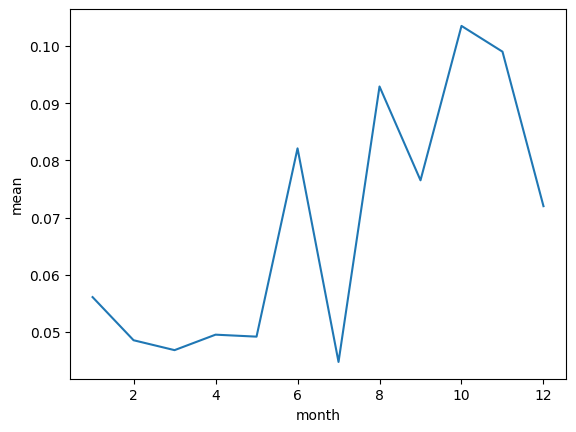

In [65]:
# look at monthly aggreate patterns for 1 year
sns.lineplot(x='month',y='mean',data=ammonia_subset_plot,errorbar=('ci',95))

Kjeldahl units are a measurement of nitrogen that typically represents concentrations of organic Nitrogen. It is an engineered measurement, where a water sample is treated with a catalytic agent to convert nitrogen into ammonia, similar to the decomposition process.

In [66]:
# Isolation kjedahl measurements
kjedahl=nitrogen_1990[nitrogen_1990.Characteristic.str.contains('Kjeld')]
print(kjedahl.shape)
kjedahl.head(5)

(362, 17)


,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
25672,EPC Water Quality Data,HCEPC_WQ,55,NaN,27.849166,-82.431385,1990-04-11,0:00:00,2.59,m,"Nitrogen, Kjeldahl",0.60,mg/l,NaN,NaN,20005,Hillsborough Bay
25735,EPC Water Quality Data,HCEPC_WQ,7,NaN,27.858887,-82.468609,1990-02-14,0:00:00,1.68,m,"Nitrogen, Kjeldahl",1.13,mg/l,NaN,NaN,20005,Hillsborough Bay
25736,EPC Water Quality Data,HCEPC_WQ,7,NaN,27.858887,-82.468609,1990-08-15,0:00:00,2.13,m,"Nitrogen, Kjeldahl",0.76,mg/l,NaN,NaN,20005,Hillsborough Bay
25739,EPC Water Quality Data,HCEPC_WQ,70,NaN,27.908888,-82.463055,1990-07-18,0:00:00,1.52,m,"Nitrogen, Kjeldahl",0.38,mg/l,NaN,NaN,20005,Hillsborough Bay
25884,EPC Water Quality Data,HCEPC_WQ,6,NaN,27.889443,-82.477497,1990-07-18,0:00:00,1.98,m,"Nitrogen, Kjeldahl",0.61,mg/l,NaN,NaN,20005,Hillsborough Bay


In [67]:
print(kjedahl.ResultUnit.isna().value_counts())
kjedahl.ResultUnit.value_counts()

ResultUnit
False    340
True      22
Name: count, dtype: int64


ResultUnit
mg/l    170
ug/l    170
Name: count, dtype: int64

In [68]:
# Look at units
kjedahl[kjedahl.ResultUnit=='ug/l'].head()

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
26914,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,6,NaN,27.889299,-82.477402,1990-12-11,10:00:00,1.6,m,"Nitrogen, Kjeldahl",460.00001,ug/l,NaN,NaN,20005,Hillsborough Bay
27002,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,6,NaN,27.889299,-82.477402,1990-10-10,10:30:00,1.7,m,"Nitrogen, Kjeldahl",479.99999,ug/l,NaN,NaN,20005,Hillsborough Bay
27034,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,6,NaN,27.889299,-82.477402,1990-09-12,10:33:00,1.8,m,"Nitrogen, Kjeldahl",649.99998,ug/l,NaN,NaN,20005,Hillsborough Bay
27062,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,6,NaN,27.889299,-82.477402,1990-08-15,10:29:00,2.0,m,"Nitrogen, Kjeldahl",810.00000,ug/l,NaN,NaN,20005,Hillsborough Bay
27093,EPC Monthly Routine Water Monitoring,EPC_ROUTINE_MONITORING,6,NaN,27.889299,-82.477402,1990-07-18,10:18:00,2.0,m,"Nitrogen, Kjeldahl",610.00001,ug/l,NaN,NaN,20005,Hillsborough Bay


In [69]:
# std. kjel units
for i in kjedahl.index:
    if kjedahl.loc[i,'ResultUnit']=='ug/l':
        kjedahl.loc[i,'ResultValue']=kjedahl.loc[i,'ResultValue']/1000
        kjedahl.loc[i,'ResultUnit']='mg/l'
        #ammonia1990.ResultValue=ammonia1990.ResultValue/1000

In [70]:
kjedahl.reset_index(drop=True,inplace=True)
kjedahl.sort_values(by='SampleDate').reset_index(drop=True,inplace=True)

In [71]:
#date format
kjedahl['month']=kjedahl.SampleDate.dt.month

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\1304643865.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kjedahl['month']=kjedahl.SampleDate.dt.month


In [72]:
# isolate kjel features of interest
kjedahl_subset=kjedahl[['DataSourceName','StationID','SampleDate','SampleTime','ResultValue','ResultUnit','Latitude','Longitude','month']]

In [73]:
# sanity check
kjedahl_subset.head(5)

,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude,month
0,EPC Water Quality Data,55,1990-04-11,0:00:00,0.60,mg/l,27.849166,-82.431385,4
1,EPC Water Quality Data,7,1990-02-14,0:00:00,1.13,mg/l,27.858887,-82.468609,2
2,EPC Water Quality Data,7,1990-08-15,0:00:00,0.76,mg/l,27.858887,-82.468609,8
3,EPC Water Quality Data,70,1990-07-18,0:00:00,0.38,mg/l,27.908888,-82.463055,7
4,EPC Water Quality Data,6,1990-07-18,0:00:00,0.61,mg/l,27.889443,-82.477497,7


In [74]:
# search for inconsistent values, outlier values
kjedahl_subset[kjedahl_subset.ResultValue>2]

,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude,month
235,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,520.0,NaN,27.859747,-82.451205,5
236,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,530.0,NaN,27.859747,-82.451205,5
237,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,560.0,NaN,27.859747,-82.451205,5
238,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,570.0,NaN,27.859747,-82.451205,5
239,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,580.0,NaN,27.859747,-82.451205,5
240,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,890.0,NaN,27.859747,-82.451205,5
241,USGS National Water Information System,2.75134E+14,1990-05-31,0:00:00,910.0,NaN,27.859747,-82.451205,5
245,USGS National Water Information System,2.75134E+14,1990-02-07,0:00:00,540.0,NaN,27.859747,-82.451205,2
246,USGS National Water Information System,2.75134E+14,1990-02-07,0:00:00,580.0,NaN,27.859747,-82.451205,2
247,USGS National Water Information System,2.75134E+14,1990-04-16,0:00:00,700.0,NaN,27.859747,-82.451205,4


In [75]:
# Kjeldahl measurements are typically higher than that of NO3 or NH4 - mg/l were initially chosen here.
# NO3 and NH4 were later standardized to mg/l when processing the full dataset
# std. units to mg/l
for i in kjedahl.index:
    if kjedahl_subset.loc[i,'ResultValue']>2:
            kjedahl_subset.loc[i,'ResultValue']=kjedahl_subset.loc[i,'ResultValue']/1000
            kjedahl_subset.loc[i,'ResultUnit']='mg/l'
        #ammonia1990.ResultValue=ammonia1990.ResultValue/1000

In [76]:
# monthly aggregations to look at subset annual pattern
kjedahl_subset_plot=kjedahl_subset.groupby('month').ResultValue.agg(['mean','std','max','min'])
kjedahl_subset_plot.head(12)

,mean,std,max,min
month,,,,
1,0.801200,0.158465,1.04,0.35
2,1.025000,0.164102,1.22,0.54
3,0.802500,0.162791,1.17,0.62
4,0.721724,0.126324,0.90,0.51
5,0.840976,0.224853,1.23,0.43
6,0.378462,0.072757,0.46,0.25
7,0.514074,0.131274,0.73,0.34
8,0.688286,0.078870,0.81,0.56
9,0.592121,0.084549,0.71,0.42


<Axes: xlabel='month', ylabel='mean'>

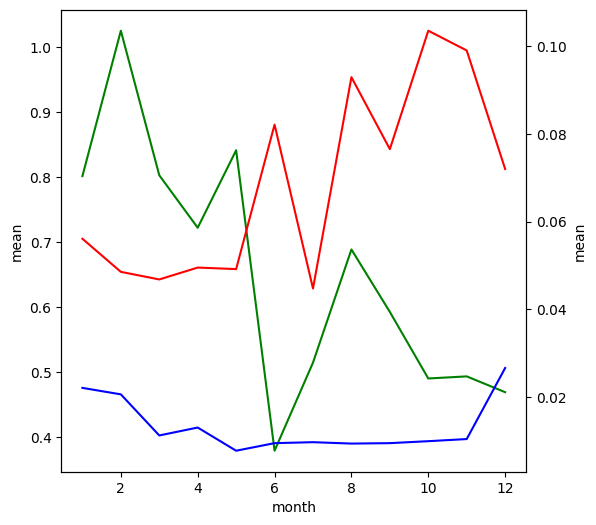

In [77]:
# Patterns
fig,ax=plt.subplots(figsize=(6,6))
sns.lineplot(x='month',y='mean',data=kjedahl_subset_plot,errorbar=('ci',.95),color='green',ax=ax)
ax1=ax.twinx()
sns.lineplot(x='month',y='mean',data=ammonia_subset_plot,errorbar=('ci',.95),color='red',ax=ax1)
sns.lineplot(x='month',y='mean',data=nitrate_subset_plot,errorbar=('ci',.95),color='blue',ax=ax1)

#### Processing Full Nitrate Dataset

In [79]:
hbwq

,DataSourceName,DataSourceCode,StationID,ActualStationID,Latitude,Longitude,SampleDate,SampleTime,ActivityDepth,ActivityDepthUnit,Characteristic,ResultValue,ResultUnit,ValueQualifier,ResultComment,WaterbodyID,WaterbodyName
0,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Fluorides,1.00,mg/l,NaN,NaN,20005,Hillsborough Bay
1,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Fecal Coliform,10.00,cfu/100ml,NaN,NaN,20005,Hillsborough Bay
2,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Dissolved Solids,27200.00,mg/l,NaN,NaN,20005,Hillsborough Bay
3,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Dissolved oxygen saturation,80.80,percent (%),NaN,NaN,20005,Hillsborough Bay
4,FDEP Southwest Regional Operations Center,STORET_21FLTPA,2.74734E+14,NaN,27.792639,-82.413861,2006-04-25,0:00:00,0.2,m,Dissolved oxygen (DO),4.68,mg/l,NaN,NaN,20005,Hillsborough Bay
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,National Ocean Service (NOS) Center for Operat...,NOAA_CO_OPS,8726667,NaN,27.916667,-82.433333,2014-04-09,20:54:00,NaN,NaN,NaN,0.88,NaN,NaN,NaN,20005,Hillsborough Bay
1048571,National Ocean Service (NOS) Center for Operat...,NOAA_CO_OPS,8726667,NaN,27.916667,-82.433333,2014-04-09,20:48:00,NaN,NaN,NaN,0.86,NaN,NaN,NaN,20005,Hillsborough Bay
1048572,National Ocean Service (NOS) Center for Operat...,NOAA_CO_OPS,8726667,NaN,27.916667,-82.433333,2014-04-09,20:42:00,NaN,NaN,NaN,0.85,NaN,NaN,NaN,20005,Hillsborough Bay
1048573,National Ocean Service (NOS) Center for Operat...,NOAA_CO_OPS,8726667,NaN,27.916667,-82.433333,2014-04-09,20:36:00,NaN,NaN,NaN,0.83,NaN,NaN,NaN,20005,Hillsborough Bay


In [82]:
hbwq[['DataSourceName','StationID','Latitude','Longitude','SampleDate','SampleTime','Characteristic','ResultUnit','ResultValue','WaterbodyName']]

,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName
0,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Fluorides,mg/l,1.00,Hillsborough Bay
1,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Fecal Coliform,cfu/100ml,10.00,Hillsborough Bay
2,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Dissolved Solids,mg/l,27200.00,Hillsborough Bay
3,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Dissolved oxygen saturation,percent (%),80.80,Hillsborough Bay
4,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Dissolved oxygen (DO),mg/l,4.68,Hillsborough Bay
...,...,...,...,...,...,...,...,...,...,...
1048570,National Ocean Service (NOS) Center for Operat...,8726667,27.916667,-82.433333,2014-04-09,20:54:00,NaN,NaN,0.88,Hillsborough Bay
1048571,National Ocean Service (NOS) Center for Operat...,8726667,27.916667,-82.433333,2014-04-09,20:48:00,NaN,NaN,0.86,Hillsborough Bay
1048572,National Ocean Service (NOS) Center for Operat...,8726667,27.916667,-82.433333,2014-04-09,20:42:00,NaN,NaN,0.85,Hillsborough Bay
1048573,National Ocean Service (NOS) Center for Operat...,8726667,27.916667,-82.433333,2014-04-09,20:36:00,NaN,NaN,0.83,Hillsborough Bay


In [83]:
hbconcat=hbwq[['DataSourceName','StationID','Latitude','Longitude','SampleDate','SampleTime','Characteristic','ResultUnit','ResultValue','WaterbodyName']]

In [84]:
hbconcat.columns=['DataSourceName','StationID','Latitude','Longitude','SampleDate','SampleTime','Characteristic','ResultUnit','ResultValue','WaterbodyName']

In [85]:
mtbwq

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Latitude,Longitude,DEP_WBID,SampleDate,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
0,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,Cl_mgl,Chloride,NaN,18000.000,NaN,NaN,NaN,18000,mg/l
1,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,550.000,NaN,NaN,NaN,0.55,mg/l
2,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,NH3_N_ugl,"Nitrogen, ammonia as N",NaN,580.000,NaN,NaN,NaN,0.58,mg/l
3,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,NO3_ugl,"Nitrogen, Nitrate (NO3) as N",NaN,10.000,NaN,NaN,NaN,0.01,mg/l
4,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,pH,pH,NaN,8.300,NaN,NaN,NaN,8.3,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
544252,20007,Middle Tampa Bay,WIN_21FLGW,59865,Z4-CN-16003 UNNAMED CANAL,"=""59865""",27.758901,-82.428693,1725B,2022-01-19,0.3,m,TP_mgl,Phosphorus as P,Total,0.140,mg/l,NaN,NaN,0.14,mg/L
544253,20007,Middle Tampa Bay,WIN_21FLGW,59865,Z4-CN-16003 UNNAMED CANAL,"=""59865""",27.758901,-82.428693,1725B,2022-01-19,0.3,m,NH3_N_mgl,"Nitrogen, ammonia as N",Total,0.280,mg/l,NaN,NaN,0.28,mg/L
544254,20007,Middle Tampa Bay,WIN_21FLGW,59865,Z4-CN-16003 UNNAMED CANAL,"=""59865""",27.758901,-82.428693,1725B,2022-01-19,0.3,m,TKN_mgl,"Nitrogen, Kjeldahl",Total,0.920,mg/l,NaN,NaN,0.92,mg/L
544255,20007,Middle Tampa Bay,WIN_21FLGW,59865,Z4-CN-16003 UNNAMED CANAL,"=""59865""",27.758901,-82.428693,1725B,2022-01-19,0.3,m,TN_ugl,Nitrogen,Total,945.000,ug/l,NaN,Water Institute Calculated: TKN + NOx,NaN,NaN


In [86]:
# Daily sample times are not relevant. setting to constant to avoid bad aggregations
mtbwq['SampleTime']='0:00:00'

In [87]:
mtbwq.head(1)

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Latitude,Longitude,DEP_WBID,SampleDate,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit,SampleTime
0,20007,Middle Tampa Bay,USGS_NWIS,274237082325800,10F TAMPA BAY 11,"=""274237082325800""",27.710586,-82.549263,1558B,1972-07-10,NaN,m,Cl_mgl,Chloride,NaN,18000.0,NaN,NaN,NaN,18000,mg/l,0:00:00


In [89]:
# isolate features
mtbconcat=mtbwq[['DataSource','StationID','Latitude','Longitude','SampleDate','SampleTime','Characteristic','Result_Unit','Result_Value','WaterBodyName']]
mtbconcat.columns=['DataSource','StationID','Latitude','Longitude','SampleDate','SampleTime','Characteristic','Result_Unit','Result_Value','WaterBodyName']
mtbconcat.head(3)

,DataSource,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,Result_Unit,Result_Value,WaterBodyName
0,USGS_NWIS,274237082325800,27.710586,-82.549263,1972-07-10,0:00:00,Chloride,NaN,18000.0,Middle Tampa Bay
1,USGS_NWIS,274237082325800,27.710586,-82.549263,1972-07-10,0:00:00,"Nitrogen, ammonia as N",NaN,550.0,Middle Tampa Bay
2,USGS_NWIS,274237082325800,27.710586,-82.549263,1972-07-10,0:00:00,"Nitrogen, ammonia as N",NaN,580.0,Middle Tampa Bay


In [90]:
# null check
mtbconcat.DataSource.isna().value_counts()

DataSource
False    544257
Name: count, dtype: int64

In [92]:
# rename units to match HB
mtbconcat.rename(columns={'WaterBodyName':'WaterbodyName','DataSource':'DataSourceName','Result_Unit':'ResultUnit','Result_Value':'ResultValue'},inplace=True)
mtbconcat.head(1)

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\600712440.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtbconcat.rename(columns={'WaterBodyName':'WaterbodyName','DataSource':'DataSourceName','Result_Unit':'ResultUnit','Result_Value':'ResultValue'},inplace=True)


,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName
0,USGS_NWIS,274237082325800,27.710586,-82.549263,1972-07-10,0:00:00,Chloride,NaN,18000.0,Middle Tampa Bay


In [93]:
# Union HB and MTB into 1 df
combwq=pd.concat([hbconcat,mtbconcat])
combwq.head(5)

,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName
0,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Fluorides,mg/l,1.00,Hillsborough Bay
1,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Fecal Coliform,cfu/100ml,10.00,Hillsborough Bay
2,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Dissolved Solids,mg/l,27200.00,Hillsborough Bay
3,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Dissolved oxygen saturation,percent (%),80.80,Hillsborough Bay
4,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-04-25,0:00:00,Dissolved oxygen (DO),mg/l,4.68,Hillsborough Bay


In [94]:
# check nitrogen compounds isolated
combwq[combwq.Characteristic.str.contains('Nit')==True].Characteristic.value_counts()

Characteristic
Nitrogen, Kjeldahl                                       44832
Nitrogen, ammonia as N                                   41417
Nitrogen                                                 35759
Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N             34215
Nitrogen, organic                                        31881
Nitrogen, Nitrate (NO3) as N                              5422
Nitrogen, ammonia (NH3) + ammonium (NH4)                  2157
Nitrogen, Nitrite (NO2) as N                               560
Nitrogen, Ammonium (NH4) as N                               28
Nitrogen, mixed forms (NH3)+(NH4)+organic+(NO2)+(NO3)       14
Nitrogen, ammonium (NH4) as N                                5
Name: count, dtype: int64

In [95]:
combwq.shape

(1592832, 10)

In [96]:
# Export data for processing outside of notebook
combwq.to_csv('NIT_FINAL.csv')

In [97]:
### There was one sampling station / service that was producing highly irregular nitrate values
### I suspect that they were correct - but there were so few measurements that, as significant outliers, it was better
### to remove them from the dataset. They were orders higher.

### Samples for this station from all datasets needs to be removed
combwq.drop(combwq[combwq.StationID=='560'].index,inplace=True)

In [98]:
#Checking to ensure iso of nitrates
combwq[combwq.Characteristic.str.lower().str.contains('nitra','nitri')==True]

,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName
18,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-10-03 00:00:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",ug/l,5.000,Hillsborough Bay
81,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-10-10 00:00:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",ug/l,4.000,Hillsborough Bay
89,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-03-06 00:00:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",ug/l,32.000,Hillsborough Bay
116,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-02-14 00:00:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",ug/l,14.000,Hillsborough Bay
159,FDEP Southwest Regional Operations Center,2.74734E+14,27.792639,-82.413861,2006-11-07 00:00:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",ug/l,8.000,Hillsborough Bay
...,...,...,...,...,...,...,...,...,...,...
544162,PINELLAS,E6,27.811150,-82.594590,2012-12-05 11:11:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",NaN,20.000,Middle Tampa Bay
544176,PINELLAS,E6,27.791200,-82.607350,2012-12-05 11:56:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",NaN,20.000,Middle Tampa Bay
544196,PINELLAS,E6,27.791200,-82.607350,2012-12-05 11:56:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",mg/l,0.020,Middle Tampa Bay
544236,WIN_21FLGW,59865,27.758901,-82.428693,2022-01-19 00:00:00,0:00:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",ug/l,25.000,Middle Tampa Bay


In [99]:
combwq[combwq.Characteristic.str.lower().str.contains('nitra','nitri')==True].shape

(39588, 10)

In [100]:
# Isolate each compound of interest
nitrates=combwq[combwq.Characteristic.str.lower().str.contains('nitra','nitri')==True]
kjeldahl=combwq[combwq.Characteristic.str.lower().str.contains('kjel')==True]
ammonia=combwq[combwq.Characteristic.str.lower().str.contains('ammo')==True]

In [101]:
print(nitrates.shape)
print(kjeldahl.shape)
print(ammonia.shape)

(39588, 10)
(44774, 10)
(43553, 10)


In [102]:
# Select only mg/l units
nitrates_mg=nitrates[nitrates.ResultUnit=='mg/l']
kjeldahl_mg=kjeldahl[kjeldahl.ResultUnit=='mg/l']
ammonia_mg=ammonia[ammonia.ResultUnit=='mg/l']

In [103]:
# sample size reduced. Many rows were duplicates using the other measurement unit.
print(nitrates_mg.shape)
print(kjeldahl_mg.shape)
print(ammonia_mg.shape)

(19650, 10)
(22302, 10)
(22151, 10)


In [104]:
# drop null values. Not imputing anything yet
nitrates_mg.dropna(inplace=True)
kjeldahl_mg.dropna(inplace=True)
ammonia_mg.dropna(inplace=True)
print(nitrates_mg.shape)
print(kjeldahl_mg.shape)
print(ammonia_mg.shape)

(19527, 10)
(22291, 10)
(22074, 10)


C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\1778963100.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nitrates_mg.dropna(inplace=True)
C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\1778963100.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kjeldahl_mg.dropna(inplace=True)
C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\1778963100.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ammonia_mg.dropna(inplace=True)


In [105]:
#Check for nulls
nitrates_mg.ResultValue.isna().value_counts()

ResultValue
False    19527
Name: count, dtype: int64

In [106]:
#Check for nulls
ammonia_mg.ResultValue.isna().value_counts()

ResultValue
False    22074
Name: count, dtype: int64

In [107]:
#Check for nulls
kjeldahl_mg.ResultValue.isna().value_counts()

ResultValue
False    22291
Name: count, dtype: int64

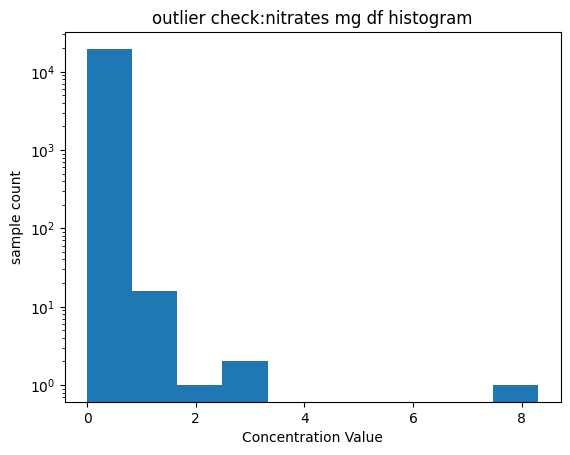

In [108]:
# distribution checks. log scale
plt.hist(nitrates_mg.ResultValue)
plt.yscale('log')
plt.ylabel('sample count')
plt.xlabel('Concentration Value')
plt.title('outlier check:nitrates mg df histogram')
plt.show()

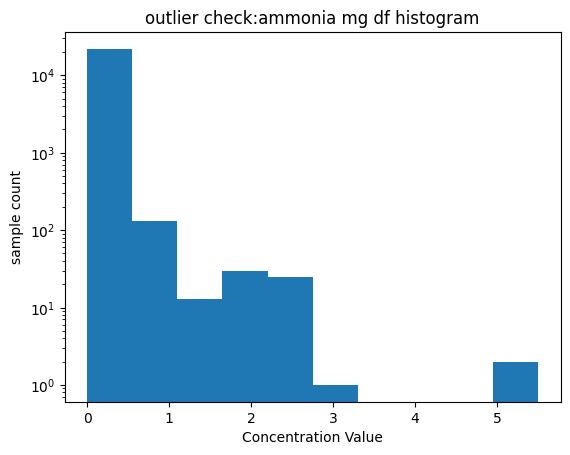

In [109]:
# distribution checks. log scale

plt.hist(ammonia_mg.ResultValue)
plt.yscale('log')
plt.ylabel('sample count')
plt.xlabel('Concentration Value')
plt.title('outlier check:ammonia mg df histogram')
plt.show()

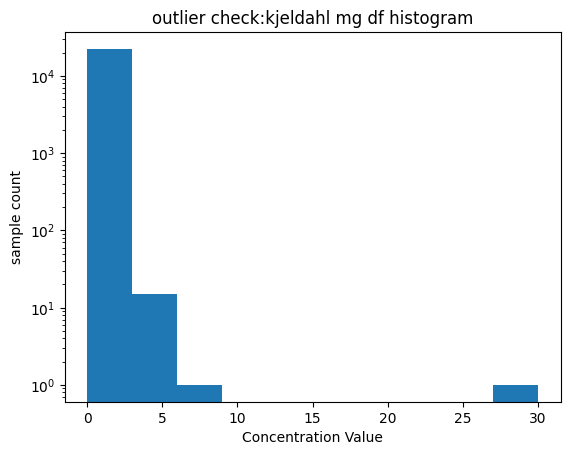

In [110]:
# distribution checks. log scale

plt.hist(kjeldahl_mg.ResultValue)
plt.yscale('log')
plt.ylabel('sample count')
plt.xlabel('Concentration Value')
plt.title('outlier check:kjeldahl mg df histogram')
plt.show()

In [111]:
## This data point will be dropped once the dates are filtered to the period of study
kjeldahl_mg[kjeldahl_mg.ResultValue>10]

,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName
205105,LEGACYSTORET_21FLA,24020904,27.812694,-82.484278,1975-05-28,0:00:00,"Nitrogen, Kjeldahl",mg/l,30.0,Middle Tampa Bay


In [112]:
nitrates_mg_temp=nitrates_mg.reset_index()
#nitrates_mg[nitrates_mg.ResultValue>3].reset_index()
nit_iloc=nitrates_mg_temp[nitrates_mg_temp.ResultValue>2.5].index
for i in nit_iloc:
    nitrates_mg.iloc[i,-2]=nitrates_mg.iloc[i,-2]/1000

In [113]:
# standardize units
kjeldahl_mg['month']=kjeldahl_mg.SampleDate.dt.month
ammonia_mg['month']=ammonia_mg.SampleDate.dt.month
nitrates_mg['month']=nitrates_mg.SampleDate.dt.month

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\666384419.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kjeldahl_mg['month']=kjeldahl_mg.SampleDate.dt.month
C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\666384419.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ammonia_mg['month']=ammonia_mg.SampleDate.dt.month
C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\666384419.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

In [114]:
# Isolate features of interest
kjeldahlsub=kjeldahl_mg[['DataSourceName','StationID','SampleDate','SampleTime','ResultValue','ResultUnit','Latitude','Longitude','month']]
ammoniasub=ammonia_mg[['DataSourceName','StationID','SampleDate','SampleTime','ResultValue','ResultUnit','Latitude','Longitude','month']]
nitratesub=nitrates_mg[['DataSourceName','StationID','SampleDate','SampleTime','ResultValue','ResultUnit','Latitude','Longitude','month']]

In [115]:
# Checking for outliers
ammoniasub[ammoniasub.ResultValue>2]

,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude,month
79924,EPC_ROUTINE_MONITORING,136,1981-11-04 13:00:00,0:00:00,5.50,mg/l,27.680000,-82.499199,11
94132,HCEPC_WQ,136,1981-11-04 00:00:00,0:00:00,5.50,mg/l,27.680000,-82.499200,11
219718,EPC_ROUTINE_MONITORING,13,1974-10-23 12:40:00,0:00:00,2.05,mg/l,27.811800,-82.523201,10
473876,HCEPC_WQ,13,1974-10-23 00:00:00,0:00:00,2.05,mg/l,27.811700,-82.523100,10
501730,USGS_NWIS,274235082324900,1971-06-01 00:00:00,0:00:00,2.10,mg/l,27.710030,-82.546763,6
501751,USGS_NWIS,274235082324900,1971-06-02 00:00:00,0:00:00,2.20,mg/l,27.710030,-82.546763,6
501752,USGS_NWIS,274235082324900,1971-06-02 00:00:00,0:00:00,2.30,mg/l,27.710030,-82.546763,6
501753,USGS_NWIS,274235082324900,1971-06-02 00:00:00,0:00:00,2.40,mg/l,27.710030,-82.546763,6
501754,USGS_NWIS,274235082324900,1971-06-02 00:00:00,0:00:00,2.50,mg/l,27.710030,-82.546763,6
501755,USGS_NWIS,274235082324900,1971-06-02 00:00:00,0:00:00,2.80,mg/l,27.710030,-82.546763,6


In [116]:
# Using a temp table to work around coding errors
# Looking at outlier data. Assess whether unit conv was issue
index_amm_temp=ammoniasub[ammoniasub.ResultValue>3].index
ammoniasub.loc[index_amm_temp].ResultValue=ammoniasub.loc[index_amm_temp].ResultValue/1000

In [846]:
# station suspected culprit for outlier values
kjeldahl_mg[kjeldahl_mg.StationID=='560']

,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName,month


In [847]:
# create year col
kjeldahlsub['year']=kjeldahlsub.SampleDate.dt.year
ammoniasub['year']=ammoniasub.SampleDate.dt.year
nitratesub['year']=nitratesub.SampleDate.dt.year

In [848]:
# creating a col that sets all months to a starting day of 1
kjeldahlsub['day']=1
ammoniasub['day']=1
nitratesub['day']=1

In [849]:
# format dt
kjeldahlsub['DateMonth']=pd.to_datetime(kjeldahlsub.astype(str).month+'-'+kjeldahlsub.astype(str).day+'-'+kjeldahlsub.astype(str).year)
ammoniasub['DateMonth']=pd.to_datetime(ammoniasub.astype(str).month+'-'+ammoniasub.astype(str).day+'-'+ammoniasub.astype(str).year)
nitratesub['DateMonth']=pd.to_datetime(nitratesub.astype(str).month+'-'+nitratesub.astype(str).day+'-'+nitratesub.astype(str).year)

In [850]:
# isolate dataset to years of interest in the study
kjeldahlsub=kjeldahlsub[kjeldahlsub.year>1989]
nitratesub=nitratesub[nitratesub.year>1989]
ammoniasub=ammoniasub[ammoniasub.year>1989]

In [851]:
# create better date column
nitratesub.SampleDate=pd.to_datetime(nitratesub.SampleDate.astype(str).str.slice(0,10))
kjeldahlsub.SampleDate=pd.to_datetime(kjeldahlsub.SampleDate.astype(str).str.slice(0,10))
ammoniasub.SampleDate=pd.to_datetime(ammoniasub.SampleDate.astype(str).str.slice(0,10))

In [852]:
#outlier check
kjeldahlsub[kjeldahlsub.ResultValue>4]

,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude,month,year,day,DateMonth
168160,Tampa Bay Water,M34,2009-07-27,0:00:00,6.2000,mg/l,27.928000,-82.415000,7,2009,1,2009-07-01
425580,EPC Monthly Routine Water Monitoring,70,1994-10-11,11:05:00,4.1300,mg/l,27.908899,-82.463203,10,1994,1,1994-10-01
439741,EPC Water Quality Data,70,1994-10-11,0:00:00,4.1300,mg/l,27.908888,-82.463055,10,1994,1,1994-10-01
86822,EPC_ROUTINE_MONITORING,136,2003-08-13,0:00:00,4.0600,mg/l,27.680000,-82.499199,8,2003,1,2003-08-01
100452,HCEPC_WQ,136,2003-08-13,0:00:00,4.0600,mg/l,27.680000,-82.499200,8,2003,1,2003-08-01
191363,HCEPC_WQ,19,1998-06-23,0:00:00,4.9357,mg/l,27.693300,-82.555800,6,1998,1,1998-06-01
310031,EPC_ROUTINE_MONITORING,19,1998-06-23,0:00:00,4.9400,mg/l,27.693399,-82.555901,6,1998,1,1998-06-01


**Only Kjeldahl in the filtered dataset follow a normal distribution, whereas Nitrates and Ammonia are heavily right-skew**
<br>

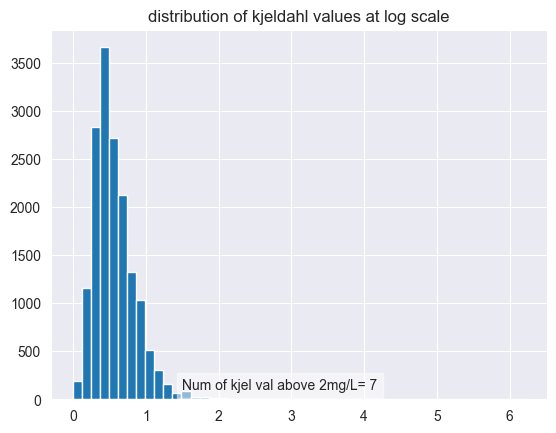

In [853]:
### Only Kjeldahl has a normal distribution

plt.hist(kjeldahlsub.ResultValue,bins=50)
#"plt.yscale('log')
plt.title('distribution of kjeldahl values at log scale')
plt.text(1.5, 100, f'Num of kjel val above 2mg/L= {kjeldahlsub[kjeldahlsub.ResultValue>4].ResultValue.count()}', bbox=dict(facecolor='white', alpha=0.5))
plt.show()

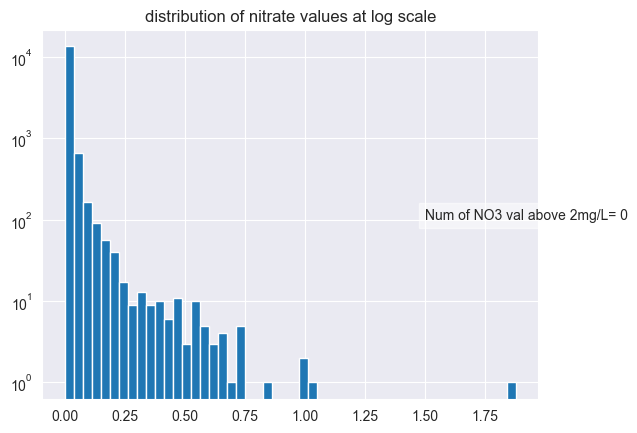

In [854]:
plt.hist(nitratesub.ResultValue,bins=50)
plt.yscale('log')
plt.title('distribution of nitrate values at log scale')
plt.text(1.5, 100, f'Num of NO3 val above 2mg/L= {nitratesub[nitratesub.ResultValue>2].ResultValue.count()}', bbox=dict(facecolor='white', alpha=0.5))
plt.show()

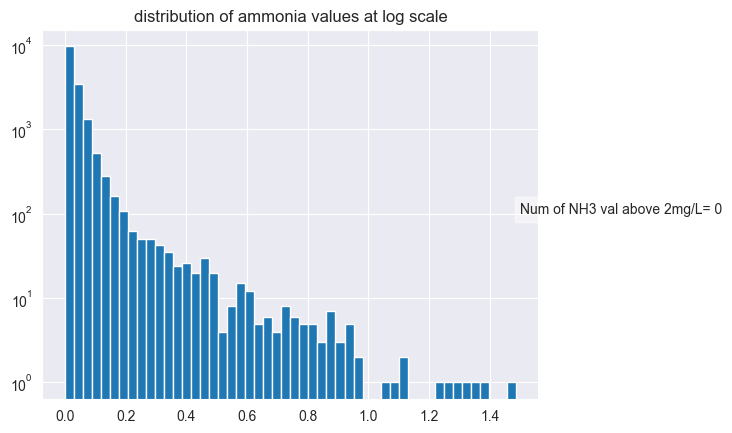

In [855]:
plt.hist(ammoniasub.ResultValue,bins=50)
plt.yscale('log')
plt.title('distribution of ammonia values at log scale')
plt.text(1.5, 100, f'Num of NH3 val above 2mg/L= {ammoniasub[ammoniasub.ResultValue>2].ResultValue.count()}', bbox=dict(facecolor='white', alpha=0.5))
plt.show()

In [856]:
# Setting checkpoint
ksub=kjeldahlsub.copy()
asub=ammoniasub.copy()
nsub=nitratesub.copy()

In [857]:
# Adding some columns to standardize dates and make next steps easier

ksub['week']=ksub.SampleDate.dt.isocalendar().week
asub['week']=asub.SampleDate.dt.isocalendar().week
nsub['week']=nsub.SampleDate.dt.isocalendar().week
ksub['adj_date']=pd.to_datetime(ksub['year'].astype(str) + '-W' + ksub['week'].astype(str) + '-1', format='%Y-W%W-%w')
asub['adj_date']=pd.to_datetime(asub['year'].astype(str) + '-W' + asub['week'].astype(str) + '-1', format='%Y-W%W-%w')
nsub['adj_date']=pd.to_datetime(nsub['year'].astype(str) + '-W' + nsub['week'].astype(str) + '-1', format='%Y-W%W-%w')
ksub.drop(columns='DateMonth',inplace=True)
asub.drop(columns='DateMonth',inplace=True)
nsub.drop(columns='DateMonth',inplace=True)
ksub.sort_values(by='SampleDate',inplace=True)
asub.sort_values(by='SampleDate',inplace=True)
nsub.sort_values(by='SampleDate',inplace=True)

In [858]:
# There are missing weeks that need to be imputed. This should be weekly data from 1990-2024
# Creating a df with all weeks, including missing values. Will outer join all nitrate groups, remove duplicates, impute or interpolate missing values
data = []
for year in range(1990, 2025):  # 24 years from 1990 to 2024
    for week in range(1, 53):  # Weeks 1 to 52
        data.append([year, week])
weekly=pd.DataFrame(data=data,columns=['year','week'])
weekly['adj_date']=pd.to_datetime(weekly['year'].astype(str) + '-W' + weekly['week'].astype(str) + '-1', format='%Y-W%W-%w')
print(len(data))
print(len(weekly))
print(weekly.min())
weekly.max()

1820
1820
year                       1990
week                          1
adj_date    1990-01-01 00:00:00
dtype: object


year                       2024
week                         52
adj_date    2024-12-23 00:00:00
dtype: object

In [859]:
# Make sure the datasets are as clean as possible (missing values dealt with later)
ksub.drop_duplicates(inplace=True)
asub.drop_duplicates(inplace=True)
nsub.drop_duplicates(inplace=True)

print(ksub.shape)
print(asub.shape)
print(nsub.shape)

(16150, 13)
(15779, 13)
(14303, 13)


In [860]:
# outer join kjeldahl df, no loss of data
test=weekly.merge(ksub,left_on=weekly.adj_date,right_on=ksub.adj_date,how='outer',suffixes=('_dt','_K'))

In [861]:
# adj_date_dt remains complete, dropping key_0
test.info()
test.drop(columns='key_0',inplace=True)
test.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16402 entries, 0 to 16401
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   key_0           16402 non-null  datetime64[ns]
 1   year_dt         16402 non-null  int64         
 2   week_dt         16402 non-null  int64         
 3   adj_date_dt     16402 non-null  datetime64[ns]
 4   DataSourceName  16150 non-null  object        
 5   StationID       16150 non-null  object        
 6   SampleDate      16150 non-null  datetime64[ns]
 7   SampleTime      16150 non-null  object        
 8   ResultValue     16150 non-null  float64       
 9   ResultUnit      16150 non-null  object        
 10  Latitude        16150 non-null  float64       
 11  Longitude       16150 non-null  float64       
 12  month           16150 non-null  float64       
 13  year_K          16150 non-null  float64       
 14  day             16150 non-null  float64       
 15  we

,year_dt,week_dt,adj_date_dt,DataSourceName,StationID,SampleDate,SampleTime,ResultValue,ResultUnit,Latitude,Longitude,month,year_K,day,week_K,adj_date_K
0,1990,1,1990-01-01,HCEPC_WQ,32,1990-01-03,0:00:00,0.54,mg/l,27.7931,-82.5706,1.0,1990.0,1.0,1,1990-01-01
1,1990,1,1990-01-01,HCEPC_WQ,13,1990-01-03,0:00:00,0.53,mg/l,27.8117,-82.5231,1.0,1990.0,1.0,1,1990-01-01


In [862]:
# outer join ammonia results, no loss of data
# all units are standardized to mg/l
# need to keep key_0 as it's the only complete date column.
test2=test.merge(asub['ResultValue'],left_on=[test.adj_date_dt,test.DataSourceName,test.StationID],right_on=[asub.adj_date,asub.DataSourceName,asub.StationID],how='outer',suffixes=('_dt','_A')).drop_duplicates()
test2.rename(columns={'key_0':'adj_date'},inplace=True)
test2.drop(columns=['key_1','key_2'],inplace=True)

In [863]:
# outer join nitrate results, no loss of data
# all units are standardized to mg/l
# last merge

test3=test2.merge(nsub['ResultValue'],left_on=[test2.adj_date,test2.DataSourceName,test2.StationID],right_on=[nsub.adj_date,nsub.DataSourceName,nsub.StationID],how='outer',suffixes=('_dt','_N')).drop_duplicates()

In [864]:
test3

,key_0,key_1,key_2,adj_date,year_dt,week_dt,adj_date_dt,DataSourceName,StationID,SampleDate,SampleTime,ResultValue_dt,ResultUnit,Latitude,Longitude,month,year_K,day,week_K,adj_date_K,ResultValue_A,ResultValue
0,1990-01-01,EPC_ROUTINE_MONITORING,13,1990-01-01,1990.0,1.0,1990-01-01,EPC_ROUTINE_MONITORING,13,1990-01-03,0:00:00,0.53,mg/l,27.811800,-82.523201,1.0,1990.0,1.0,1,1990-01-01,0.04,0.003
1,1990-01-01,EPC_ROUTINE_MONITORING,32,1990-01-01,1990.0,1.0,1990-01-01,EPC_ROUTINE_MONITORING,32,1990-01-03,0:00:00,0.54,mg/l,27.793200,-82.570701,1.0,1990.0,1.0,1,1990-01-01,0.03,0.003
2,1990-01-01,EPC_ROUTINE_MONITORING,33,1990-01-01,1990.0,1.0,1990-01-01,EPC_ROUTINE_MONITORING,33,1990-01-03,0:00:00,0.68,mg/l,27.826099,-82.567497,1.0,1990.0,1.0,1,1990-01-01,0.03,0.003
3,1990-01-01,HCEPC_WQ,13,1990-01-01,1990.0,1.0,1990-01-01,HCEPC_WQ,13,1990-01-03,0:00:00,0.53,mg/l,27.811700,-82.523100,1.0,1990.0,1.0,1,1990-01-01,0.04,0.010
4,1990-01-01,HCEPC_WQ,32,1990-01-01,1990.0,1.0,1990-01-01,HCEPC_WQ,32,1990-01-03,0:00:00,0.54,mg/l,27.793100,-82.570600,1.0,1990.0,1.0,1,1990-01-01,0.03,0.010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25142,2024-11-25,NaN,NaN,2024-11-25,2024.0,48.0,2024-11-25,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaT,NaN,NaN
25143,2024-12-02,NaN,NaN,2024-12-02,2024.0,49.0,2024-12-02,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaT,NaN,NaN
25144,2024-12-09,NaN,NaN,2024-12-09,2024.0,50.0,2024-12-09,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaT,NaN,NaN
25145,2024-12-16,NaN,NaN,2024-12-16,2024.0,51.0,2024-12-16,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaT,NaN,NaN


In [865]:
test3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22461 entries, 0 to 25146
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   key_0           22461 non-null  datetime64[ns]
 1   key_1           20886 non-null  object        
 2   key_2           20886 non-null  object        
 3   adj_date        20439 non-null  datetime64[ns]
 4   year_dt         19116 non-null  float64       
 5   week_dt         19116 non-null  float64       
 6   adj_date_dt     19116 non-null  datetime64[ns]
 7   DataSourceName  18864 non-null  object        
 8   StationID       18864 non-null  object        
 9   SampleDate      18864 non-null  datetime64[ns]
 10  SampleTime      18864 non-null  object        
 11  ResultValue_dt  18864 non-null  float64       
 12  ResultUnit      18864 non-null  object        
 13  Latitude        18864 non-null  float64       
 14  Longitude       18864 non-null  float64       
 15  month  

In [866]:
# Isolate columns of interest
nmerge_stage=test3[test3.columns[[0,7,8,13,14,11,20,21]]]

In [867]:
nmerge_stage.head(1)

,key_0,DataSourceName,StationID,Latitude,Longitude,ResultValue_dt,ResultValue_A,ResultValue
0,1990-01-01,EPC_ROUTINE_MONITORING,13,27.8118,-82.523201,0.53,0.04,0.003


In [868]:
# Rename columns

nmerge_stage.columns=['date_adj','DataSourceName','StationID','Lat','Long','ResultValue_K','ResultValue_A','ResultValue_N']
print(nmerge_stage.shape)
nmerge_stage.head(2)

(22461, 8)


,date_adj,DataSourceName,StationID,Lat,Long,ResultValue_K,ResultValue_A,ResultValue_N
0,1990-01-01,EPC_ROUTINE_MONITORING,13,27.8118,-82.523201,0.53,0.04,0.003
1,1990-01-01,EPC_ROUTINE_MONITORING,32,27.7932,-82.570701,0.54,0.03,0.003


In [869]:
# Establish independent copy of merged base table
nmerge_base=nmerge_stage.copy()

In [870]:
nmerge_base[nmerge_base.ResultValue_N>2]

,date_adj,DataSourceName,StationID,Lat,Long,ResultValue_K,ResultValue_A,ResultValue_N


In [871]:
nmerge_base

,date_adj,DataSourceName,StationID,Lat,Long,ResultValue_K,ResultValue_A,ResultValue_N
0,1990-01-01,EPC_ROUTINE_MONITORING,13,27.811800,-82.523201,0.53,0.04,0.003
1,1990-01-01,EPC_ROUTINE_MONITORING,32,27.793200,-82.570701,0.54,0.03,0.003
2,1990-01-01,EPC_ROUTINE_MONITORING,33,27.826099,-82.567497,0.68,0.03,0.003
3,1990-01-01,HCEPC_WQ,13,27.811700,-82.523100,0.53,0.04,0.010
4,1990-01-01,HCEPC_WQ,32,27.793100,-82.570600,0.54,0.03,0.010
...,...,...,...,...,...,...,...,...
25142,2024-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25143,2024-12-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25144,2024-12-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25145,2024-12-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [872]:
pwd

'J:\\Brainstation\\BS Git\\Tampa_Apollo_AnthropogenicIndex\\notebooks'

In [873]:
# Need to remove the last few rows of the df because they are empty (samples not taken yet)

In [874]:
merge_len=len(nmerge_base)

In [875]:
nmerge_base=nmerge_base[:merge_len-17]

In [876]:
nmerge_base['ResultValue_O']=nmerge_base.ResultValue_K-nmerge_base.ResultValue_A

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\2253400103.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: xlabel='ResultValue_K', ylabel='ResultValue_O'>

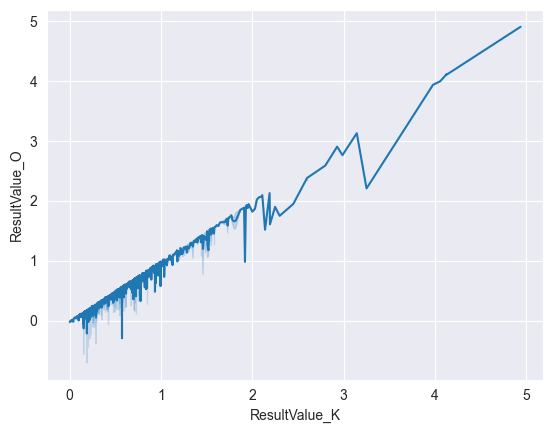

In [877]:
sns.lineplot(x='ResultValue_K',y='ResultValue_O',data=nmerge_base)

In [878]:
# Base table is fully cleaned Nitrogen data
# Export the raw data table before aggregations start.

In [879]:
nmerge_base.to_csv('raw_values_nitrates.csv')

In [880]:
nmerge_base

,date_adj,DataSourceName,StationID,Lat,Long,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
0,1990-01-01,EPC_ROUTINE_MONITORING,13,27.811800,-82.523201,0.530,0.040,0.003,0.490
1,1990-01-01,EPC_ROUTINE_MONITORING,32,27.793200,-82.570701,0.540,0.030,0.003,0.510
2,1990-01-01,EPC_ROUTINE_MONITORING,33,27.826099,-82.567497,0.680,0.030,0.003,0.650
3,1990-01-01,HCEPC_WQ,13,27.811700,-82.523100,0.530,0.040,0.010,0.490
4,1990-01-01,HCEPC_WQ,32,27.793100,-82.570600,0.540,0.030,0.010,0.510
...,...,...,...,...,...,...,...,...,...
25125,2024-08-19,WIN_21FLHILL,21,27.662500,-82.563904,0.134,0.054,0.024,0.080
25126,2024-08-19,WIN_21FLHILL,28,27.708401,-82.609200,0.134,0.057,0.024,0.077
25127,2024-08-19,WIN_21FLHILL,82,27.751101,-82.571800,0.134,0.054,0.079,0.080
25128,2024-08-19,WIN_21FLHILL,84,27.729000,-82.498703,0.138,0.070,0.025,0.068


In [881]:
# Aggregate at weekly date intervals
nmerge_stage2=nmerge_base.groupby('date_adj').agg({
    'ResultValue_K':'mean',
    'ResultValue_A':'mean',
    'ResultValue_N':'mean',
    'ResultValue_O':'mean'
})

In [882]:
# Aggregate at weekly date intervals
nmerge_stage2constr=nmerge_base.groupby(['date_adj','StationID']).agg({
    'ResultValue_K':'mean',
    'ResultValue_A':'mean',
    'ResultValue_N':'mean',
    'ResultValue_O':'mean'
})

In [883]:
nmerge_stage2constr.reset_index()

,date_adj,StationID,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
0,1990-01-01,13,0.530,0.040,0.0065,0.490
1,1990-01-01,32,0.540,0.030,0.0065,0.510
2,1990-01-01,33,0.680,0.030,0.0065,0.650
3,1990-01-08,11,0.480,0.050,0.0065,0.430
4,1990-01-08,14,0.580,0.040,0.0065,0.540
...,...,...,...,...,...,...
11527,2024-08-19,28,0.134,0.057,0.0240,0.077
11528,2024-08-19,54,0.134,0.066,0.0470,0.068
11529,2024-08-19,82,0.134,0.054,0.0790,0.080
11530,2024-08-19,84,0.138,0.070,0.0250,0.068


In [884]:
nitrates_mg.head(1)

,DataSourceName,StationID,Latitude,Longitude,SampleDate,SampleTime,Characteristic,ResultUnit,ResultValue,WaterbodyName,month
25450,EPC Water Quality Data,44,27.923609,-82.480832,2006-01-10,10:08:00,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",mg/l,0.006,Hillsborough Bay,1


In [885]:
np.nan

nan

In [886]:
nmerge_stage2.loc[nmerge_stage2.ResultValue_A == 0, 'ResultValue_A'] = np.nan

In [887]:
nmerge_stage4.loc[nmerge_stage4.ResultValue_N == 0, 'ResultValue_A'] = np.nan

In [888]:
# Extra weeks beyond the end of the dataset (8/26/24)
# Cut out extra weeks
# Check for nulls
nmerge_stage3=nmerge_stage2
nmerge_stage3.isna().sum()

ResultValue_K    235
ResultValue_A    250
ResultValue_N    248
ResultValue_O    258
dtype: int64

There are fewer missing values than expected! That's good, interpolation shouldn't be a problem. <br>
Seasonality shouldn't be expected for periods less than a month. <br>
Interpolation with 2 period in both directions should give best approximation of values.<br>

In [889]:
nmerge_stage4=nmerge_stage3.interpolate(method='linear', limit_direction='both', limit=3)

In [891]:
#### for col in nmerge_stage4.columns:
if (nmerge_stage4[col] == 0).any():
    print(f"Column '{col}' contains zero values.")
else:
    print(f"Column '{col}' does not contain zero values.")

# Check for zeros in the entire DataFrame
if (nmerge_stage4 == 0).any().any():
    print("The DataFrame contains zero values.")
else:
    print("The DataFrame does not contain zero values.")

KeyError: 1

In [892]:
nmerge.isna().sum()


ResultValue_K        0
ResultValue_A        0
ResultValue_N        0
ResultValue_O        0
K_moving_average    35
A_moving_average    35
N_moving_average    35
O_moving_average    35
dtype: int64

In [893]:
nmerge_stage4.loc[nmerge_stage4.ResultValue_N == 0, 'ResultValue_N'] = np.nan

In [894]:
nmerge_stage4=nmerge_stage4.interpolate(method='linear', limit_direction='forward', limit=7)

In [895]:
nmerge_stage4[nmerge_stage4.ResultValue_A==0]

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
date_adj,,,,


In [896]:
nmerge_stage4[nmerge_stage4.ResultValue_N==0]

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
date_adj,,,,


In [897]:
nmerge=nmerge_stage4

In [898]:
#### for col in nmerge_stage4.columns:
if (nmerge[col] == 0).any():
    print(f"Column '{col}' contains zero values.")
else:
    print(f"Column '{col}' does not contain zero values.")

# Check for zeros in the entire DataFrame
if (nmerge_stage4 == 0).any().any():
    print("The DataFrame contains zero values.")
else:
    print("The DataFrame does not contain zero values.")

KeyError: 1

In [899]:
print(f'{nmerge.info()}\n\n\nSHAPE:\n{nmerge.shape}\n\n\n\nDESCRIBE:\n{nmerge.describe()}')
nmerge.head(2)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1803 entries, 1990-01-01 to 2024-08-26
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ResultValue_K  1803 non-null   float64
 1   ResultValue_A  1803 non-null   float64
 2   ResultValue_N  1803 non-null   float64
 3   ResultValue_O  1803 non-null   float64
dtypes: float64(4)
memory usage: 70.4 KB
None


SHAPE:
(1803, 4)



DESCRIBE:
       ResultValue_K  ResultValue_A  ResultValue_N  ResultValue_O
count    1803.000000    1803.000000    1803.000000    1803.000000
mean        0.575472       0.055654       0.023969       0.520288
std         0.298930       0.084185       0.034992       0.313489
min         0.060000       0.000833       0.000500      -0.772167
25%         0.383333       0.018254       0.007171       0.327386
50%         0.511389       0.030000       0.014000       0.456571
75%         0.704722       0.056542       0.024311       0.648583
max   

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
date_adj,,,,
1990-01-01,0.583333,0.033333,0.006500,0.550000
1990-01-08,0.723684,0.056842,0.022826,0.618667


In [900]:
# Fixing the datetime index

# Create a new DateTimeIndex with the correct weekday alignment
new_index = pd.date_range(start=nmerge.index[0], periods=len(nmerge), freq='W')

# Assign the new index to the DataFrame
nmerge = nmerge.set_index(new_index)

# Verify the change
print(nmerge.index)

DatetimeIndex(['1990-01-07', '1990-01-14', '1990-01-21', '1990-01-28',
               '1990-02-04', '1990-02-11', '1990-02-18', '1990-02-25',
               '1990-03-04', '1990-03-11',
               ...
               '2024-05-19', '2024-05-26', '2024-06-02', '2024-06-09',
               '2024-06-16', '2024-06-23', '2024-06-30', '2024-07-07',
               '2024-07-14', '2024-07-21'],
              dtype='datetime64[ns]', length=1803, freq='W-SUN')


In [901]:
print(f'nmerge shape:\n {nmerge.shape}\n')
print(f'######\n\nMerge1 duplicates: \n{nmerge.duplicated().value_counts}\n\n######\nResultAction:')
if nmerge.duplicated().any():
    print('True.Duplicates, drop\n')
    nmerge.drop_duplicates(inplace=True)
else:
    print('False. No Duplicates, no drop\n')
print(f'######\n\nNulls:\n{nmerge.isna().sum()}\n')
print(f'######\nnew shape:{nmerge.shape}')
if nmerge.columns[0]=='key_0':
    print('Newly created key columns not dropped\nColumns now dropped')
    nmerge.drop(columns=nmerge.columns[[0,1,2]],inplace=True)
else:
    print('Columns not dropped')
nmerge.head(3)


nmerge shape:
 (1803, 4)

######

Merge1 duplicates: 
<bound method IndexOpsMixin.value_counts of 1990-01-07    False
1990-01-14    False
1990-01-21    False
1990-01-28    False
1990-02-04    False
              ...  
2024-06-23    False
2024-06-30    False
2024-07-07    False
2024-07-14    False
2024-07-21    False
Freq: W-SUN, Length: 1803, dtype: bool>

######
ResultAction:
False. No Duplicates, no drop

######

Nulls:
ResultValue_K    0
ResultValue_A    0
ResultValue_N    0
ResultValue_O    0
dtype: int64

######
new shape:(1803, 4)
Columns not dropped


,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.618667
1990-01-21,0.408333,0.071667,0.006500,0.336667


<Axes: xlabel='ResultValue_K', ylabel='ResultValue_O'>

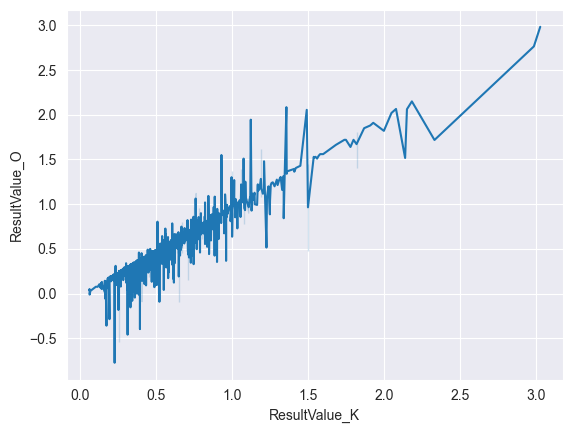

In [902]:
sns.lineplot(x='ResultValue_K',y='ResultValue_O',data=nmerge)

<Figure size 1000x1000 with 0 Axes>

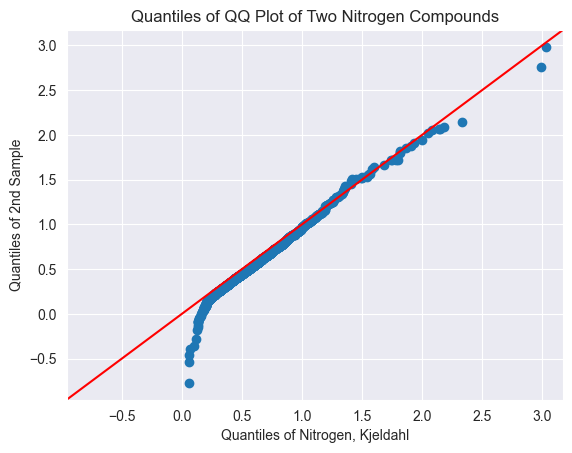

In [903]:
# Create the QQ plot with specified figure size
plt.figure(figsize=(10, 10))  # Set figure size to 10x10 inches

pp_x = sm.ProbPlot(nmerge.ResultValue_K)
pp_y = sm.ProbPlot(nmerge.ResultValue_O)
qq_plot = sm.qqplot_2samples(pp_x, pp_y, line="45")

# Add labels and title
plt.xlabel("Quantiles of Nitrogen, Kjeldahl")
plt.title("Quantiles of QQ Plot of Two Nitrogen Compounds")

# Show the plot
plt.show()

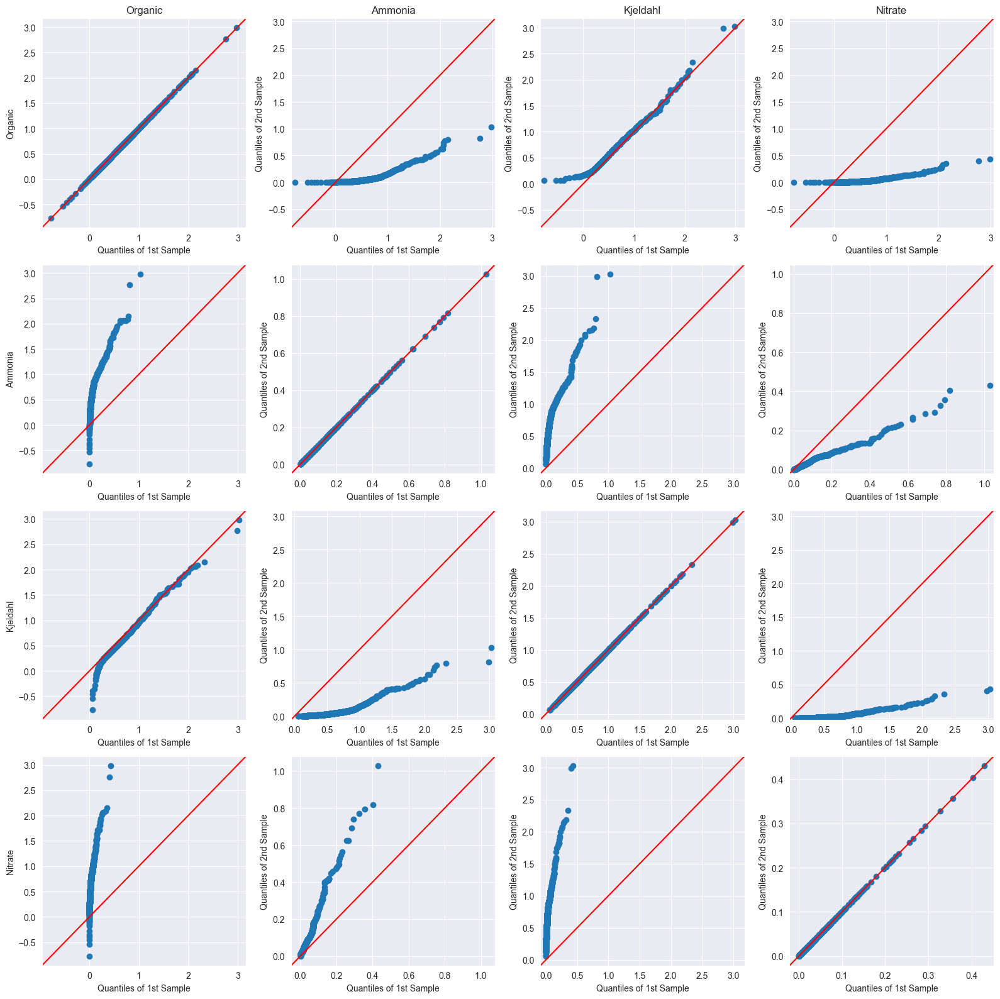

In [904]:
from statsmodels.api import ProbPlot

# Define the data for each compound
data = {
    'Organic': nmerge.ResultValue_O,
    'Ammonia': nmerge.ResultValue_A,
    'Kjeldahl': nmerge.ResultValue_K,
    'Nitrate': nmerge.ResultValue_N
}

# Create the figure and axes
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop through each pair of compounds
for i, compound1 in enumerate(data):
    for j, compound2 in enumerate(data):
        # Create the QQ plot
        pp_x = ProbPlot(data[compound1])
        pp_y = ProbPlot(data[compound2])
        
        # Plot on the correct subplot
        sm.qqplot_2samples(pp_x, pp_y, line="45", ax=axs[i, j])
        
        # Set title
        if i == 0:
            axs[i, j].set_title(compound2)
        if j == 0:
            axs[i, j].set_ylabel(compound1)

# Adjust layout
plt.tight_layout()
plt.show()

*Deviations*: There are some deviations from the line, particularly at the higher quantiles (the right end of the plot). This indicates that the second [Organic] data has a slightly heavier tail than the Kjeldahl data. In simpler terms, it means that Nitrogen, Organic might have more extreme values or outliers on the higher end compared to Kjeldahl.<br>

Middle Quantiles: The points in the middle quantiles align quite well with the line, suggesting that the central parts of the distributions are very similar.

Of particular interest may be the QQ plot between K and O - which differ only by the value of Ammonia.
This could be expected because the difference in scale between ammonia and kjeldahl.

In [905]:
# change directory for exporting of df
os.chdir('J:\\Brainstation\\BS Git\\human Imact\\Nutrient_loading')

In [906]:
ksub.to_csv('kjeldahl_updated_12.12.csv')
nsub.to_csv('nitrate_updated_12.12.csv')
asub.to_csv('ammonia_updated_12.12.csv')
nmerge.to_csv('nit_merged_mean_updated_12.12.csv')

In [907]:
nmerge

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.618667
1990-01-21,0.408333,0.071667,0.006500,0.336667
1990-01-28,0.859167,0.055833,0.038250,0.803333
1990-02-04,1.310000,0.040000,0.070000,1.270000
...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519
2024-06-30,0.139037,0.078000,0.039704,0.061037
2024-07-07,0.141556,0.090000,0.047556,0.051556
2024-07-14,0.134571,0.063000,0.035286,0.071571


In [908]:
nmerge.iloc[:,3]

1990-01-07    0.550000
1990-01-14    0.618667
1990-01-21    0.336667
1990-01-28    0.803333
1990-02-04    1.270000
                ...   
2024-06-23    0.070519
2024-06-30    0.061037
2024-07-07    0.051556
2024-07-14    0.071571
2024-07-21    0.256000
Freq: W-SUN, Name: ResultValue_O, Length: 1803, dtype: float64

In [909]:
nmerge.ResultValue_O.isna().value_counts()

ResultValue_O
False    1803
Name: count, dtype: int64

In [910]:
indexes=nmerge.ResultValue_O[nmerge.ResultValue_O<0].index
nmerge.ResultValue_O[nmerge.ResultValue_O<0]

2010-07-25   -0.010000
2019-10-06   -0.458000
2021-10-03   -0.126231
2021-10-10   -0.284833
2021-12-05   -0.772167
2021-12-12   -0.395875
2021-12-19   -0.089000
2021-12-26   -0.060500
2022-01-02   -0.032000
2022-01-16   -0.057429
2022-01-30   -0.182000
2022-02-06   -0.079429
2022-02-13   -0.019000
2022-02-20   -0.000489
2022-03-13   -0.538667
2022-03-20   -0.089500
2022-04-03   -0.152583
2022-04-10   -0.357333
2022-05-08   -0.090267
2022-06-12   -0.043667
Name: ResultValue_O, dtype: float64

In [911]:
nmerge['ResultValue_O'] = np.where(
    nmerge['ResultValue_K'] - nmerge['ResultValue_A'] < 0,  # Condition
    np.nan,                                                 # Value if True
    nmerge['ResultValue_K'] - nmerge['ResultValue_A'])       # Value if False

In [912]:
nmerge=nmerge.interpolate(method='linear', limit_direction='forward', limit=4)

In [913]:
nmerge[nmerge.ResultValue_O.isna()]

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
2022-01-02,0.251154,0.289643,0.031313,NaN


In [914]:
nmerge=nmerge.interpolate(method='linear', limit_direction='forward', limit=4)

In [915]:
nmerge[nmerge.ResultValue_O.isna()]

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O


In [916]:
from scipy import stats

# I want to see how transformations can affect the way the data is distributed and if it can bgive a bad understanding of what other patterns might be there.
# But all transformations of the data will have a different impact. Log transformation is my default but i'd like to take a look at how they all will compare.


# new df to hold the transformed values
nmerge_transform = nmerge.copy()

# Logarithmic transformation
nmerge_transform['ResultValue_K_log'] = np.log(nmerge['ResultValue_K'])
nmerge_transform['ResultValue_A_log'] = np.log(nmerge['ResultValue_A'])
nmerge_transform['ResultValue_N_log'] = np.log(nmerge['ResultValue_N'])
nmerge_transform['ResultValue_O_log'] = np.log(nmerge['ResultValue_O'])

# Square root transformation
nmerge_transform['ResultValue_K_sqrt'] = np.sqrt(nmerge['ResultValue_K'])
nmerge_transform['ResultValue_A_sqrt'] = np.sqrt(nmerge['ResultValue_A'])
nmerge_transform['ResultValue_N_sqrt'] = np.sqrt(nmerge['ResultValue_N'])
nmerge_transform['ResultValue_O_sqrt'] = np.sqrt(nmerge['ResultValue_O'])

# Box-Cox transformation
nmerge_transform['ResultValue_K_boxcox'], _ = stats.boxcox(nmerge['ResultValue_K'])
nmerge_transform['ResultValue_A_boxcox'], _ = stats.boxcox(nmerge['ResultValue_A'])
nmerge_transform['ResultValue_N_boxcox'], _ = stats.boxcox(nmerge['ResultValue_N'])
nmerge_transform['ResultValue_O_boxcox'], _ = stats.boxcox(nmerge['ResultValue_O'])

print(nmerge_transform)

            ResultValue_K  ResultValue_A  ResultValue_N  ResultValue_O  \
1990-01-07       0.583333       0.033333       0.006500       0.550000   
1990-01-14       0.723684       0.056842       0.022826       0.666842   
1990-01-21       0.408333       0.071667       0.006500       0.336667   
1990-01-28       0.859167       0.055833       0.038250       0.803333   
1990-02-04       1.310000       0.040000       0.070000       1.270000   
...                   ...            ...            ...            ...   
2024-06-23       0.136519       0.066000       0.031852       0.070519   
2024-06-30       0.139037       0.078000       0.039704       0.061037   
2024-07-07       0.141556       0.090000       0.047556       0.051556   
2024-07-14       0.134571       0.063000       0.035286       0.071571   
2024-07-21       0.310000       0.054000       0.024000       0.256000   

            ResultValue_K_log  ResultValue_A_log  ResultValue_N_log  \
1990-01-07          -0.538997          -

In [917]:
nmerge_transform

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O,ResultValue_K_log,ResultValue_A_log,ResultValue_N_log,ResultValue_O_log,ResultValue_K_sqrt,ResultValue_A_sqrt,ResultValue_N_sqrt,ResultValue_O_sqrt,ResultValue_K_boxcox,ResultValue_A_boxcox,ResultValue_N_boxcox,ResultValue_O_boxcox
1990-01-07,0.583333,0.033333,0.006500,0.550000,-0.538997,-3.401197,-5.035953,-0.597837,0.763763,0.182574,0.080623,0.741620,-0.529390,-4.305579,-6.045491,-0.544939
1990-01-14,0.723684,0.056842,0.022826,0.666842,-0.323400,-2.867478,-3.779851,-0.405202,0.850696,0.238416,0.151083,0.816604,-0.319925,-3.494130,-4.331186,-0.380418
1990-01-21,0.408333,0.071667,0.006500,0.336667,-0.895671,-2.635730,-5.035953,-1.088662,0.639010,0.267706,0.080623,0.580230,-0.869352,-3.159408,-6.045491,-0.921684
1990-01-28,0.859167,0.055833,0.038250,0.803333,-0.151792,-2.885384,-3.263612,-0.218986,0.926912,0.236291,0.195576,0.896289,-0.151024,-3.520426,-3.669470,-0.211606
1990-02-04,1.310000,0.040000,0.070000,1.270000,0.270027,-3.218876,-2.659260,0.239017,1.144552,0.200000,0.264575,1.126943,0.272482,-4.021853,-2.924791,0.248241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519,-1.991295,-2.718101,-3.446660,-2.651880,0.369484,0.256905,0.178471,0.265553,-1.864293,-3.277194,-3.901351,-1.797962
2024-06-30,0.139037,0.078000,0.039704,0.061037,-1.973015,-2.551046,-3.226311,-2.796274,0.372877,0.279285,0.199258,0.247057,-1.848284,-3.039660,-3.622584,-1.859208
2024-07-07,0.141556,0.090000,0.047556,0.051556,-1.955063,-2.407946,-3.045857,-2.965095,0.376239,0.300000,0.218072,0.227058,-1.832543,-2.840358,-3.397491,-1.927372
2024-07-14,0.134571,0.063000,0.035286,0.071571,-2.005660,-2.764621,-3.344277,-2.637059,0.366840,0.250998,0.187845,0.267528,-1.876859,-3.344290,-3.771287,-1.791516


In [918]:
nmerge_transform

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O,ResultValue_K_log,ResultValue_A_log,ResultValue_N_log,ResultValue_O_log,ResultValue_K_sqrt,ResultValue_A_sqrt,ResultValue_N_sqrt,ResultValue_O_sqrt,ResultValue_K_boxcox,ResultValue_A_boxcox,ResultValue_N_boxcox,ResultValue_O_boxcox
1990-01-07,0.583333,0.033333,0.006500,0.550000,-0.538997,-3.401197,-5.035953,-0.597837,0.763763,0.182574,0.080623,0.741620,-0.529390,-4.305579,-6.045491,-0.544939
1990-01-14,0.723684,0.056842,0.022826,0.666842,-0.323400,-2.867478,-3.779851,-0.405202,0.850696,0.238416,0.151083,0.816604,-0.319925,-3.494130,-4.331186,-0.380418
1990-01-21,0.408333,0.071667,0.006500,0.336667,-0.895671,-2.635730,-5.035953,-1.088662,0.639010,0.267706,0.080623,0.580230,-0.869352,-3.159408,-6.045491,-0.921684
1990-01-28,0.859167,0.055833,0.038250,0.803333,-0.151792,-2.885384,-3.263612,-0.218986,0.926912,0.236291,0.195576,0.896289,-0.151024,-3.520426,-3.669470,-0.211606
1990-02-04,1.310000,0.040000,0.070000,1.270000,0.270027,-3.218876,-2.659260,0.239017,1.144552,0.200000,0.264575,1.126943,0.272482,-4.021853,-2.924791,0.248241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519,-1.991295,-2.718101,-3.446660,-2.651880,0.369484,0.256905,0.178471,0.265553,-1.864293,-3.277194,-3.901351,-1.797962
2024-06-30,0.139037,0.078000,0.039704,0.061037,-1.973015,-2.551046,-3.226311,-2.796274,0.372877,0.279285,0.199258,0.247057,-1.848284,-3.039660,-3.622584,-1.859208
2024-07-07,0.141556,0.090000,0.047556,0.051556,-1.955063,-2.407946,-3.045857,-2.965095,0.376239,0.300000,0.218072,0.227058,-1.832543,-2.840358,-3.397491,-1.927372
2024-07-14,0.134571,0.063000,0.035286,0.071571,-2.005660,-2.764621,-3.344277,-2.637059,0.366840,0.250998,0.187845,0.267528,-1.876859,-3.344290,-3.771287,-1.791516


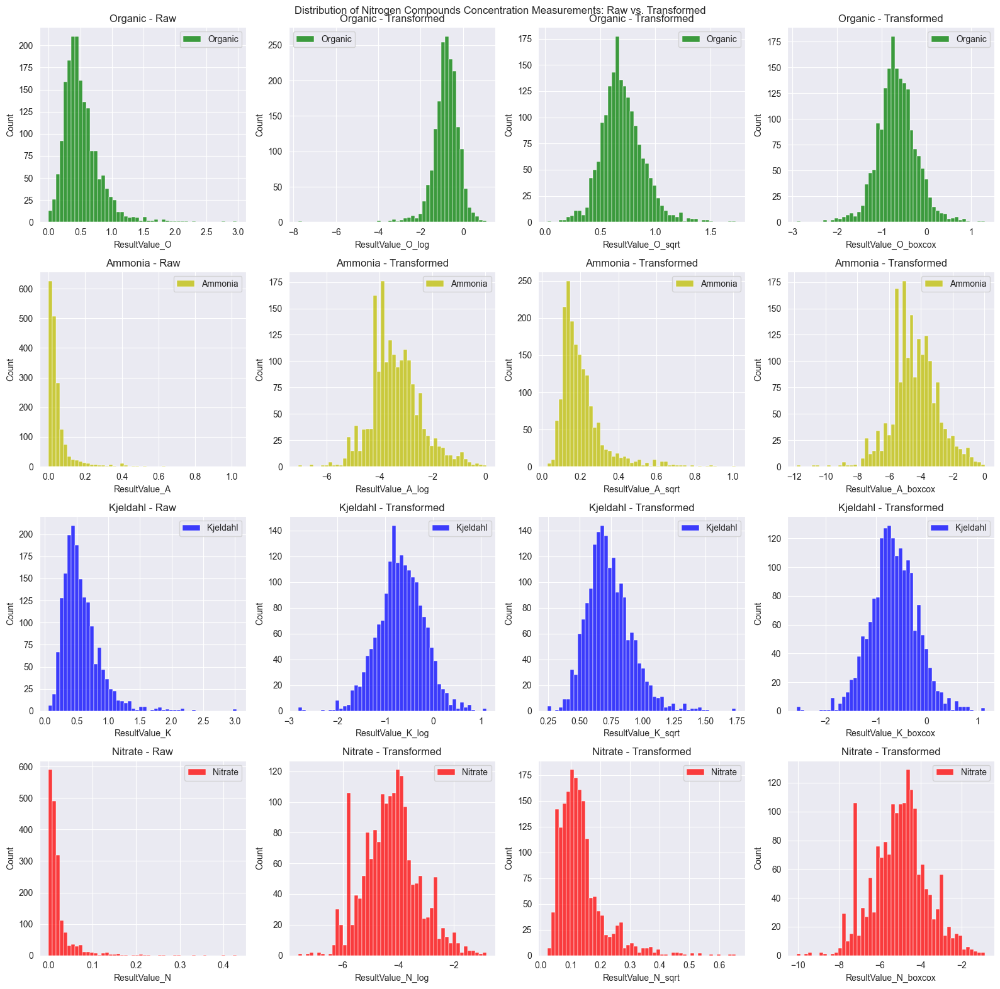

In [919]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(4, 4, figsize=(16, 16))  # 4x2 grid of subplots

# Define data and labels
raw_data = [nmerge.ResultValue_O, nmerge.ResultValue_A, nmerge.ResultValue_K, nmerge.ResultValue_N]
transformed_data_log = [nmerge_transform.ResultValue_O_log, nmerge_transform.ResultValue_A_log, 
                    nmerge_transform.ResultValue_K_log, nmerge_transform.ResultValue_N_log]
transformed_data_boxcox = [nmerge_transform.ResultValue_O_boxcox, nmerge_transform.ResultValue_A_boxcox, 
                    nmerge_transform.ResultValue_K_boxcox, nmerge_transform.ResultValue_N_boxcox]
transformed_data_sqrt = [nmerge_transform.ResultValue_O_sqrt, nmerge_transform.ResultValue_A_sqrt, 
                    nmerge_transform.ResultValue_K_sqrt, nmerge_transform.ResultValue_N_sqrt]

labels = ['Organic', 'Ammonia', 'Kjeldahl', 'Nitrate']
colors = ['g', 'y', 'b', 'r']

# Loop through data and create subplots
for i in range(4):
    # Raw data subplot
    sns.histplot(raw_data[i], color=colors[i], label=labels[i], bins=50, ax=axs[i, 0])
    axs[i, 0].legend()
    axs[i, 0].grid(True)
    axs[i, 0].set_title(f'{labels[i]} - Raw')

    # Transformed data subplot
    sns.histplot(transformed_data_log[i], color=colors[i], label=labels[i], bins=50, ax=axs[i, 1])
    axs[i, 1].legend()
    axs[i, 1].grid(True)
    axs[i, 1].set_title(f'{labels[i]} - Transformed')

    #
    sns.histplot(transformed_data_sqrt[i], color=colors[i], label=labels[i], bins=50, ax=axs[i, 2])
    axs[i, 2].legend()
    axs[i, 2].grid(True)
    axs[i, 2].set_title(f'{labels[i]} - Transformed')

    #
    sns.histplot(transformed_data_boxcox[i], color=colors[i], label=labels[i], bins=50, ax=axs[i, 3])
    axs[i, 3].legend()
    axs[i, 3].grid(True)
    axs[i, 3].set_title(f'{labels[i]} - Transformed')

# Add title and layout
plt.suptitle('Distribution of Nitrogen Compounds Concentration Measurements: Raw vs. Transformed')
plt.tight_layout()
plt.show()

A log transformation seems to handle left skew in the data the best.

In [920]:
nmerge['K_moving_average'] = nmerge.ResultValue_K.rolling(window=36).mean()
nmerge['A_moving_average'] = nmerge.ResultValue_A.rolling(window=36).mean()
nmerge['N_moving_average'] = nmerge.ResultValue_N.rolling(window=36).mean()
nmerge['O_moving_average'] = nmerge.ResultValue_O.rolling(window=36).mean()

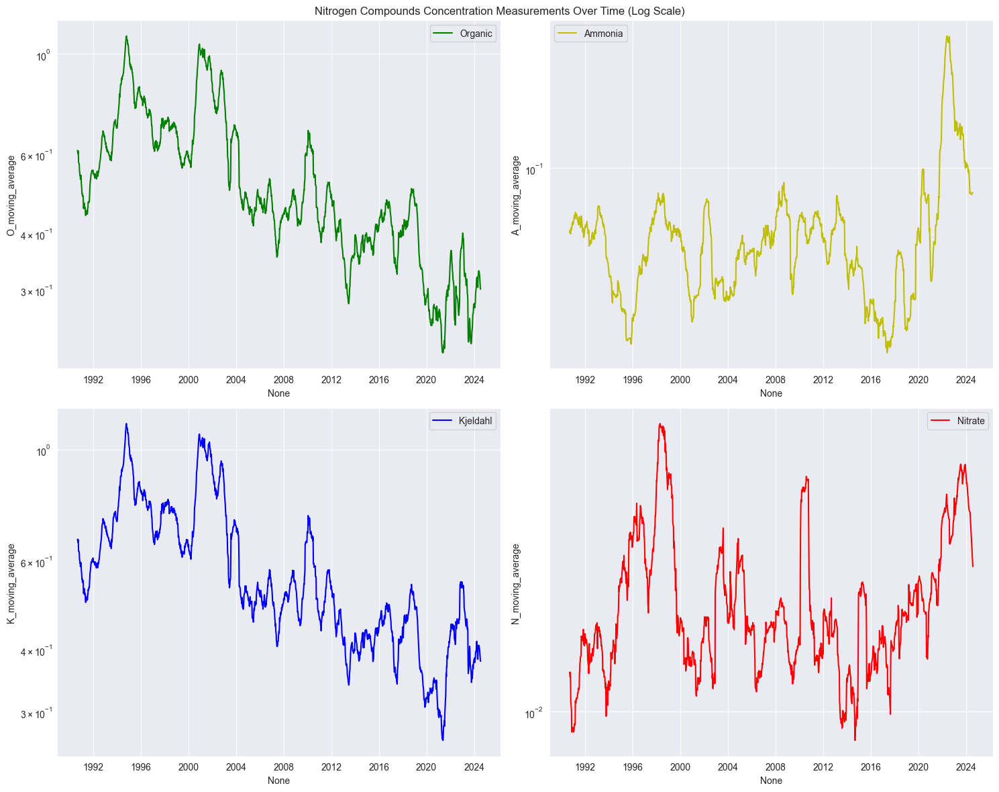

In [921]:
fig, axs = plt.subplots(2, 2, figsize=(15, 12))  # 2x2 grid of subplots

# Define data and labels
data = [nmerge.O_moving_average, nmerge.A_moving_average, nmerge.K_moving_average, nmerge.N_moving_average]

labels = ['Organic', 'Ammonia', 'Kjeldahl', 'Nitrate']
colors = ['g', 'y', 'b', 'r']

# Loop through data and create subplots
for i in range(4):
    row = i // 2  # Calculate row index
    col = i % 2   # Calculate column index
    sns.lineplot(x=nmerge.index, y=data[i], color=colors[i], label=labels[i], ax=axs[row, col])
    axs[row, col].legend()
    axs[row, col].grid(True)  # Add grid to each subplot
    axs[row, col].set(yscale="log")  # Set y-axis to log scale

# Add title and layout
plt.suptitle('Nitrogen Compounds Concentration Measurements Over Time (Log Scale)')
plt.tight_layout()
plt.show()

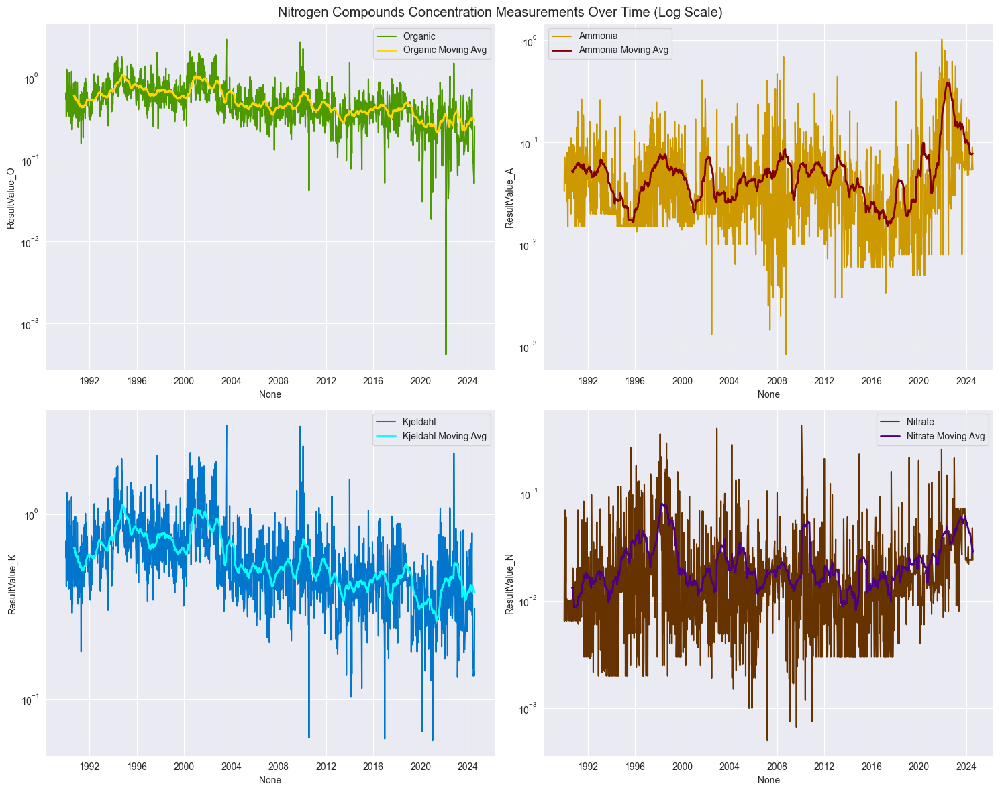

In [922]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(15, 12))  # 2x2 grid of subplots

# Define your color palette with Organic as green and Kjeldahl as blue
colors = ['#4C9900', '#CC9900', '#0077CC', '#663300',  # Raw data colors
          'gold', 'maroon', 'aqua', 'indigo']  # Moving average colors

# Define data and labels (assuming you have 4 data series)
data = [nmerge.ResultValue_O, nmerge.ResultValue_A, nmerge.ResultValue_K, nmerge.ResultValue_N]
moving_averages = [nmerge.O_moving_average, nmerge.A_moving_average, nmerge.K_moving_average, nmerge.N_moving_average]
labels = ['Organic', 'Ammonia', 'Kjeldahl', 'Nitrate']

# Loop through data and create subplots
for i in range(4):
    row = i // 2  # Calculate row index
    col = i % 2   # Calculate column index
    
    # Plot raw data
    sns.lineplot(x=nmerge.index, y=data[i], color=colors[i], label=labels[i], ax=axs[row, col])
    
    # Plot moving average
    sns.lineplot(x=nmerge.index, y=moving_averages[i], color=colors[i+4], label=f'{labels[i]} Moving Avg', ax=axs[row, col],linewidth=2)
    
    axs[row, col].legend()
    axs[row, col].grid(True)  # Add grid to each subplot
    sns.set_style("darkgrid")  # Sets the style to darkgrid, which has a gray background
    axs[row, col].set(yscale="log")  # Set y-axis to log scale

# Add title and layout
plt.suptitle('Nitrogen Compounds Concentration Measurements Over Time (Log Scale)',fontsize='x-large')
plt.tight_layout()
plt.show()

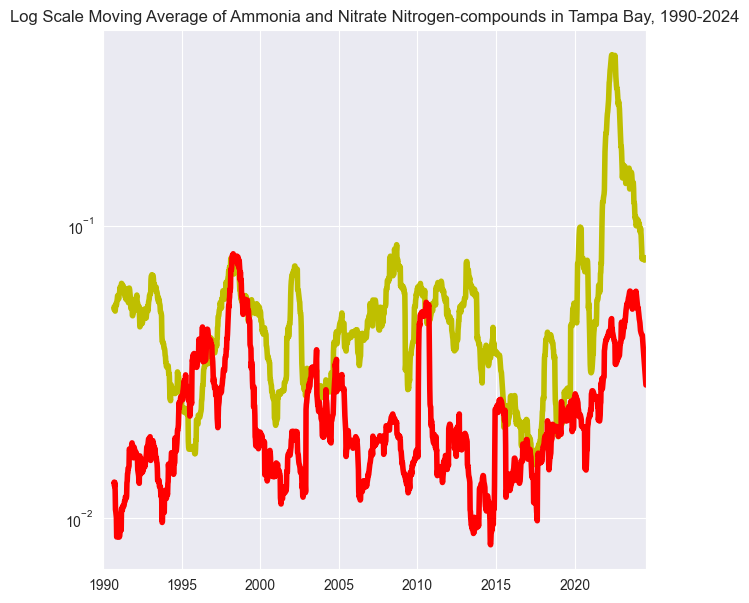

In [923]:
plt.figure(figsize=(7,7))
nmerge.A_moving_average.plot(color='y',lw=4)
nmerge.N_moving_average.plot(color='r',lw=4)
plt.yscale('log')
plt.title('Log Scale Moving Average of Ammonia and Nitrate Nitrogen-compounds in Tampa Bay, 1990-2024')
plt.show()

Kjeldahl is a specific methodology to measureing Nitrogen and is a combination of Organic Nitrogen and Ammonia - you can get organic nitrogen if you subtract ammonia from kjeldahl once you get the values on the same measurement.

Measurements of Ammonia (NH3/NH4+) can be understood as anthropogenic sources of nitrogen
Measurements of Nitrates/Nitrites are anthropogenic sources of nitrogen.

In order to use Ammonia and Nitrates as factors for the API while using Kjeldahl measurements as a feature of the marine ecosystem, it has to be shown that there's correlation between NH3,NO3 ~ Kjel.<br>

This study uses vector autoregression (VAR) to look at these relationships in a time series.

Sampling frequency, measurements have been standardized for frequency and units.<br>
Missing values have been interpolated. 

In [924]:
### nmerge df Checkpoint

##nmerge_backup=nmerge.copy()
#nmerge=nmerge_back.copy()

In [925]:
nmerge.index

DatetimeIndex(['1990-01-07', '1990-01-14', '1990-01-21', '1990-01-28',
               '1990-02-04', '1990-02-11', '1990-02-18', '1990-02-25',
               '1990-03-04', '1990-03-11',
               ...
               '2024-05-19', '2024-05-26', '2024-06-02', '2024-06-09',
               '2024-06-16', '2024-06-23', '2024-06-30', '2024-07-07',
               '2024-07-14', '2024-07-21'],
              dtype='datetime64[ns]', length=1803, freq='W-SUN')

In [926]:
nmergeO=pd.Series(nmerge.ResultValue_O)
nmergeO.index=nmerge.index

In [927]:
nmergeO

1990-01-07    0.550000
1990-01-14    0.666842
1990-01-21    0.336667
1990-01-28    0.803333
1990-02-04    1.270000
                ...   
2024-06-23    0.070519
2024-06-30    0.061037
2024-07-07    0.051556
2024-07-14    0.071571
2024-07-21    0.256000
Freq: W-SUN, Name: ResultValue_O, Length: 1803, dtype: float64

In [928]:
nmerge

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O,K_moving_average,A_moving_average,N_moving_average,O_moving_average
1990-01-07,0.583333,0.033333,0.006500,0.550000,NaN,NaN,NaN,NaN
1990-01-14,0.723684,0.056842,0.022826,0.666842,NaN,NaN,NaN,NaN
1990-01-21,0.408333,0.071667,0.006500,0.336667,NaN,NaN,NaN,NaN
1990-01-28,0.859167,0.055833,0.038250,0.803333,NaN,NaN,NaN,NaN
1990-02-04,1.310000,0.040000,0.070000,1.270000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519,0.398300,0.076453,0.032502,0.321847
2024-06-30,0.139037,0.078000,0.039704,0.061037,0.391989,0.076816,0.031605,0.315172
2024-07-07,0.141556,0.090000,0.047556,0.051556,0.385955,0.077622,0.030926,0.308334
2024-07-14,0.134571,0.063000,0.035286,0.071571,0.379936,0.077785,0.029906,0.302151


In [929]:
nmerge.iloc[:,:-4]

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.666842
1990-01-21,0.408333,0.071667,0.006500,0.336667
1990-01-28,0.859167,0.055833,0.038250,0.803333
1990-02-04,1.310000,0.040000,0.070000,1.270000
...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519
2024-06-30,0.139037,0.078000,0.039704,0.061037
2024-07-07,0.141556,0.090000,0.047556,0.051556
2024-07-14,0.134571,0.063000,0.035286,0.071571


In [930]:
nmerge.iloc[:,-4:].describe()

,K_moving_average,A_moving_average,N_moving_average,O_moving_average
count,1768.000000,1768.000000,1768.000000,1768.000000
mean,0.576596,0.055560,0.024007,0.526357
std,0.185596,0.050156,0.013653,0.194221
min,0.263658,0.015192,0.008124,0.217686
25%,0.438922,0.030956,0.015054,0.391718
50%,0.520672,0.046223,0.019096,0.470338
75%,0.693186,0.059364,0.027733,0.649611
max,1.126163,0.384414,0.080274,1.095747


In [931]:
# Fixing the datetime index

# Create a new DateTimeIndex with the correct weekday alignment
new_index = pd.date_range(start=nmerge.index[0], periods=len(nmerge), freq='W')

# Assign the new index to the DataFrame
nmerge = nmerge.set_index(new_index)

# Verify the change
print(nmerge.index)

DatetimeIndex(['1990-01-07', '1990-01-14', '1990-01-21', '1990-01-28',
               '1990-02-04', '1990-02-11', '1990-02-18', '1990-02-25',
               '1990-03-04', '1990-03-11',
               ...
               '2024-05-19', '2024-05-26', '2024-06-02', '2024-06-09',
               '2024-06-16', '2024-06-23', '2024-06-30', '2024-07-07',
               '2024-07-14', '2024-07-21'],
              dtype='datetime64[ns]', length=1803, freq='W-SUN')


In [932]:
VAR_data=nmerge.iloc[:,0:4]
rolling_avg_data=nmerge.iloc[:,:-4]

In [933]:
scaler1=MinMaxScaler()
scaler2=MinMaxScaler()
scaler1.fit(VAR_data)
VAR_scaled = pd.DataFrame(scaler1.transform(VAR_data), columns=VAR_data.columns, index=VAR_data.index)
scaler2.fit(rolling_avg_data)
rolling_scaled=pd.DataFrame(scaler2.transform(rolling_avg_data), columns=rolling_avg_data.columns, index=rolling_avg_data.index)

In [934]:
VAR_data.head(2)

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.666842


In [935]:
VAR_data.tail(2)

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
2024-07-14,0.134571,0.063,0.035286,0.071571
2024-07-21,0.310000,0.054,0.024000,0.256000


### Modelling

#### Augmented Dickey-Fuller Test for Univariate Stationarity

_**Aug. Dickey-Fuller Test:**_
>Hypothesis-<br>
>**H<sub>0</sub>**: Individual nitrogen-compound features do not exhibit statistically significant stationarity <br>
>**H<sub>1</sub>**: Individual nitrogen-compound features do exhibit stationarity over time

In [936]:
# Data has already been scaled with MinMax

# Splits scaled data
train_data, test_data = train_test_split(VAR_data, test_size=0.3, shuffle=False)

# Scale data
scaler=MinMaxScaler()
scaler.fit(train_data)
train_data_scaled = pd.DataFrame(scaler.transform(train_data), columns=train_data.columns, index=train_data.index)
test_data_scaled = pd.DataFrame(scaler.transform(test_data), columns=test_data.columns, index=test_data.index) 

In [937]:
train_data_scaled

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.175669,0.047131,0.013970,0.172729
1990-01-14,0.222956,0.081223,0.051982,0.212452
1990-01-21,0.116708,0.102722,0.013970,0.100201
1990-01-28,0.268603,0.079760,0.087893,0.258856
1990-02-04,0.420498,0.056799,0.161816,0.417511
...,...,...,...,...
2014-02-09,0.013835,0.035046,0.005821,0.012261
2014-02-16,0.085599,0.019868,0.005821,0.088234
2014-02-23,0.160396,0.294629,0.084983,0.099294
2014-03-02,0.061566,0.040605,0.005821,0.059121


In [938]:
test_data_scaled

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
2014-03-16,0.110307,0.097888,0.022119,0.094875
2014-03-23,0.118999,0.064823,0.006286,0.111398
2014-03-30,0.131084,0.088703,0.005821,0.117993
2014-04-06,0.125974,0.062841,0.005821,0.118900
2014-04-13,0.115248,0.007493,0.005821,0.121053
...,...,...,...,...
2024-06-23,0.025129,0.094504,0.072996,0.009718
2024-06-30,0.025977,0.111906,0.091278,0.006494
2024-07-07,0.026826,0.129308,0.109559,0.003271
2024-07-14,0.024472,0.090153,0.080991,0.010075


In [939]:
ADF_df=pd.DataFrame(columns=['feature','t_t_subset,'])

# Running ADF test
for i in train_data.columns:
    print(f'Unscaled Data:{i}\n{check_stationarity(VAR_data[i])}\n')
        
    print(f'TRAIN Feature:{i}\n{check_stationarity(train_data_scaled[i])}\n')
    print(f'TEST Feature:{i}\n{check_stationarity(test_data_scaled[i])}\n\n################$#################################################')

ADF Statistic: -3.256494
p-value: 0.016939
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Unscaled Data:ResultValue_K
None

ADF Statistic: -3.506638
p-value: 0.007818
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568
TRAIN Feature:ResultValue_K
None

ADF Statistic: -5.909698
p-value: 0.000000
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
TEST Feature:ResultValue_K
None

################$#################################################
ADF Statistic: -4.445837
p-value: 0.000246
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Unscaled Data:ResultValue_A
None

ADF Statistic: -7.480199
p-value: 0.000000
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568
TRAIN Feature:ResultValue_A
None

ADF Statistic: -2.380043
p-value: 0.147448
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
TEST Feature:ResultValue_A
None

################$#################################################
ADF Statistic: -9.602275
p-value: 0.000000
Critical Values:
	1%: -3.434
	5%: -2.86

When run with the original, full unscaled dataset, null hypothesis is rejected
- Scaled Train data demonstrates stationarity for all features.
- Test data instructs to reject the null hypothesis for Ammonia, both a high p-value and small ADF relative to critical values.<br>
ADF statistic < Critical Values(1%)<br><br>

Running VAR next.

#### Vector Auto Regression (VAR)

**Vector Autoregression**
>Hypothesis-<br>
>**H<sub>0</sub>**: Analysis, through coefficient comparison, predictive comparison and other insights, do not show any definitive differentiation of Kjeldahl values from Nitrates and Ammonia  <br>
>**H<sub>1</sub>**: VAR indicates that Kjeldahl values patterns over time vary significantly from that of _both_ ammonia and nitrates.

In [940]:
VAR_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1803 entries, 1990-01-07 to 2024-07-21
Freq: W-SUN
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ResultValue_K  1803 non-null   float64
 1   ResultValue_A  1803 non-null   float64
 2   ResultValue_N  1803 non-null   float64
 3   ResultValue_O  1803 non-null   float64
dtypes: float64(4)
memory usage: 70.4 KB


In [941]:
VAR_data.describe()

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
count,1803.000000,1803.000000,1803.000000,1803.000000
mean,0.575472,0.055654,0.023969,0.525037
std,0.298930,0.084185,0.034992,0.296323
min,0.060000,0.000833,0.000500,0.000417
25%,0.383333,0.018254,0.007171,0.335200
50%,0.511389,0.030000,0.014000,0.462698
75%,0.704722,0.056542,0.024311,0.649962
max,3.030000,1.028308,0.430000,2.983333


In [942]:
VAR_data.corr()

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
ResultValue_K,1.000000,0.067073,0.155898,0.973378
ResultValue_A,0.067073,1.000000,0.207549,-0.103303
ResultValue_N,0.155898,0.207549,1.000000,0.105732
ResultValue_O,0.973378,-0.103303,0.105732,1.000000


In [943]:
# tests were run originally with Kjeldahl which was highly correlated with Organic
# which isn't surprising (again) because the difference is Ammonia values - which are fairly small in comparison <br>
# Kjeldahl will be removed because it's not a feature of interest at this point

In [944]:
VAR_data

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.666842
1990-01-21,0.408333,0.071667,0.006500,0.336667
1990-01-28,0.859167,0.055833,0.038250,0.803333
1990-02-04,1.310000,0.040000,0.070000,1.270000
...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519
2024-06-30,0.139037,0.078000,0.039704,0.061037
2024-07-07,0.141556,0.090000,0.047556,0.051556
2024-07-14,0.134571,0.063000,0.035286,0.071571


In [945]:
# VAR Model
model = VAR(train_data_scaled)
model2 = VAR(VAR_scaled)
# Fit Scaled VAR Lasso
#results = model.fit(method='ols', alpha=0.1, L1_wt=1, lags=12) 
#results = model.fit(maxlags=12, ic='aic', trend='ct', seas=52)  

In [946]:
results4=model.fit(maxlags=4,ic='aic')
results8=model.fit(maxlags=8,ic='aic')
results12=model.fit(maxlags=12,ic='aic')
results16=model.fit(maxlags=16,ic='aic')
results26=model.fit(maxlags=26,ic='aic')
#results_whole4=model2.fit(maxlags=4,ic='aic')
#results_whole12=model2.fit(maxlags=12,ic='aic')
#results_whole26=model2.fit(maxlags=26,ic='aic')

LinAlgError: 4-th leading minor of the array is not positive definite

In [947]:
# Print model 1 (train) summary
# Results for lag=4
print(results4.summary())
print('4############################################')
# Results for lag=8
print(results8.summary())
print('8############################################')
# Results for lag=12
print(results12.summary())
print('12############################################')
# Results for lag=16
print(results16.summary())
print('16###############################s#############')
# Results for lag=26
print(results26.summary())
print('26############################################')

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 13, Dec, 2024
Time:                     06:32:10
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -15.1546
Nobs:                     1258.00    HQIC:                  -15.2540
Log likelihood:           4316.36    FPE:                2.23494e-07
AIC:                     -15.3139    Det(Omega_mle):     2.16706e-07
--------------------------------------------------------------------
Results for equation ResultValue_A
                      coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------
const                    0.066123         0.006922            9.553           0.000
L1.ResultValue_A         0.207014         0.029082            7.118           0.000
L1.ResultValue_N        -0.047290       

ResultValue_A (Ammonia):

- A~A Lag 1 of ResultValue_A is significant and positive, indicating strong autocorrelation.<br>
- A~N Lag 1 of ResultValue_N (Nitrate) is now significant and negative, suggesting a potential negative relationship between Nitrate and Ammonia in the short term.<br>
- A~O Some longer lags of ResultValue_O (Organic) are significant, indicating potential delayed effects of Organic nitrogen on Ammonia.<br>
<br>
ResultValue_N (Nitrate):
- N~N Lag 1 of ResultValue_N is significant and positive, showing autocorrelation.<br>
- N~A Lag 1 of ResultValue_A (Ammonia) is significant and negative, mirroring the relationship seen in the Ammonia equation.<br>
- N~O Lag 7 of ResultValue_O (Organic) has a significant positive coefficient, suggesting a delayed positive effect of Organic nitrogen on Nitrate.<br>
<br>
ResultValue_O (Organic):
- O~O Lag 1 of ResultValue_O is significant and positive, indicating autocorrelation.<br>
- O~A Lag 1 of ResultValue_A (Ammonia) is significant and negative, suggesting a potential negative relationship in the short term.<br>
- O~N There are some significant coefficients for lagged values of Nitrate, indicating potential interactions between these two forms.<br>
<br>
Potential Interpretations
- Nitrogen Cycle Dynamics: The results still suggest complex interactions between the different nitrogen forms.<br>
- Short-term vs. Long-term Effects: The significant coefficients at different lags indicate that the relationships between the variables might vary over time, with some having immediate effects and others having delayed effects.<br>
- Feedback Loops: The negative relationships between Ammonia and Nitrate at lag 1 might suggest some feedback mechanisms or competition for resources.<br>

In [948]:

# Results for lag=4
print(results4.summary())
print('4############################################')
# Results for lag=8
print(results8.summary())
print('8############################################')
# Results for lag=12
print(results12.summary())
print('12############################################')

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 13, Dec, 2024
Time:                     06:32:11
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -15.1546
Nobs:                     1258.00    HQIC:                  -15.2540
Log likelihood:           4316.36    FPE:                2.23494e-07
AIC:                     -15.3139    Det(Omega_mle):     2.16706e-07
--------------------------------------------------------------------
Results for equation ResultValue_A
                      coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------
const                    0.066123         0.006922            9.553           0.000
L1.ResultValue_A         0.207014         0.029082            7.118           0.000
L1.ResultValue_N        -0.047290       

In [949]:
results4.coef_

AttributeError: 'VARResults' object has no attribute 'coef_'

#### Granger Causality Test

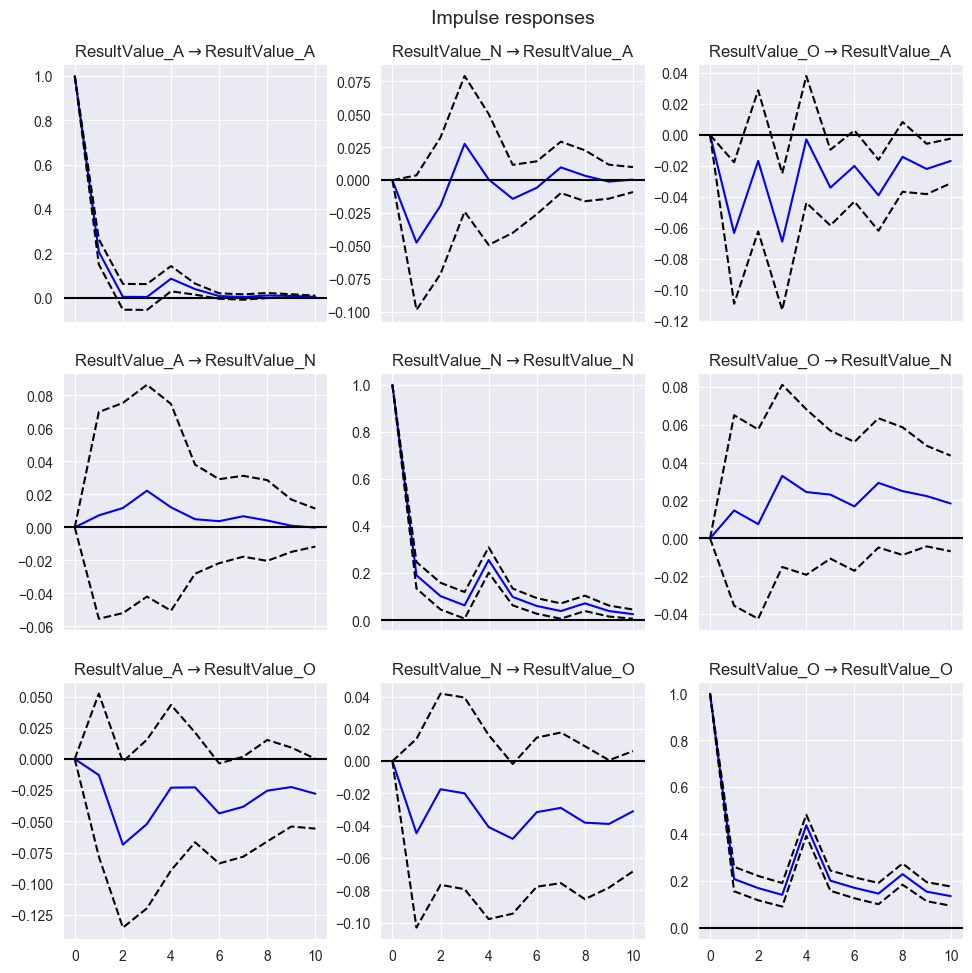

In [950]:
# Generate impulse response functions
irf = results4.irf(10)  # 10 periods ahead

# Plot the responses
irf.plot(orth=False)
plt.show()

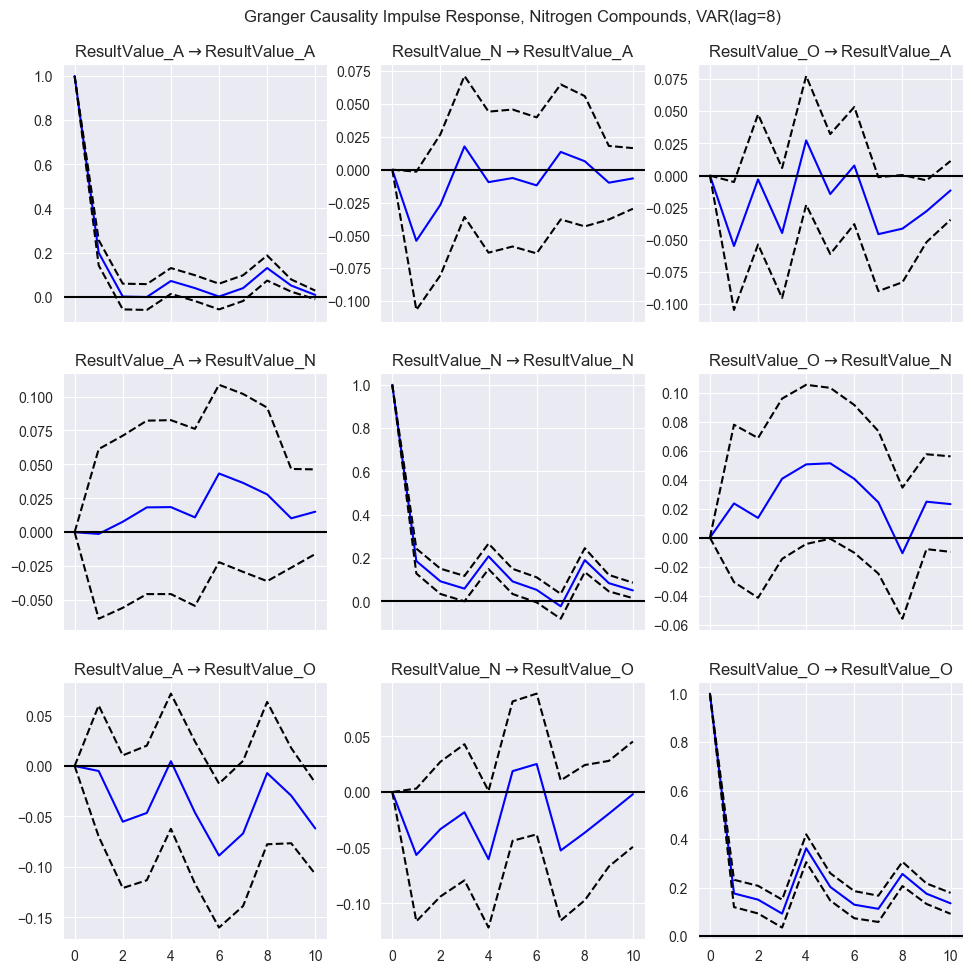

In [951]:
# Generate impulse response functions
irf8 = results8.irf(10)  # 10 periods ahead

# Plot the responses
irf8.plot(orth=False)
plt.suptitle('Granger Causality Impulse Response, Nitrogen Compounds, VAR(lag=8)')
plt.show()

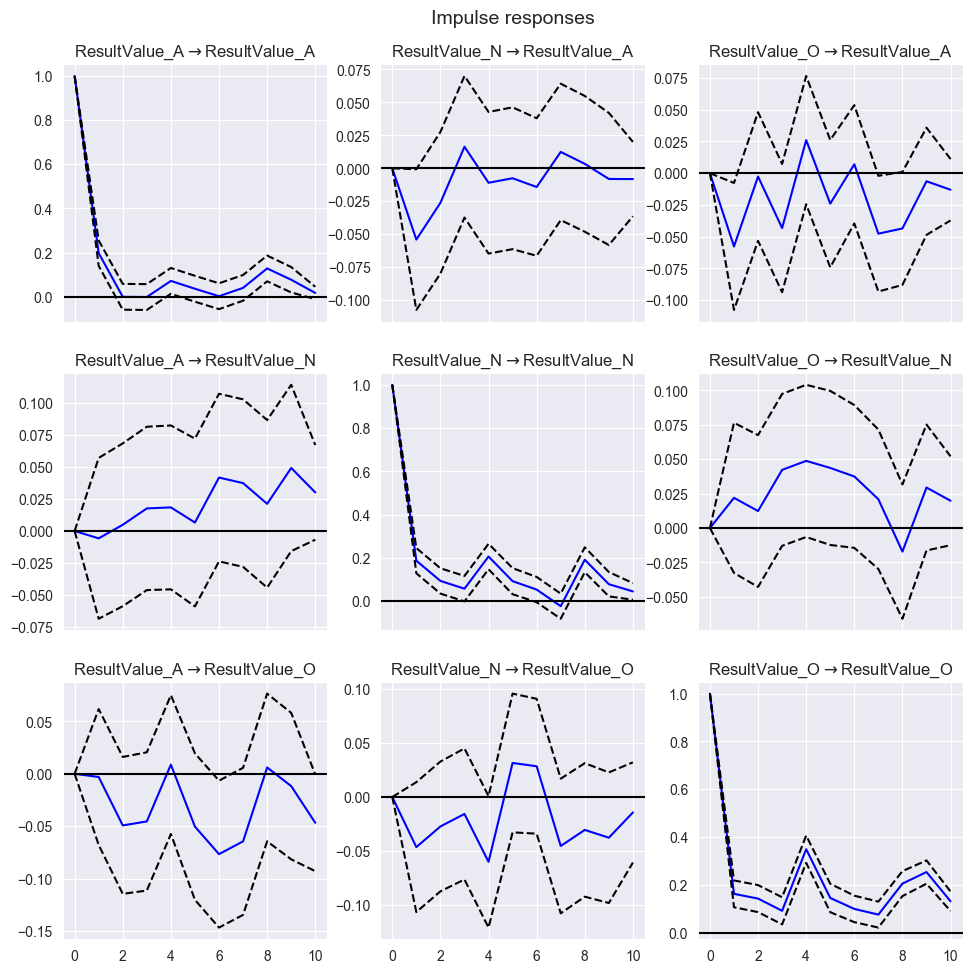

In [952]:
# Generate impulse response functions
irf12 = results12.irf(10)  # 10 periods ahead

# Plot the responses
irf12.plot(orth=False)
plt.show()

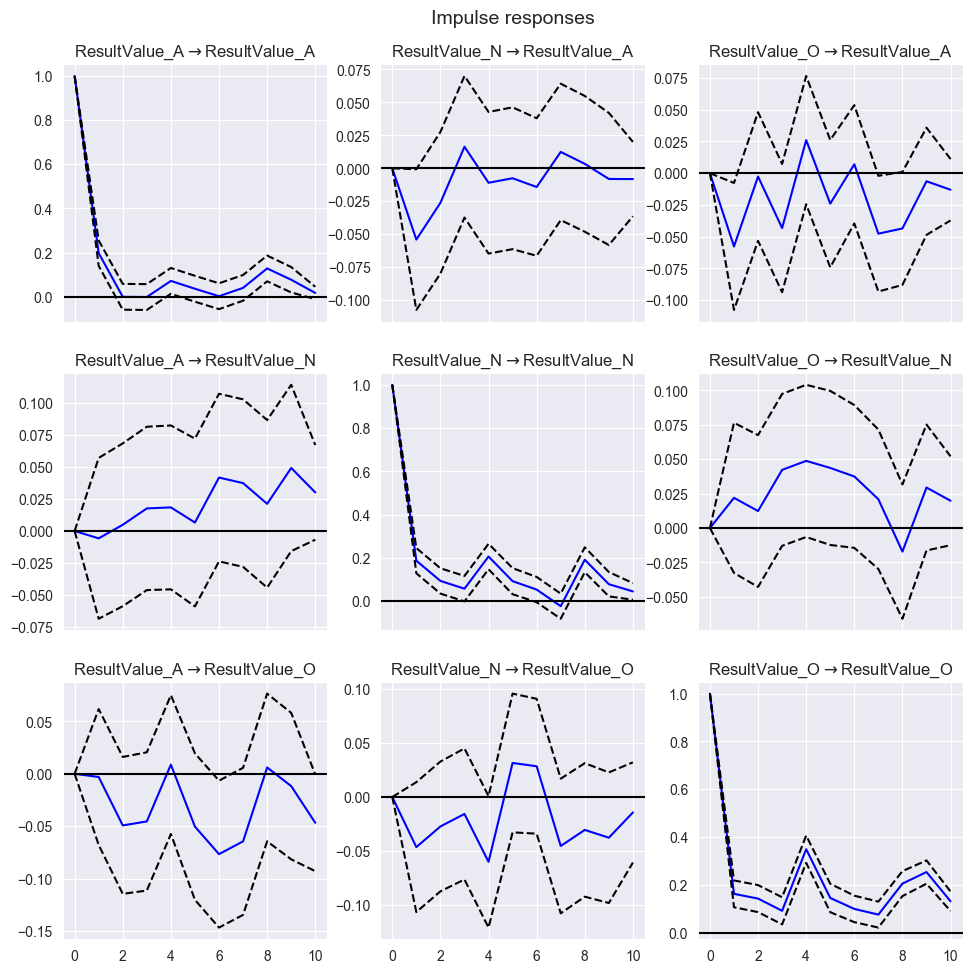

In [953]:
# Generate impulse response functions
irf16 = results16.irf(10)  # 10 periods ahead

# Plot the responses
irf16.plot(orth=False)
plt.show()

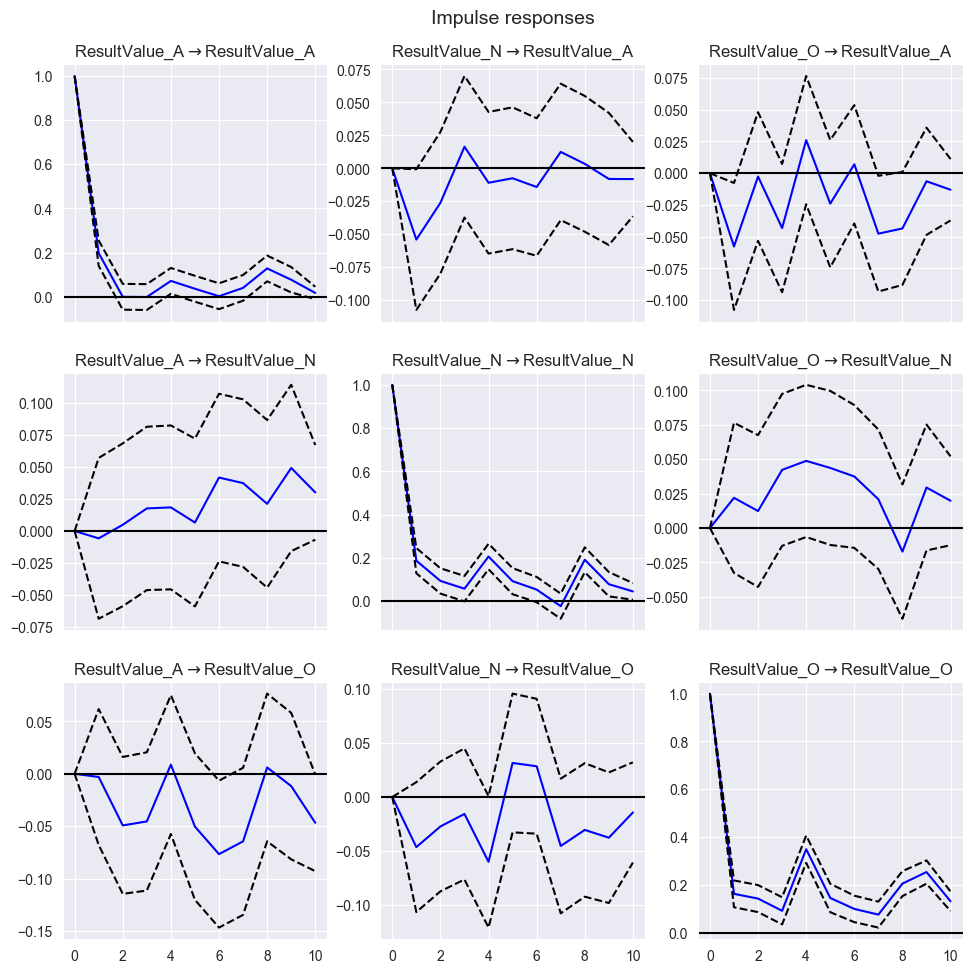

In [954]:
# Generate impulse response functions
irf26 = results26.irf(10)  # 10 periods ahead

# Plot the responses
irf26.plot(orth=False)
plt.show()

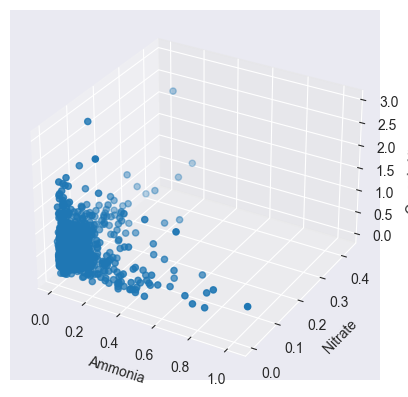

In [955]:
x = nmerge['ResultValue_A']
y = nmerge['ResultValue_N']
z = nmerge['ResultValue_O']

# Create the 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x, y, z)

# Set axis labels
ax.set_xlabel('Ammonia')
ax.set_ylabel('Nitrate')
ax.set_zlabel('Organic Nitrogen')

plt.show()

In [956]:
nmerge.iloc[:,:4]

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.666842
1990-01-21,0.408333,0.071667,0.006500,0.336667
1990-01-28,0.859167,0.055833,0.038250,0.803333
1990-02-04,1.310000,0.040000,0.070000,1.270000
...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519
2024-06-30,0.139037,0.078000,0.039704,0.061037
2024-07-07,0.141556,0.090000,0.047556,0.051556
2024-07-14,0.134571,0.063000,0.035286,0.071571


In [957]:
scaler=MinMaxScaler()
scaler.fit(nmerge.iloc[:,:4])

MinMaxScaler()

In [958]:
nmerge_mmscale = pd.DataFrame(scaler.transform(nmerge.iloc[:,:4]), columns=nmerge.iloc[:,:4].columns, index=nmerge.iloc[:,:4].index)

C:\Users\Ajax\miniconda3\envs\bs\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning:

divide by zero encountered in log



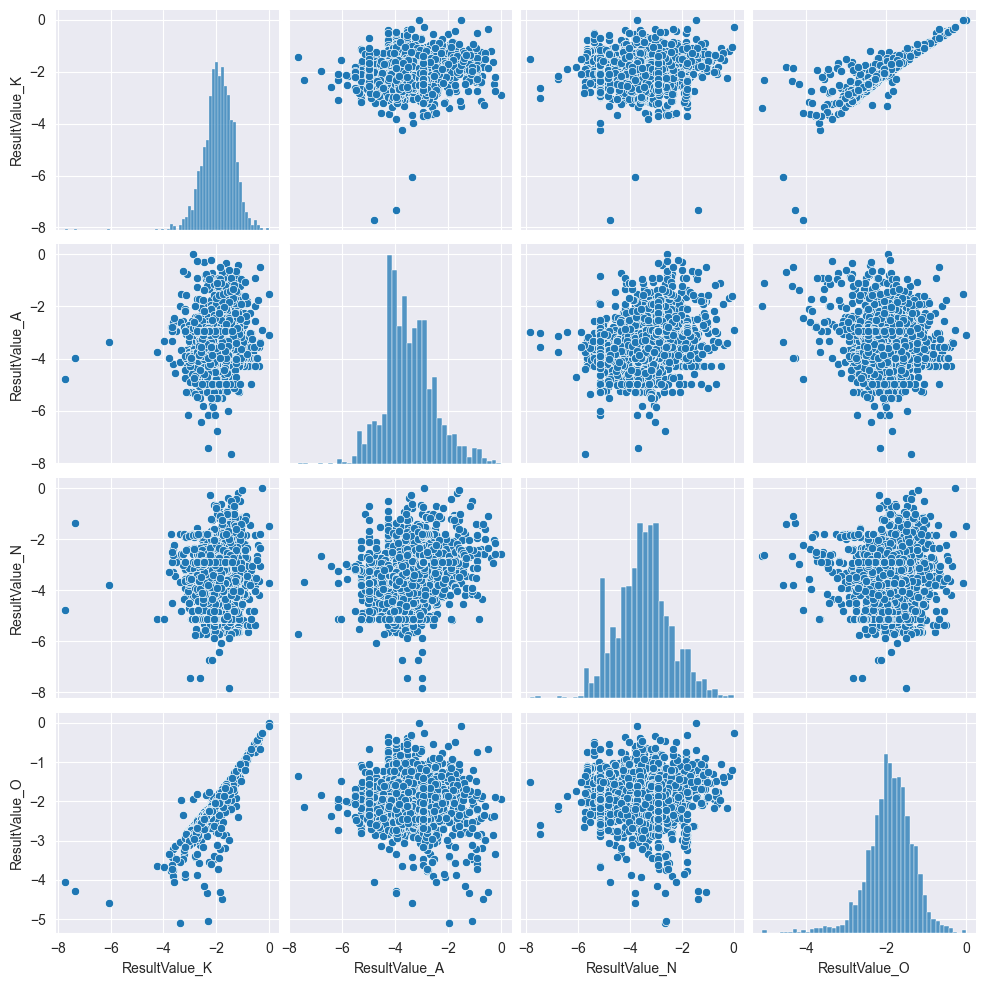

In [959]:
sns.pairplot(np.log(nmerge_mmscale))

C:\Users\Ajax\miniconda3\envs\bs\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning:

divide by zero encountered in log

C:\Users\Ajax\miniconda3\envs\bs\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning:

invalid value encountered in log



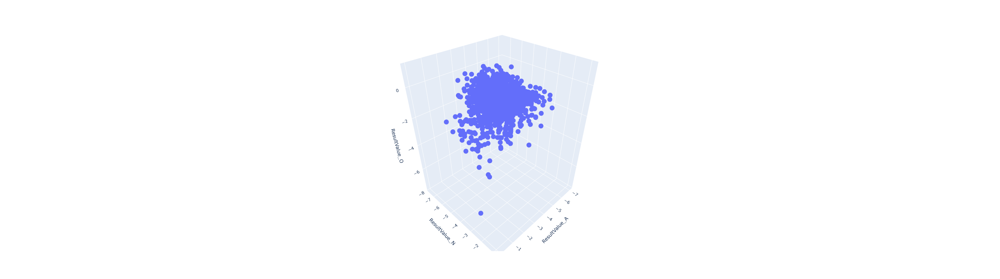

In [960]:
import plotly.express as px

# plotting with orgcaics on the z

# Create the interactive 3D scatter plot with specified height and width
fig = px.scatter_3d(np.log(nmerge_transform), x='ResultValue_A', y='ResultValue_N', z='ResultValue_O',
                    labels={'ResultValue_A_mmscale': 'Ammonia', 'ResultValue_N_mmscale': 'Nitrate', 'ResultValue_O_mmscale': 'Organic Nitrogen'},
                    height=800, width=800)  # Adjust height and width as needed

fig.show()

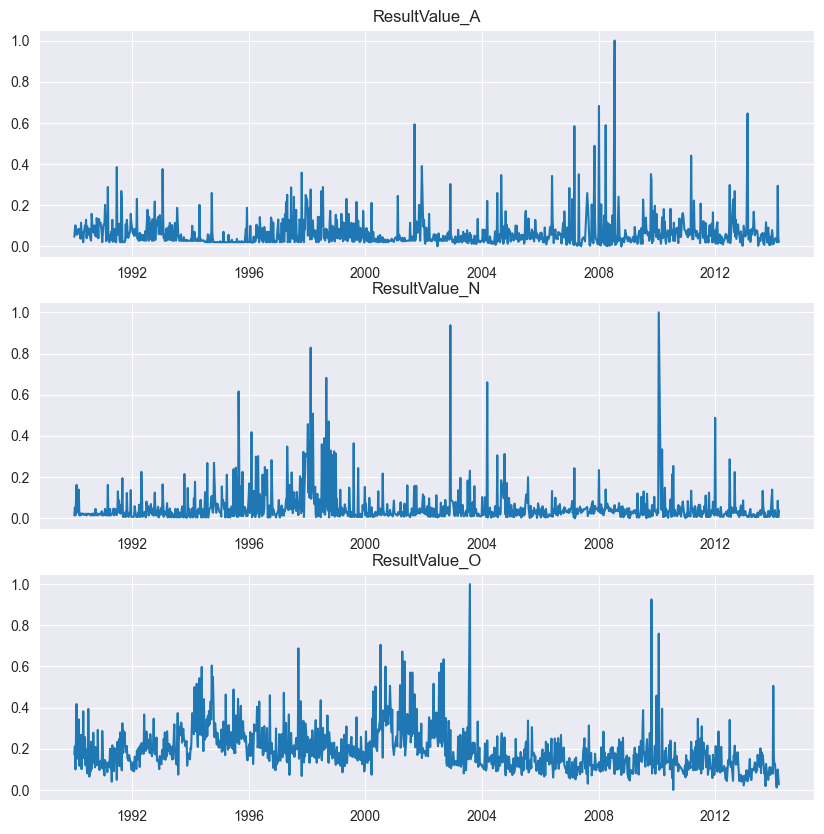

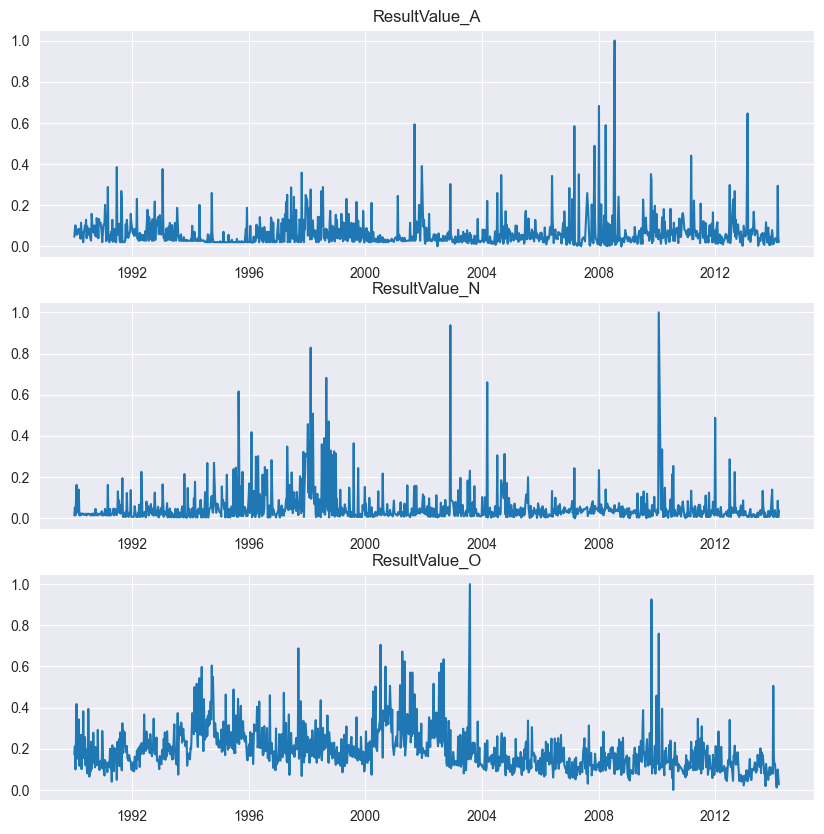

In [961]:
results4.plot()

In [962]:
lags = 4  
last_observations = train_data_scaled.values[-lags:]  
forecast = results4.forecast(y=last_observations, steps=len(test_data))

ValueError: shapes (3,3) and (4,) not aligned: 3 (dim 1) != 4 (dim 0)

In [963]:
# Create a DataFrame with actual and forecasted values
forecast_df = pd.DataFrame({
    'Actual_O': test_data['ResultValue_O'],
    'Forecast_O': forecast[:, 0],  # Assuming Kjeldahl is the first variable
    'Actual_A': test_data['ResultValue_A'],
    'Forecast_A': forecast[:, 1],  # Assuming ammonia is the second variable
    'Actual_N': test_data['ResultValue_N'],
    'Forecast_N': forecast[:, 2]   # Assuming nitrates is the third variable
}, index=test_data.index)

# Calculate error metrics (example with MAE)
from sklearn.metrics import mean_absolute_error
mae_k = mean_absolute_error(forecast_df['Actual_O'], forecast_df['Forecast_O'])


In [964]:
mae_k

0.2834942401813921

In [965]:
forecast_df

,Actual_O,Forecast_O,Actual_A,Forecast_A,Actual_N,Forecast_N
2014-03-16,0.321000,0.069604,0.068333,0.033729,0.010000,0.093656
2014-03-23,0.369600,0.095337,0.045533,0.047608,0.003200,0.110399
2014-03-30,0.389000,0.079670,0.062000,0.030801,0.003000,0.102536
2014-04-06,0.391667,0.070182,0.044167,0.038133,0.003000,0.093473
2014-04-13,0.398000,0.074729,0.006000,0.039534,0.003000,0.116829
...,...,...,...,...,...,...
2024-06-23,0.070519,0.066437,0.066000,0.052307,0.031852,0.188854
2024-06-30,0.061037,0.066437,0.078000,0.052307,0.039704,0.188854
2024-07-07,0.051556,0.066437,0.090000,0.052307,0.047556,0.188854
2024-07-14,0.071571,0.066437,0.063000,0.052307,0.035286,0.188854


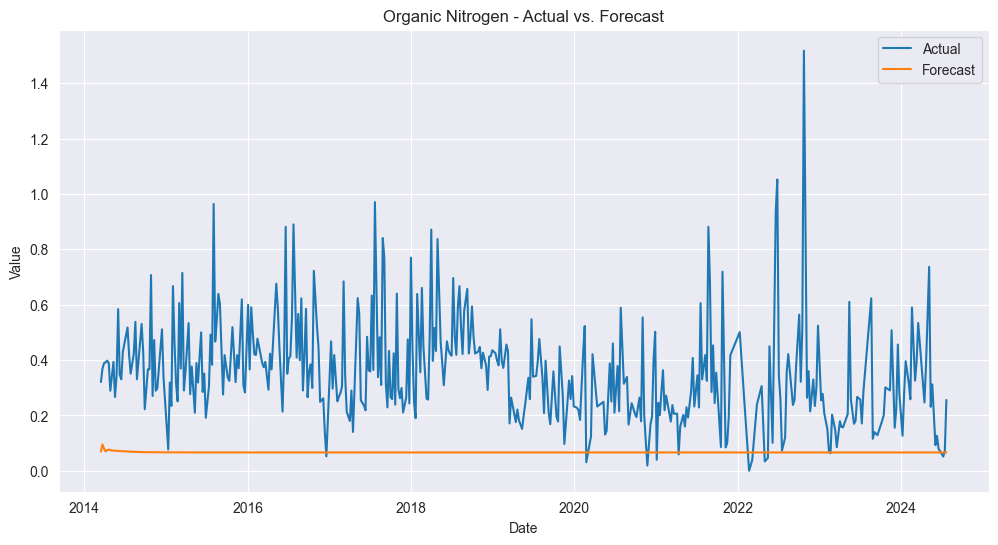

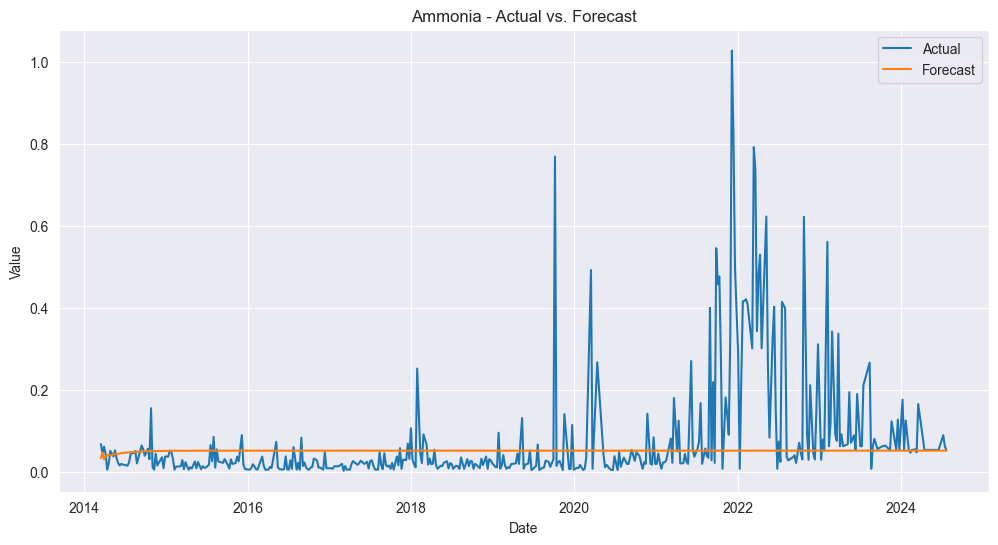

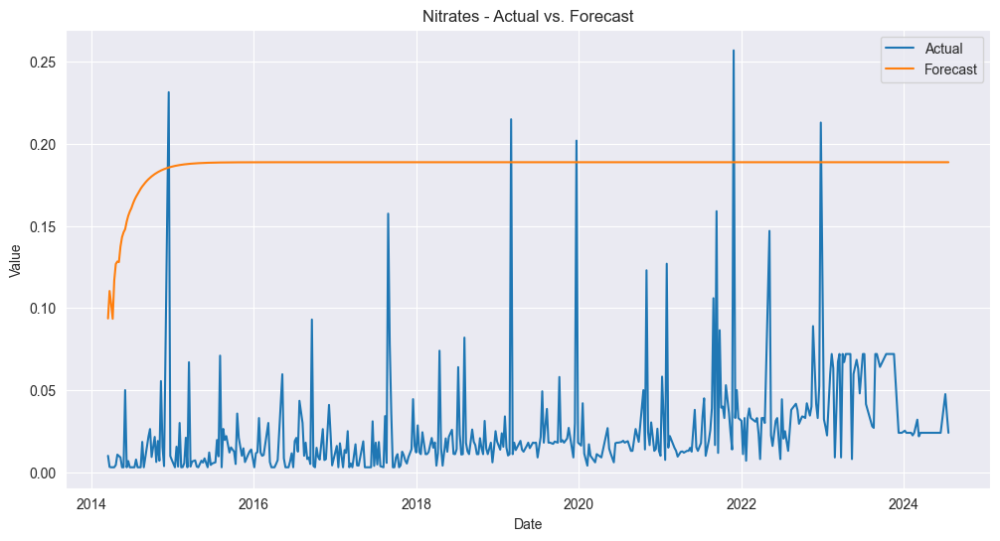

In [966]:
# Plot the actual vs. forecasted values for Kjeldahl
# The model shows barely any sign of seasonality in the first few forecasted periods before reaching a plateau, where it remains for the rest of the time series.

plt.figure(figsize=(12, 6))
plt.plot(forecast_df['Actual_O'], label='Actual')
plt.plot(forecast_df['Forecast_O'], label='Forecast')
plt.title('Organic Nitrogen - Actual vs. Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

# Repeat the plotting for ammonia and nitrates
plt.figure(figsize=(12, 6))
plt.plot(forecast_df['Actual_A'], label='Actual')
plt.plot(forecast_df['Forecast_A'], label='Forecast')
plt.title('Ammonia - Actual vs. Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(forecast_df['Actual_N'], label='Actual')
plt.plot(forecast_df['Forecast_N'], label='Forecast')
plt.title('Nitrates - Actual vs. Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

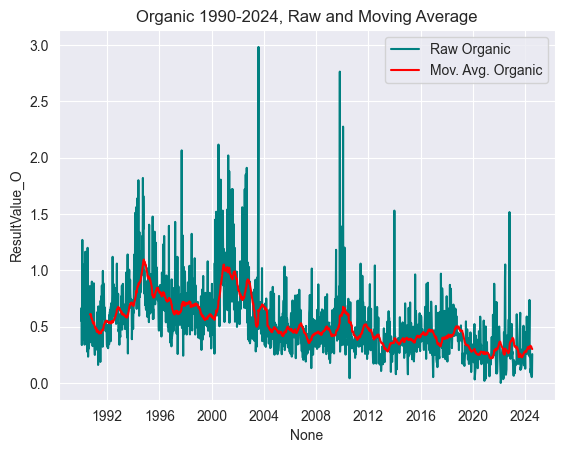

In [967]:
sns.lineplot(x=nmerge.index,y=nmerge.ResultValue_O,label='Raw Organic',color='teal')
sns.lineplot(x=nmerge.index,y=nmerge.O_moving_average,label='Mov. Avg. Organic',color='red')
plt.title('Organic 1990-2024, Raw and Moving Average')
plt.show()

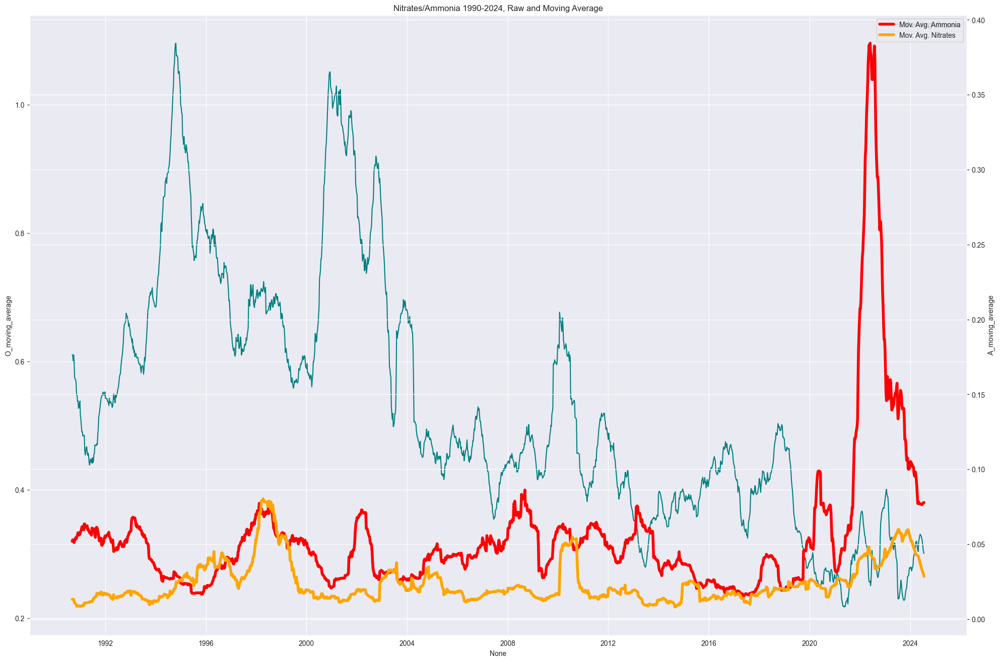

In [968]:
fig,ax = plt.subplots(figsize=(24,16))
#sns.lineplot(x=nmerge.index,y=nmerge.ResultValue_A,label='Raw Ammonia',color='black',lw=1,ax=ax)
ax1=ax.twinx()
#sns.lineplot(x=nmerge.index,y=nmerge.ResultValue_N,label='Raw Nitrates',color='orange',lw=1,ax=ax1)
sns.lineplot(x=nmerge.index,y=nmerge.O_moving_average,label='Mov. Avg. Organic',color='teal',ax=ax)
sns.lineplot(x=nmerge.index,y=nmerge.A_moving_average,label='Mov. Avg. Ammonia',color='red',lw=4,ax=ax1)
sns.lineplot(x=nmerge.index,y=nmerge.N_moving_average,label='Mov. Avg. Nitrates',color='orange',lw=4,ax=ax1)


plt.title('Nitrates/Ammonia 1990-2024, Raw and Moving Average')
plt.show()

In [973]:
VAR_data

,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O
1990-01-07,0.583333,0.033333,0.006500,0.550000
1990-01-14,0.723684,0.056842,0.022826,0.666842
1990-01-21,0.408333,0.071667,0.006500,0.336667
1990-01-28,0.859167,0.055833,0.038250,0.803333
1990-02-04,1.310000,0.040000,0.070000,1.270000
...,...,...,...,...
2024-06-23,0.136519,0.066000,0.031852,0.070519
2024-06-30,0.139037,0.078000,0.039704,0.061037
2024-07-07,0.141556,0.090000,0.047556,0.051556
2024-07-14,0.134571,0.063000,0.035286,0.071571


In [969]:
pwd

'J:\\Brainstation\\BS Git\\human Imact\\Nutrient_loading'

In [972]:
VAR_data.to_csv('Nitrates_VAR_organics.csv')

__** This test was ultimately disregarded. Exported CSVs were imported into the notebook 'FINAL_A.P.Index' which will combine these results with other featuers for the production of the index.

### Nitrogen Loading Conclusions

Due to issues with formatting the datetime index, I haven't been able to get the frequency to set properly and, consequently, forecasting likely will be unhelpful. Results and conclusions drawn from the model should be understood with this in mind as it's difficult to assess the accuracy and performance of the model, particularly as a forecasting model. There are inferences that can be drawn about the relationships captured by the model between the 3 features.

The model had the most difficulty handling Nitrate values. P-values were less than 0.05 only in 4 lag iterations of the model - spiking beyond 0.45 in the next tier of 8 lags. The results do show, however, in the 4 and subsequent 8 lag iterations, nitrates has strong autocorrelation at the 4 week intervals (L1,L4,L8) which may provide insight into its sources. The 4 week lag period could be related to the transport time of nitrates through the watershed, which begins far inland before draining into the river systems and ultimately the bay. Monthly cyclicality of anthrogenic comunity services - such as agricultral practices, sewage treatment, would correlate  

There is some noted influence of ammonia on Kjeldahl values at lag 1 and lag 4, which could be explained by the conversion of organic nitrates into ammonia in the mineralisation process. The Kjelahl method also is measured as ammonia measured while processing water samples with a catalyst agent. Indirect influences of biological processes and existing levels of ammonia could explain this relationship; however, this is only one observation and not the primary driver of Kjeldahl concentrations or vice-versa.

Kjeldahl is more complex with of autocorrelation at lag 1,2,8,9, influences on ammonia at lag 1,2,4 and nitrogen  while also impacting ammonia at week 1,2,4, and nitro at possible 1 and 2; however, this does lend confidence to its use as a proxy as the organic form of nitrogen in the ecosystem. Decay and decomposition would impact ammonia and nitrate concentrations.

Low values of AIC and BIC are encouraging that the model performed reasonably well in explaining the existing data; however, no conclusions can be made about the model's predictive power without being rerun with corrected datasets and evaluation of its performance through error metrics.

I am confident though in proceeding with the base assumptions necessary to proceed its application in the development of the API (index).


## Development

This section introduces development data of Tampa Bay, stretching from 1990-2024.

Initially, this study proposed looking at waterfront properties; the full property record dataset was used for 2 reasons. 1- Quantity of Data. Annual figures for construction would have been too low. More importantly, because of the size of the watershed (extending beyond county lines),  fertilizers, sewage treatment and other anth.gen. substances can be traced far inland. These compounds have been shown to be the most damaging to the Tampa Bay ecosystem. Input from increased activity, development and subsequent contamination of the water that feeds the bay should be evaluated by development at greater resolution. These have an equal weighted influence on anthropogenic pressures on the local marine ecosystem.

During the EDA phase, it became clear through the analysis of nutrient data that consideration of specific construction data had to be expanded further inland that initially expect.
The depth of the watersheds of Tampa Bay, its reach inland and the requirement to extend the reach of the study of nutrient loading into the bay also necessitated expansion of construction and regional population growth.

Consequently, a larger data set was used to estimate the impact of development pressures.

Property records, sales, changes in land use and construction data were aggregated.
For the purposes of the initial phase of this study, annual construction was used as the proxy for coastal development.
The priamry feature of interest was total construction, additional important information has been aggregated for further analysis after the implementation of the API.
These sum of features include:
- Property Acreage
- Year Built
- Number of structures built
- Land type
- Total square footage of structure

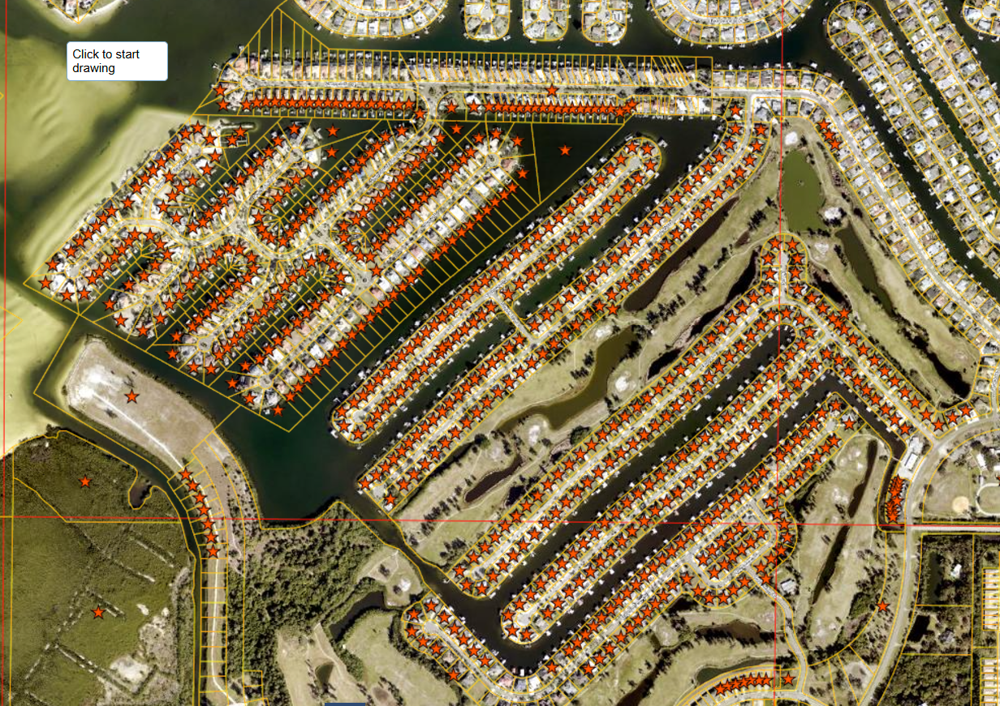

In [ ]:
# Introduce base table with property records.
# Data read in at start of notebook
# 'proprx' 'Property Recorsd'

In [640]:
proprx

,FOLIO,TYPE,Edit_dt,PIN,DOR_C,OWNER,ADDR_1,ADDR_2,CITY,STATE,ZIP,COUNTRY,SUB,SITE_ADDR,SITE_CITY,SITE_ZIP,LEGAL1,LEGAL2,LEGAL3,LEGAL4,DBA,STRAP,tBEDS,tBATHS,tSTORIES,tUNITS,tBLDGS,TAXDIST,JUST,LAND,BLDG,EXF,ACT,EFF,HEAT_AR,ASD_VAL,TAX_VAL,MUNI,SD1,SD2,TIF,BASE,S_DATE,VI,S_AMT,ACREAGE,NBHC
0,1.000000e+04,NaN,4/8/2019,A-23-33-15-ZZZ-000000-00020.0,8800,UNITED STATES,EGMONT KEY STATE PARK,4905 34TH ST S PMB 5000,SAINT PETERSBURG,FL,33711-4511,NaN,ZZZ,0 EGMONT KEY,ST PETERSBURG,33715,23 24 25 AND 26-33-15,THAT ISLAND KNOWN AS EGMONT KEY DESC AS GOVT LOTS,1 2 & 3 IN SEC 23-33-15 GOVT LOT 1 IN SEC 24-3...,GOV LOT 1 IN SEC 25-33-15 & GOV LOTS 1 & 2 IN SEC,EGMONT KEY ISLAND,153323ZZZ000000000200A,0.0,0.0,0.0,0.0,0.0,TA,7447118.0,7341138.0,0.0,105980.0,0,0,0.0,6165623.0,0.0,A,NaN,NaN,NaN,0,NaN,NaN,0.0,313.011000,227002.0
1,5.000000e+04,NaN,4/8/2019,A-23-33-15-ZZZ-000000-00040.0,8600,HILLSBOROUGH COUNTY,REAL ESTATE DEPT,PO BOX 1110,TAMPA,FL,33601-1110,NaN,ZZZ,0,ST PETERSBURG,33715,THAT PART OF GOVT LOT 1 DESC AS LYING S 2 DEG 34,MIN 04 SEC W 5226 FT FROM CENTER OF EGMONT,LIGHTHOUSE SAID CENTER BEING LAT 27 DEG 36 MIN,01.980 SEC LONG 82 DEG 45 MIN 39.003 SEC AND RUN,EGMONT KEY,153323ZZZ000000000400A,0.0,0.0,0.0,0.0,0.0,TA,322675.0,230175.0,0.0,92500.0,0,0,0.0,280899.0,0.0,A,NaN,NaN,NaN,0,NaN,NaN,0.0,6.147920,227002.0
2,8.000000e+04,NaN,4/9/2019,U-01-27-17-001-000000-00001.0,0000,PAULINE L SEVIGNY/ LIFE ESTATE,19931 ANGEL LN,NaN,ODESSA,FL,33556-3919,NaN,001,19931 ANGEL LN,ODESSA,33556,KEYSTONE PARK COLONY,A PORTION OF TRACT 1 IN NE 1/4 OF SEC 1 DESC AS:,COM AT NW COR OF TRACT 1 S 89 DEG 16 MIN 05 SEC E,603.85 FT TO NE COR S 01 DEG 47 MIN 49 SEC E,NaN,172701001000000000010U,0.0,0.0,0.0,0.0,0.0,U,256872.0,210327.0,0.0,46545.0,0,0,0.0,240014.0,240014.0,U,NaN,NaN,NaN,0,NaN,NaN,0.0,4.713410,211007.0
3,8.010000e+04,NaN,4/9/2019,U-01-27-17-001-000000-00001.1,0100,JEFFERY AND PATRICIA SEVIGNY,19859 ANGEL LN,NaN,ODESSA,FL,33556-3917,NaN,001,19859 ANGEL LN,ODESSA,33556,KEYSTONE PARK COLONY,TRACT 1 IN NE 1/4 LESS N 200 FT THEREOF LESS THE,COM AT NW COR OF TRACT 1 S 01 DEG 36 MIN 23 SEC E,339.93 FT FOR POB N 88 DEG 51 MIN 52 SEC E 604.43,NaN,172701001000000000011U,3.0,2.0,2.0,1.0,1.0,U,634852.0,217757.0,410323.0,6772.0,1996,2010,2617.0,457046.0,407046.0,U,NaN,NaN,NaN,2016,8/1/1987,I,50000.0,5.058780,211007.0
4,9.000000e+04,NaN,4/9/2019,U-01-27-17-001-000000-00002.0,0100,MARIETTA SHIVER LIFE ESTATE,19901 ANGEL LN,NaN,ODESSA,FL,33556-3919,NaN,001,19901 ANGEL LN,ODESSA,33556,KEYSTONE PARK COLONY,S 210 OF W 225 FT OF TRACT 2 IN NE 1/4 LESS W 15,FT FOR R/W,NaN,NaN,172701001000000000020U,2.0,1.0,1.0,1.0,1.0,U,248877.0,94435.0,141733.0,12709.0,1973,1998,1619.0,136288.0,0.0,U,NaN,NaN,NaN,1994,NaN,NaN,0.0,1.000590,211007.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
526434,2.900000e+09,NaN,10/17/2022,U-32-27-19-1D6-000000-00000.2,8600,HILLSBOROUGH COUNTY,REAL ESTATE DEPT,PO BOX 1110,TAMPA,FL,33601-1110,NaN,1D6,0,NaN,NaN,SILVER FORREST,TRACT MARKED DRAINAGE R/W'S ABUTTING LOT 22,BLOCK 2,NaN,NaN,1927321D6000000000002U,0.0,0.0,0.0,0.0,0.0,U,100.0,100.0,0.0,0.0,0,0,0.0,100.0,0.0,U,NaN,NaN,NaN,0,NaN,NaN,0.0,1.279250,215003.0
526435,2.900000e+09,NaN,6/4/2024,U-29-27-22-ZZZ-000004-57310.1,29,PUBLIC LANDS,UNKNOWN,NaN,NaN,NaN,NaN,NaN,ZZZ,0,NaN,NaN,W 25 FT OF S 586.59 FT OF W 1/4 OF SW 1/4 OF,SW 1/4 LESS W 25 FT OF N 132.4 FT OF S 397.2 FT,NaN,NaN,NaN,222729ZZZ000004573101U,0.0,0.0,0.0,0.0,0.0,U,100.0,100.0,0.0,0.0,0,0,0.0,100.0,0.0,U,NaN,NaN,NaN,0,NaN,NaN,0.0,0.326255,219003.0
526436,2.900000e+09,NaN,4/18/2024,P-21-28-22-ZZZ-000006-01510.1,29,PUBLIC LANDS,UNKNOWN,NaN,NaN,NaN,NaN,NaN,ZZZ,0,NaN,NaN,THAT PORTION OF PLANT CITY EAST CANAL ROW,DESC AS BEG AT NE CORNER OF SW 1/4 OF SW 1/4,THN S 01 DEG 36 MIN E 216.21 FT THN S 00 DEG,24 MIN E 293.40 FT THN S 89 DEG 45 MIN 40 SEC W,NaN,222821ZZZ000006015101P,0.0,0.0,0.0,0.0,0.0,PC,

### EDA: Code for subset of data during EDA (outdated)

In [641]:
AB_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 45 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Strap                    1000 non-null   object 
 1   Folio                    1000 non-null   int64  
 2   PIN                      1000 non-null   object 
 3   PropertyType             912 non-null    object 
 4   Owner1                   1000 non-null   object 
 5   Owner2                   515 non-null    object 
 6   MailingAddress1          1000 non-null   object 
 7   MailingAddress2          33 non-null     object 
 8   MailingCity              999 non-null    object 
 9   MailingState             1000 non-null   object 
 10  MailingZip               994 non-null    object 
 11  MailingCountry           6 non-null      object 
 12  SiteAddress              971 non-null    object 
 13  SiteCity                 997 non-null    object 
 14  SiteZip                  

In [642]:
dflist=[
AB_1,
AB_2,
AB_3,
AB_4,
AB_5,
AB_6,
AB_7,
GIB_8,
RIV_1]

In [643]:
dfprop=pd.DataFrame(data=AB_2)

In [644]:
# Combine all sections of property data
# dfprop = 'Dataframe: Property'
for x in dflist:
    print(x.shape)
    dfprop=pd.concat([dfprop,x],axis=0)

(500, 39)
(1000, 45)
(1000, 45)
(121, 45)
(1000, 45)
(660, 45)
(505, 45)
(1000, 45)
(1000, 45)


In [645]:
dfprop1=dfprop.copy()

In [646]:
dfprop.head(5)

,Strap,Folio,PIN,PropertyType,Owner1,Owner2,MailingAddress1,MailingAddress2,MailingCity,MailingState,MailingZip,MailingCountry,SiteAddress,SiteCity,SiteZip,Acreage,Homestead,Legal1,Legal2,Legal3,Legal4,Subdivision,Neighborhood,TaxDistrict,Municipality,TotalNumBuildings,TotalUnits,TotalStories,TotalBedrooms,TotalBathrooms,YearBuilt,TotalLandValue,TotalLandValue1,TotalBuildingValue,TotalExtraFeaturesValue,TotalHeatedAreaSqFt,TotalGrossAreaSqFt,JustValue,AssessedValue,TaxableValue,LastSaleDate,LastSalePrice,VacantImproved,Qualified,Unnamed: 44,Owner,HomesteadFlag,UseCode,UseDescription,TotAcres,PropAddress,PropCity,PropZip,MailAddress,MailCity,MailState,MailZip,LandVal,TotalExemptions,AppVal,AssVal,Zoning,TownShip,Section,Range,SubDivision,Block,Lot,AltKey,BldgQual,NumBath,NumBed,NumBldgs,BldgCost,SqrFoot,HtdSqrFoot,CensusTract,Lat,Lng
0,1931151SF000000009000U,5.155500e+08,U-15-31-19-1SF-000000-00900.0,NaN,TAMPA ELECTRIC COMPANY,NaN,PO BOX 111,NaN,TAMPA,FL,33601-0111,NaN,1,APOLLO BEACH,33572.0,41.89,No,RUSKIN TOMATO FARMS LOT 15 LESS E 360.27 FT AN...,1/2 OF CLOSED R/W FOR NOONAN RD ABUTTING THERE...,1/2 OF LOT 14 LESS W 524.90 FT THEREOF AND TH...,1/2 OF CLOSED R/W FOR NOONAN RD ABUTTING THEREON,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,0.0,0.0,0.0,0.0,0.0,0,1506200.0,1506200.0,0.0,0.0,0.0,0.0,1506200.0,1458728.0,1458728.0,2016-10-25,6720000.0,Vacant,Unqualified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,193116ZZZ000001745900U,5.166100e+08,U-16-31-19-ZZZ-000001-74590.0,MANUFACTURED HOME (AYB > 1976),TAMPA ELECTRIC CO,NaN,THE FLORIDA AQUARIUM ATTN THOM STORK,701 CHANNELSIDE DR,TAMPA,FL,33602-5600,NaN,6650 DICKMAN RD,APOLLO BEACH,33572.0,19.51,No,COM AT SE COR OF SEC 16 N 89 DEG 24 MIN 10 SEC...,0 FT N 00 DEG 32 MIN 38 SEC E 30 FT FOR POB N ...,EG 24 MIN 10 SEC W 1235.13 FT N 00 DEG 45 MIN ...,SEC E 702.42 FT N 88 DEG 48 MIN 46 SEC E 140.7...,UNPLATTED,Apollo Beach Area # 2,UNINCORPORATED,U,5.0,6.0,6.0,1.0,4.0,2014,528573.0,528573.0,3943661.0,214709.0,33167.0,59269.0,4686943.0,4570922.0,4570922.0,1973-01-01,100.0,NaN,Unqualified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,193120ZZZ000001751101U,2.900000e+09,U-20-31-19-ZZZ-000001-75110.1,NaN,PUBLIC LANDS,NaN,UNKNOWN,NaN,NaN,,NaN,NaN,NaN,APOLLO BEACH,33572.0,110.66,No,APOLLO BEACH SUB FLAMINGO CANAL AND OTHER CANA...,"B 34-41, PB 34-40, PB34-98, PB 35-41, PB 35-98...","44-90, PB 42-7, PB 37-79 SECTION 20, 21 AND 2...",-19,UNPLATTED,Apollo Beach Area # 2,UNINCORPORATED,U,0.0,0.0,0.0,0.0,0.0,0,100.0,100.0,0.0,0.0,0.0,0.0,100.0,100.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1931211SF000000560000U,5.156202e+08,U-21-31-19-1SF-000000-56000.0,SCHOOL,SCHOOL BOARD OF HILLSBOROUGH COUNTY,NaN,APOLLO BEACH ELEMENTARY SCHOOL,901 E KENNEDY BLVD,TAMPA,FL,33602-3597,NaN,501 APOLLO BEACH BLVD,APOLLO BEACH,33572.0,14.82,No,RUSKIN TOMATO FARMS THAT PT OF TRS 20 & 27 DES...,BEG 261.88 FT S & 50 FT W OF NE COR OR NE 1/4...,UN S 1123.15 FT TO N BDRY OF APOLLO BEACH BLVD...,81.15 FT N 1125.33 FT AND E 581.15 FT TO BEG,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,1.0,1.0,1.0,0.0,0.0,1981,3386382.0,3386382.0,12909615.0,443031.0,93256.0,93256.0,16739028.0,8986443.0,0.0,1980-07-01,33000.0,Vacant,Unqualified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1931211SF000000562002U,5.156206e+08,U-21-31-19-1SF-000000-56200.2,NaN,HILLSBOROUGH COUNTY,NaN,REAL ESTATE DEPT,PO BOX 1110,TAMPA,FL,33601-1110,NaN,504 ELSBERRY RD,APOLLO BEACH,33572.0,0.17,No,RUSKIN TOMATO FARMS W 71 FT OF E 91 FT OF N 10...,OF LOT 20,NaN,NaN,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,0.0,0.0

In [647]:
dfprop.shape

(7786, 79)

In [648]:
AB_1.head(1)

,Strap,Owner,HomesteadFlag,UseCode,UseDescription,TotAcres,PropAddress,PropCity,PropZip,MailAddress,MailCity,MailState,MailZip,LandVal,TotalExemptions,LastSaleDate,LastSalePrice,AppVal,AssVal,Zoning,TownShip,Section,Range,SubDivision,Block,Lot,AltKey,BldgQual,NumBath,NumBed,NumBldgs,YearBuilt,BldgCost,SqrFoot,HtdSqrFoot,Neighborhood,CensusTract,Lat,Lng
0,U-17-31-19-1T4-000000-00011.0,PARSONS AARON A,Y,1,0100 - Single Family Residence,0.28,6607 Dolphin Cove Dr,Apollo Beach,33572.0,6607 DOLPHIN COVE DR,APOLLO BEACH,FL,33572,203700.0,104435.0,10/10/2018 12:00:00 AM,504000.0,674590.0,402525.0,PD,31S,17.0,19E,1T4,000000,00011.0,520915022,3.0,3,5,1,1987,256523.0,3958,2882,227006,1.205701e+11,27.780714,-82.417778


In [649]:
AB_2.head(1)

,Strap,Folio,PIN,PropertyType,Owner1,Owner2,MailingAddress1,MailingAddress2,MailingCity,MailingState,MailingZip,MailingCountry,SiteAddress,SiteCity,SiteZip,Acreage,Homestead,Legal1,Legal2,Legal3,Legal4,Subdivision,Neighborhood,TaxDistrict,Municipality,TotalNumBuildings,TotalUnits,TotalStories,TotalBedrooms,TotalBathrooms,YearBuilt,TotalLandValue,TotalLandValue1,TotalBuildingValue,TotalExtraFeaturesValue,TotalHeatedAreaSqFt,TotalGrossAreaSqFt,JustValue,AssessedValue,TaxableValue,LastSaleDate,LastSalePrice,VacantImproved,Qualified,Unnamed: 44
0,1931151SF000000009000U,515550000,U-15-31-19-1SF-000000-00900.0,NaN,TAMPA ELECTRIC COMPANY,NaN,PO BOX 111,NaN,TAMPA,FL,33601-0111,NaN,1,APOLLO BEACH,33572.0,41.89,No,RUSKIN TOMATO FARMS LOT 15 LESS E 360.27 FT AN...,1/2 OF CLOSED R/W FOR NOONAN RD ABUTTING THERE...,1/2 OF LOT 14 LESS W 524.90 FT THEREOF AND TH...,1/2 OF CLOSED R/W FOR NOONAN RD ABUTTING THEREON,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,0,0.0,0.0,0.0,0.0,0,1506200,1506200,0,0,0,0,1506200,1458728,1458728,2016-10-25,6720000,Vacant,Unqualified,NaN


In [650]:
AB_3.head(3)

,Strap,Folio,PIN,PropertyType,Owner1,Owner2,MailingAddress1,MailingAddress2,MailingCity,MailingState,MailingZip,MailingCountry,SiteAddress,SiteCity,SiteZip,Acreage,Homestead,Legal1,Legal2,Legal3,Legal4,Subdivision,Neighborhood,TaxDistrict,Municipality,TotalNumBuildings,TotalUnits,TotalStories,TotalBedrooms,TotalBathrooms,YearBuilt,TotalLandValue,TotalLandValue1,TotalBuildingValue,TotalExtraFeaturesValue,TotalHeatedAreaSqFt,TotalGrossAreaSqFt,JustValue,AssessedValue,TaxableValue,LastSaleDate,LastSalePrice,VacantImproved,Qualified,Unnamed: 44
0,193109ZZZ000001736500U,514610000,U-09-31-19-ZZZ-000001-73650.0,PREFAB MTL BLD,TAMPA ELECTRIC CO,NaN,TECO ENERGY CORP TAX DEPT,PO BOX 111,TAMPA,FL,33601-0111,NaN,603 BIG BEND RD,GIBSONTON,33534,416.07,No,9 AND 10 31 19 FRAC N 1/2 SEC 9 AND WLY EXT TH...,F DESC AS BEG AT INTERS OF E AND W 1/4 LINE WI...,SEC BDRY AND RUN W ALONG 1/4 SEC LINE AND ITS...,EXT 3960 FT N 2636.19 FT TO PT ON WLY PROJECT...,UNPLATTED,Gibsonton Area S of River,UNINCORPORATED,U,38,167.0,50.0,0.0,0.0,1985,12773011,12773011,31474408,10257988,593167,624374,54505407,54505407,54505407,1981-12-01,100,NaN,Unqualified,NaN
1,193114ZZZ000001743500U,515310000,U-14-31-19-ZZZ-000001-74350.0,WRHSE DISTRIB,FUTERNICK ASSOCIATES,NaN,1430 S DIXIE HWY UNIT 1226,NaN,CORAL GABLES,FL,33146-3176,NaN,6861N 41 HWY,APOLLO BEACH,33572-,13.92,No,THAT PART OF NW 1/4 OF SW 1/4 DESC AS : BEG AT...,ER OF WLY R/W LINE OF ACL RR AND E BDRY LINE O...,23 AND RUN N 28 DEG 36 MIN 28 SEC E ALONG RR ...,.75 FT N 89 DEG 32 MIN 36 SEC W 704.83 FT N 84...,UNPLATTED,Apollo Beach Area # 2,UNINCORPORATED,U,2,2.0,2.0,0.0,0.0,2019,1688906,1688906,9551460,623000,86761,91823,7578800,7578800,7578800,2017-08-25,2662500,Vacant,Unqualified,NaN
2,1931151SF000000003000U,515410000,U-15-31-19-1SF-000000-00300.0,SERVICE/REPAIR SHOP,TAMPA ELECTRIC CO,NaN,TECO ENERGY CORP TAX DEPT,PO BOX 111,TAMPA,FL,33601-0111,NaN,490 BIG BEND RD,APOLLO BEACH,33572,136.96,No,RUSKIN TOMATO FARMS LOT 3 LESS E 450 FT AND LE...,90 FT ... LOT 4 LESS N 90 FT ... LOT 6 LESS N...,FT OF E 450 FT ... LOT 7,NaN,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,1,0.0,1.0,0.0,0.0,1960,5868642,5868642,78204,31098,4071,4071,5977944,5977944,5977944,1982-02-01,430500,Improved,Unqualified,NaN


In [651]:
dfprop.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7786 entries, 0 to 999
Data columns (total 79 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Strap                    7786 non-null   object 
 1   Folio                    7286 non-null   float64
 2   PIN                      7286 non-null   object 
 3   PropertyType             6229 non-null   object 
 4   Owner1                   7286 non-null   object 
 5   Owner2                   3635 non-null   object 
 6   MailingAddress1          7286 non-null   object 
 7   MailingAddress2          331 non-null    object 
 8   MailingCity              7280 non-null   object 
 9   MailingState             7286 non-null   object 
 10  MailingZip               7248 non-null   object 
 11  MailingCountry           41 non-null     object 
 12  SiteAddress              6990 non-null   object 
 13  SiteCity                 7261 non-null   object 
 14  SiteZip                  7258 

In [652]:
"""
Columns for Selection Pressure analysis

3,
8,
14,
15,
25,
26,
30,
36,
40,
42

"""

'\nColumns for Selection Pressure analysis\n\n3,\n8,\n14,\n15,\n25,\n26,\n30,\n36,\n40,\n42\n\n'

In [653]:
#Selecting columns of interest
dfprop.drop_duplicates(inplace=True)

In [654]:
dfprop=dfprop[dfprop.columns[[0,3,13,14,15,25,27,30,36,40,42]]]

In [655]:
RIV_1=RIV_1[RIV_1.columns[[0,3,13,14,15,25,27,30,36,40,42]]]

In [656]:
RIV_1.shape

(1000, 11)

In [657]:
dfprop.shape

(6358, 11)

In [658]:
dfprop1

,Strap,Folio,PIN,PropertyType,Owner1,Owner2,MailingAddress1,MailingAddress2,MailingCity,MailingState,MailingZip,MailingCountry,SiteAddress,SiteCity,SiteZip,Acreage,Homestead,Legal1,Legal2,Legal3,Legal4,Subdivision,Neighborhood,TaxDistrict,Municipality,TotalNumBuildings,TotalUnits,TotalStories,TotalBedrooms,TotalBathrooms,YearBuilt,TotalLandValue,TotalLandValue1,TotalBuildingValue,TotalExtraFeaturesValue,TotalHeatedAreaSqFt,TotalGrossAreaSqFt,JustValue,AssessedValue,TaxableValue,LastSaleDate,LastSalePrice,VacantImproved,Qualified,Unnamed: 44,Owner,HomesteadFlag,UseCode,UseDescription,TotAcres,PropAddress,PropCity,PropZip,MailAddress,MailCity,MailState,MailZip,LandVal,TotalExemptions,AppVal,AssVal,Zoning,TownShip,Section,Range,SubDivision,Block,Lot,AltKey,BldgQual,NumBath,NumBed,NumBldgs,BldgCost,SqrFoot,HtdSqrFoot,CensusTract,Lat,Lng
0,1931151SF000000009000U,5.155500e+08,U-15-31-19-1SF-000000-00900.0,NaN,TAMPA ELECTRIC COMPANY,NaN,PO BOX 111,NaN,TAMPA,FL,33601-0111,NaN,1,APOLLO BEACH,33572.0,41.89,No,RUSKIN TOMATO FARMS LOT 15 LESS E 360.27 FT AN...,1/2 OF CLOSED R/W FOR NOONAN RD ABUTTING THERE...,1/2 OF LOT 14 LESS W 524.90 FT THEREOF AND TH...,1/2 OF CLOSED R/W FOR NOONAN RD ABUTTING THEREON,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,0.0,0.0,0.0,0.0,0.0,0,1506200.0,1506200.0,0.0,0.0,0.0,0.0,1506200.0,1458728.0,1458728.0,2016-10-25,6720000.0,Vacant,Unqualified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,193116ZZZ000001745900U,5.166100e+08,U-16-31-19-ZZZ-000001-74590.0,MANUFACTURED HOME (AYB > 1976),TAMPA ELECTRIC CO,NaN,THE FLORIDA AQUARIUM ATTN THOM STORK,701 CHANNELSIDE DR,TAMPA,FL,33602-5600,NaN,6650 DICKMAN RD,APOLLO BEACH,33572.0,19.51,No,COM AT SE COR OF SEC 16 N 89 DEG 24 MIN 10 SEC...,0 FT N 00 DEG 32 MIN 38 SEC E 30 FT FOR POB N ...,EG 24 MIN 10 SEC W 1235.13 FT N 00 DEG 45 MIN ...,SEC E 702.42 FT N 88 DEG 48 MIN 46 SEC E 140.7...,UNPLATTED,Apollo Beach Area # 2,UNINCORPORATED,U,5.0,6.0,6.0,1.0,4.0,2014,528573.0,528573.0,3943661.0,214709.0,33167.0,59269.0,4686943.0,4570922.0,4570922.0,1973-01-01,100.0,NaN,Unqualified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,193120ZZZ000001751101U,2.900000e+09,U-20-31-19-ZZZ-000001-75110.1,NaN,PUBLIC LANDS,NaN,UNKNOWN,NaN,NaN,,NaN,NaN,NaN,APOLLO BEACH,33572.0,110.66,No,APOLLO BEACH SUB FLAMINGO CANAL AND OTHER CANA...,"B 34-41, PB 34-40, PB34-98, PB 35-41, PB 35-98...","44-90, PB 42-7, PB 37-79 SECTION 20, 21 AND 2...",-19,UNPLATTED,Apollo Beach Area # 2,UNINCORPORATED,U,0.0,0.0,0.0,0.0,0.0,0,100.0,100.0,0.0,0.0,0.0,0.0,100.0,100.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1931211SF000000560000U,5.156202e+08,U-21-31-19-1SF-000000-56000.0,SCHOOL,SCHOOL BOARD OF HILLSBOROUGH COUNTY,NaN,APOLLO BEACH ELEMENTARY SCHOOL,901 E KENNEDY BLVD,TAMPA,FL,33602-3597,NaN,501 APOLLO BEACH BLVD,APOLLO BEACH,33572.0,14.82,No,RUSKIN TOMATO FARMS THAT PT OF TRS 20 & 27 DES...,BEG 261.88 FT S & 50 FT W OF NE COR OR NE 1/4...,UN S 1123.15 FT TO N BDRY OF APOLLO BEACH BLVD...,81.15 FT N 1125.33 FT AND E 581.15 FT TO BEG,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,1.0,1.0,1.0,0.0,0.0,1981,3386382.0,3386382.0,12909615.0,443031.0,93256.0,93256.0,16739028.0,8986443.0,0.0,1980-07-01,33000.0,Vacant,Unqualified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1931211SF000000562002U,5.156206e+08,U-21-31-19-1SF-000000-56200.2,NaN,HILLSBOROUGH COUNTY,NaN,REAL ESTATE DEPT,PO BOX 1110,TAMPA,FL,33601-1110,NaN,504 ELSBERRY RD,APOLLO BEACH,33572.0,0.17,No,RUSKIN TOMATO FARMS W 71 FT OF E 91 FT OF N 10...,OF LOT 20,NaN,NaN,RUSKIN TOMATO FARMS,Apollo Beach Area # 2,UNINCORPORATED,U,0.0,0.0

In [659]:
# Join remaining df csv for a consolidated table
dfprop=pd.concat([dfprop,RIV_1])

In [660]:
#null check
dfprop.isna().sum()

Strap                    0
PropertyType          1676
SiteCity               522
SiteZip                523
Acreage                500
TotalNumBuildings      500
TotalStories           500
YearBuilt                0
TotalGrossAreaSqFt     500
LastSaleDate           164
VacantImproved         818
dtype: int64

In [661]:
# To be consildated into higher aggregate categories: Residential, Commercial, Industrial, Other
dfprop.PropertyType.value_counts()

PropertyType
SINGLE FAMILY                     3514
MANUFACTURED HOME (AYB > 1976)     722
TOWNHOUSE                          604
MOBILE HOME (AYB < 1977)           258
CONDOMINIUM                        149
OFFICE <3 STORY                     65
PREFAB MTL BLD                      54
WRHSE - STORAGE                     42
DUPLEX/TRIPLEX/QUADPLX/ETC          39
COMM/CONDO 2                        30
AUTO SERVICE/REPAIR GARAGE          24
NOT CALCULATING                     20
CLUBHOUSE                           18
RETAIL STRIP CENTER                 18
WRHSE DISTRIB                       13
CONVENIENCE STORE                   12
STORE RETAIL                        12
MODULAR HOME                        11
APARTMENT <4 STORY                   9
MFG LIGHT                            9
CHURCH                               8
SERVICE/REPAIR SHOP                  7
RESTAURANT                           6
MEDICAL OFFICE                       5
SCHOOL                               4
REST FAST FO

In [662]:
# Slight cleaning of the data
# Some of the grids overlapped so these rows must be accounted for
dfprop.duplicated().value_counts()

False    6358
True     1000
Name: count, dtype: int64

In [663]:
dfprop.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7358 entries, 0 to 999
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Strap               7358 non-null   object 
 1   PropertyType        5682 non-null   object 
 2   SiteCity            6836 non-null   object 
 3   SiteZip             6835 non-null   object 
 4   Acreage             6858 non-null   float64
 5   TotalNumBuildings   6858 non-null   float64
 6   TotalStories        6858 non-null   float64
 7   YearBuilt           7358 non-null   int64  
 8   TotalGrossAreaSqFt  6858 non-null   float64
 9   LastSaleDate        7194 non-null   object 
 10  VacantImproved      6540 non-null   object 
dtypes: float64(4), int64(1), object(6)
memory usage: 689.8+ KB


In [664]:
dfprop.isna().sum()

Strap                    0
PropertyType          1676
SiteCity               522
SiteZip                523
Acreage                500
TotalNumBuildings      500
TotalStories           500
YearBuilt                0
TotalGrossAreaSqFt     500
LastSaleDate           164
VacantImproved         818
dtype: int64

In [665]:
dfprop.Acreage

0       41.89
1       19.51
2      110.66
3       14.82
4        0.17
        ...  
995      0.21
996      0.59
997      5.28
998      0.84
999    427.38
Name: Acreage, Length: 7358, dtype: float64

In [666]:
dfprop.PropertyType.value_counts()

PropertyType
SINGLE FAMILY                     3514
MANUFACTURED HOME (AYB > 1976)     722
TOWNHOUSE                          604
MOBILE HOME (AYB < 1977)           258
CONDOMINIUM                        149
OFFICE <3 STORY                     65
PREFAB MTL BLD                      54
WRHSE - STORAGE                     42
DUPLEX/TRIPLEX/QUADPLX/ETC          39
COMM/CONDO 2                        30
AUTO SERVICE/REPAIR GARAGE          24
NOT CALCULATING                     20
CLUBHOUSE                           18
RETAIL STRIP CENTER                 18
WRHSE DISTRIB                       13
CONVENIENCE STORE                   12
STORE RETAIL                        12
MODULAR HOME                        11
APARTMENT <4 STORY                   9
MFG LIGHT                            9
CHURCH                               8
SERVICE/REPAIR SHOP                  7
RESTAURANT                           6
MEDICAL OFFICE                       5
SCHOOL                               4
REST FAST FO

#### EDA: Data Cleaning

In [667]:
dfprop.PropertyType.isna().sum()

1676

In [668]:
dfprop.PropertyType.fillna('undefined',inplace=True)

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\2890697567.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [669]:
dfprop.duplicated().sum()

1000

In [670]:
# Get rid of redundant data rows|
dfprop.drop_duplicates(inplace=True)

In [671]:
dfprop.isna().sum()

Strap                   0
PropertyType            0
SiteCity              517
SiteZip               518
Acreage               500
TotalNumBuildings     500
TotalStories          500
YearBuilt               0
TotalGrossAreaSqFt    500
LastSaleDate          101
VacantImproved        710
dtype: int64

In [672]:
dfprop.duplicated().value_counts()

False    6358
Name: count, dtype: int64

In [673]:
dfprop[dfprop.SiteCity.isna()==True]

,Strap,PropertyType,SiteCity,SiteZip,Acreage,TotalNumBuildings,TotalStories,YearBuilt,TotalGrossAreaSqFt,LastSaleDate,VacantImproved
994,193122C6N000000000010U,REST FAST FOOD,NaN,NaN,0.84,1.0,1.0,2021,2814.0,2022-03-15,Improved
995,193122C6N000000000020U,MEDICAL OFFICE,NaN,NaN,0.70,1.0,1.0,2021,4830.0,2021-12-16,Improved
996,193122C6N000000000030U,MEDICAL OFFICE,NaN,NaN,0.69,1.0,1.0,2021,4620.0,2020-10-02,Vacant
0,U-17-31-19-1T4-000000-00011.0,undefined,NaN,NaN,NaN,NaN,NaN,1987,NaN,10/10/2018 12:00:00 AM,NaN
1,U-18-32-19-ZZZ-000001-79190.0,undefined,NaN,NaN,NaN,NaN,NaN,1966,NaN,4/2/2021 12:00:00 AM,NaN
...,...,...,...,...,...,...,...,...,...,...,...
404,192922ZZZ000001494603U,undefined,NaN,NaN,0.20,0.0,0.0,0,0.0,2023-05-23,Vacant
405,192922ZZZ000001494605U,undefined,NaN,NaN,0.15,0.0,0.0,0,0.0,2023-05-23,Vacant
406,192922ZZZ000001494607U,undefined,NaN,NaN,0.17,0.0,0.0,0,0.0,2023-05-23,Vacant
583,192927663000001589701U,undefined,NaN,NaN,2.71,0.0,0.0,0,0.0,2022-03-31,Vacant


In [674]:
dfprop[dfprop.VacantImproved.isna() & dfprop.YearBuilt>0]

,Strap,PropertyType,SiteCity,SiteZip,Acreage,TotalNumBuildings,TotalStories,YearBuilt,TotalGrossAreaSqFt,LastSaleDate,VacantImproved
35,1931211TM000001000220U,SINGLE FAMILY,APOLLO BEACH,33572.0,0.24,1.0,1.0,1977,2149.0,2002-03-22,NaN
85,1931211TM000006000090U,SINGLE FAMILY,APOLLO BEACH,33572.0,0.23,1.0,1.0,1959,2194.0,2001-12-18,NaN
113,1931211TM000017000280U,SINGLE FAMILY,APOLLO BEACH,33572.0,0.18,1.0,1.0,1971,1400.0,2001-01-10,NaN
115,1931211TM000017000300U,SINGLE FAMILY,APOLLO BEACH,33572.0,0.18,1.0,1.0,1971,1868.0,2002-04-16,NaN
0,U-17-31-19-1T4-000000-00011.0,undefined,NaN,NaN,NaN,NaN,NaN,1987,NaN,10/10/2018 12:00:00 AM,NaN
...,...,...,...,...,...,...,...,...,...,...,...
895,193003663000001671901U,WRHSE DISTRIB,TAMPA,33619,99.01,1.0,1.0,2009,591898.0,NaN,NaN
910,193004ZZZ000001672102U,PREFAB MTL BLD,TAMPA,33619,12.12,3.0,3.0,2007,4582.0,NaN,NaN
915,193004ZZZ000001672300U,MANUFACTURED HOME (AYB > 1976),TAMPA,33619,3.75,1.0,1.0,1987,1348.0,NaN,NaN
932,193005ZZZ000005818120U,PREFAB MTL BLD,TAMPA,33619,15.00,3.0,3.0,1993,2613.0,NaN,NaN


In [675]:
# not all columns are relevant and their NaN, null or 0 status is not important
dfprop.isna().sum()

Strap                   0
PropertyType            0
SiteCity              517
SiteZip               518
Acreage               500
TotalNumBuildings     500
TotalStories          500
YearBuilt               0
TotalGrossAreaSqFt    500
LastSaleDate          101
VacantImproved        710
dtype: int64

In [676]:
# Improved plots that have been misclassified
dfprop[dfprop.VacantImproved.isna() & dfprop.YearBuilt>0].VacantImproved.fillna('Improved',inplace=True)

C:\Users\Ajax\AppData\Local\Temp\ipykernel_4300\1555862745.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [677]:
# Looking for common traits - perhaps it speaks to why these properties were misclassified and and relevance
dfprop[dfprop.YearBuilt==0].PropertyType.unique()

array(['undefined', 'CONDOMINIUM', 'TOWNHOUSE'], dtype=object)

In [678]:
dfprop

,Strap,PropertyType,SiteCity,SiteZip,Acreage,TotalNumBuildings,TotalStories,YearBuilt,TotalGrossAreaSqFt,LastSaleDate,VacantImproved
0,1931151SF000000009000U,undefined,APOLLO BEACH,33572.0,41.89,0.0,0.0,0,0.0,2016-10-25,Vacant
1,193116ZZZ000001745900U,MANUFACTURED HOME (AYB > 1976),APOLLO BEACH,33572.0,19.51,5.0,6.0,2014,59269.0,1973-01-01,NaN
2,193120ZZZ000001751101U,undefined,APOLLO BEACH,33572.0,110.66,0.0,0.0,0,0.0,NaN,NaN
3,1931211SF000000560000U,SCHOOL,APOLLO BEACH,33572.0,14.82,1.0,1.0,1981,93256.0,1980-07-01,Vacant
4,1931211SF000000562002U,undefined,APOLLO BEACH,33572.0,0.17,0.0,0.0,0,0.0,2013-02-18,Vacant
...,...,...,...,...,...,...,...,...,...,...,...
991,1930231R100000000007IU,MOBILE HOME (AYB < 1977),RIVERVIEW,33578,0.14,1.0,1.0,1971,1200.0,2022-07-21,Improved
992,1930231R100000000007JU,MANUFACTURED HOME (AYB > 1976),RIVERVIEW,33578,0.14,1.0,1.0,1983,1442.0,2018-04-11,Improved
993,1930231R1000000000081U,SINGLE FAMILY,RIVERVIEW,33578,0.36,2.0,2.0,1986,4747.0,1994-10-01,Improved
994,1930231R1000000000086U,SINGLE FAMILY,RIVERVIEW,33578,0.42,1.0,1.0,2021,1310.0,1977-09-01,Improved


In [679]:
dfprop.sort_values(by='YearBuilt').YearBuilt.value_counts().sort_index()

YearBuilt
0       1088
1900       1
1902       1
1911       1
1919       1
        ... 
2020      41
2021      51
2022      85
2023     115
2024      93
Name: count, Length: 104, dtype: int64

### Full Property Dataset
Data Description file also found in repo

In [680]:
# df check
proprx.head(2)

,FOLIO,TYPE,Edit_dt,PIN,DOR_C,OWNER,ADDR_1,ADDR_2,CITY,STATE,ZIP,COUNTRY,SUB,SITE_ADDR,SITE_CITY,SITE_ZIP,LEGAL1,LEGAL2,LEGAL3,LEGAL4,DBA,STRAP,tBEDS,tBATHS,tSTORIES,tUNITS,tBLDGS,TAXDIST,JUST,LAND,BLDG,EXF,ACT,EFF,HEAT_AR,ASD_VAL,TAX_VAL,MUNI,SD1,SD2,TIF,BASE,S_DATE,VI,S_AMT,ACREAGE,NBHC
0,10000.0,NaN,4/8/2019,A-23-33-15-ZZZ-000000-00020.0,8800,UNITED STATES,EGMONT KEY STATE PARK,4905 34TH ST S PMB 5000,SAINT PETERSBURG,FL,33711-4511,NaN,ZZZ,0 EGMONT KEY,ST PETERSBURG,33715,23 24 25 AND 26-33-15,THAT ISLAND KNOWN AS EGMONT KEY DESC AS GOVT LOTS,1 2 & 3 IN SEC 23-33-15 GOVT LOT 1 IN SEC 24-3...,GOV LOT 1 IN SEC 25-33-15 & GOV LOTS 1 & 2 IN SEC,EGMONT KEY ISLAND,153323ZZZ000000000200A,0.0,0.0,0.0,0.0,0.0,TA,7447118.0,7341138.0,0.0,105980.0,0,0,0.0,6165623.0,0.0,A,NaN,NaN,NaN,0,NaN,NaN,0.0,313.01100,227002.0
1,50000.0,NaN,4/8/2019,A-23-33-15-ZZZ-000000-00040.0,8600,HILLSBOROUGH COUNTY,REAL ESTATE DEPT,PO BOX 1110,TAMPA,FL,33601-1110,NaN,ZZZ,0,ST PETERSBURG,33715,THAT PART OF GOVT LOT 1 DESC AS LYING S 2 DEG 34,MIN 04 SEC W 5226 FT FROM CENTER OF EGMONT,LIGHTHOUSE SAID CENTER BEING LAT 27 DEG 36 MIN,01.980 SEC LONG 82 DEG 45 MIN 39.003 SEC AND RUN,EGMONT KEY,153323ZZZ000000000400A,0.0,0.0,0.0,0.0,0.0,TA,322675.0,230175.0,0.0,92500.0,0,0,0.0,280899.0,0.0,A,NaN,NaN,NaN,0,NaN,NaN,0.0,6.14792,227002.0


In [681]:
#col check
# ACT ='Actual Year Built'
proprx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 526439 entries, 0 to 526438
Data columns (total 47 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   FOLIO      526438 non-null  float64
 1   TYPE       1 non-null       object 
 2   Edit_dt    526439 non-null  object 
 3   PIN        523147 non-null  object 
 4   DOR_C      526400 non-null  object 
 5   OWNER      526386 non-null  object 
 6   ADDR_1     523110 non-null  object 
 7   ADDR_2     22297 non-null   object 
 8   CITY       522814 non-null  object 
 9   STATE      521229 non-null  object 
 10  ZIP        521247 non-null  object 
 11  COUNTRY    1595 non-null    object 
 12  SUB        523147 non-null  object 
 13  SITE_ADDR  523147 non-null  object 
 14  SITE_CITY  521466 non-null  object 
 15  SITE_ZIP   521150 non-null  object 
 16  LEGAL1     523147 non-null  object 
 17  LEGAL2     519503 non-null  object 
 18  LEGAL3     103037 non-null  object 
 19  LEGAL4     51478 non-nu

In [682]:
# No properties missing built date
proprx.isna().sum()

FOLIO             1
TYPE         526438
Edit_dt           0
PIN            3292
DOR_C            39
OWNER            53
ADDR_1         3329
ADDR_2       504142
CITY           3625
STATE          5210
ZIP            5192
COUNTRY      524844
SUB            3292
SITE_ADDR      3292
SITE_CITY      4973
SITE_ZIP       5289
LEGAL1         3292
LEGAL2         6936
LEGAL3       423402
LEGAL4       474961
DBA          490471
STRAP            39
tBEDS             0
tBATHS            0
tSTORIES          0
tUNITS            0
tBLDGS            0
TAXDIST          39
JUST              0
LAND              0
BLDG              0
EXF               0
ACT               0
EFF               0
HEAT_AR           0
ASD_VAL           0
TAX_VAL           0
MUNI             39
SD1          398039
SD2          523387
TIF          480595
BASE              0
S_DATE        82607
VI            96411
S_AMT             0
ACREAGE           0
NBHC              0
dtype: int64

In [683]:
#lookat act values
#there are 0 values
proprx.ACT.head(20)

0        0
1        0
2        0
3     1996
4     1973
5     1976
6        0
7     1926
8     2001
9     1987
10    1972
11    1983
12       0
13    1978
14       0
15    2012
16    1994
17    2003
18    2003
19    1964
Name: ACT, dtype: int64

In [684]:
len(proprx[proprx.ACT==0])/len(proprx)

0.0925159420179736

In [685]:
# how many houses were built each year - there are a number of 0 values for years that should be dropped as we can't infer construction date
print(proprx.ACT.value_counts())
print('\nSHAPE: ',proprx.ACT.shape)
proprx[proprx.ACT==0].shape

ACT
0       48704
2005    13031
2006    12874
2001    12351
2004    11001
        ...  
1860        1
1842        1
1882        1
1875        1
1885        1
Name: count, Length: 145, dtype: int64

SHAPE:  (526439,)


(48704, 47)

About 10% loss of records, which is acceptable given the number of records, but it's not something that can be imputated so they're lost data

In [686]:
# no 0 values
proprx=proprx[proprx.ACT!=0]
proprx.ACT.sort_values()

491271    1842
226236    1860
216751    1872
501316    1875
277879    1880
          ... 
378467    2024
409888    2024
326179    2024
375143    2025
363891    2025
Name: ACT, Length: 477735, dtype: int64

In [687]:
print(proprx.ACREAGE.isna().value_counts())

ACREAGE
False    477735
Name: count, dtype: int64


In [688]:
#Findout summary stats of acreage and whether it can be useful
proprx.ACREAGE.describe()

count    477735.000000
mean          0.644704
std          12.369667
min           0.000020
25%           0.118147
50%           0.172924
75%           0.278010
max        5657.300000
Name: ACREAGE, dtype: float64

<Axes: >

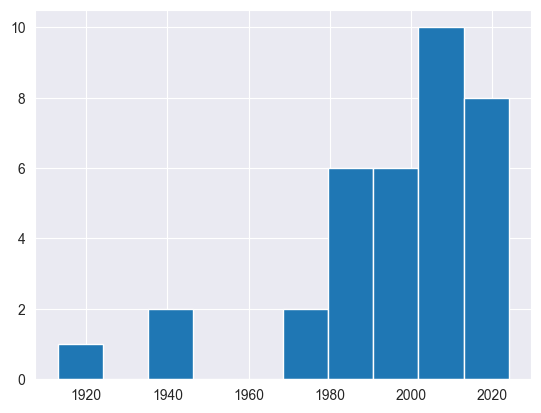

In [689]:
# concern is that the value might be associated with one year with a low count - looks like that's not the case.
proprx[proprx.HEAT_AR==0].ACT.hist()

In [690]:
proprx=proprx[proprx.HEAT_AR!=0]

In [691]:
num_built=proprx.ACT.value_counts()

In [692]:
num_built

ACT
2005    13028
2006    12873
2001    12351
2004    11001
2003    10960
        ...  
1860        1
1842        1
1882        1
1875        1
1885        1
Name: count, Length: 144, dtype: int64

The base table should be kept for future work, current focus is having cleaned features of interest.

Land use will be an important feature but without the context of location, it's less helpful.

In [693]:
df=proprx.groupby(['ACT','SITE_ZIP','SITE_CITY'])[['ACREAGE']].agg(['sum','count']).reset_index()

In [694]:
# need to drop a level due to the aggregationf

In [695]:
df.columns=df.columns.droplevel(1)

In [696]:
df.columns=['ACT','SITE_ZIP','SITE_CITY','ACREAGE','NUM_HOMES']
print(df.SITE_ZIP.value_counts())
df.head(2)

SITE_ZIP
33617         173
33637         141
33606         134
33605         132
33602         130
             ... 
33618-1033      1
33594-5528      1
33584-6111      1
33598-6491      1
33604-3360      1
Name: count, Length: 526, dtype: int64


,ACT,SITE_ZIP,SITE_CITY,ACREAGE,NUM_HOMES
0,1842,33606,TAMPA,0.164161,1
1,1860,33584,SEFFNER,0.548041,1


In [697]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ACT        6740 non-null   int64  
 1   SITE_ZIP   6740 non-null   object 
 2   SITE_CITY  6740 non-null   object 
 3   ACREAGE    6740 non-null   float64
 4   NUM_HOMES  6740 non-null   int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 263.4+ KB


In [698]:
#zip code won't be potentially useful if it's not numeric

df.SITE_ZIP=df.SITE_ZIP.str.slice(0,5)

In [699]:
# get rid of non-number data points
df=df[df.SITE_ZIP!='-']
df.sort_values(by='ACT',inplace=True)
df.head()

,ACT,SITE_ZIP,SITE_CITY,ACREAGE,NUM_HOMES
0,1842,33606,TAMPA,0.164161,1
1,1860,33584,SEFFNER,0.548041,1
2,1872,33592,THONOTOSASSA,5.317190,1
3,1875,33606,TAMPA,0.133298,1
4,1880,33578,RIVERVIEW,0.410135,1


In [700]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6722 entries, 0 to 6739
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ACT        6722 non-null   int64  
 1   SITE_ZIP   6722 non-null   object 
 2   SITE_CITY  6722 non-null   object 
 3   ACREAGE    6722 non-null   float64
 4   NUM_HOMES  6722 non-null   int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 315.1+ KB


473640


<Axes: xlabel='ACT', ylabel='Number of Houses Built'>

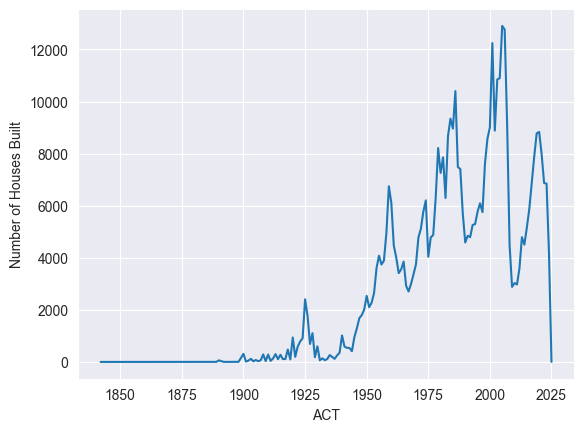

In [701]:
print(df.NUM_HOMES.sum())
df.groupby('ACT').NUM_HOMES.sum().plot(ylabel='Number of Houses Built')

In [702]:
df1=df.groupby('ACT').NUM_HOMES.sum()

In [703]:
df=df.merge(df1,left_on='ACT',right_on='ACT',how='left',suffixes=['x','']).drop(columns='NUM_HOMESx')

In [704]:
# Dropping homes that are claiming to have been built in 2025
df=df.iloc[0:len(df)-2,:]

In [705]:
df

,ACT,SITE_ZIP,SITE_CITY,ACREAGE,NUM_HOMES
0,1842,33606,TAMPA,0.164161,1
1,1860,33584,SEFFNER,0.548041,1
2,1872,33592,THONOTOSASSA,5.317190,1
3,1875,33606,TAMPA,0.133298,1
4,1880,33578,RIVERVIEW,0.410135,3
...,...,...,...,...,...
6715,2024,33570,RUSKIN,0.269336,4145
6716,2024,33570,RUSKIN,0.739707,4145
6717,2024,33570,RUSKIN,16.537539,4145
6718,2024,33569,RIVERVIEW,9.502820,4145


In [706]:
# There's a good set of aggregates in the Geo-data table, isolating other features.
proprx2=proprx.groupby(['ACT','SITE_CITY',])[['ACREAGE','tUNITS','tBLDGS','HEAT_AR']].agg(['sum','count']).reset_index()
proprx.groupby(['ACT','SITE_CITY',])[['ACREAGE','tUNITS','tBLDGS','HEAT_AR']].agg(['sum','count']).reset_index().head(2)

ACT SITE_CITY   ACREAGE       tUNITS       tBLDGS       HEAT_AR      
                        sum count    sum count    sum count     sum count
0  1842     TAMPA  0.164161     1    0.0     1    1.0     1  1428.0     1
1  1860   SEFFNER  0.548041     1    1.0     1    1.0     1  2298.0     1

In [707]:
proprx2.columns=proprx2.columns.droplevel(1)

In [708]:
proprx2

,ACT,SITE_CITY,ACREAGE,ACREAGE,tUNITS,tUNITS,tBLDGS,tBLDGS,HEAT_AR,HEAT_AR
0,1842,TAMPA,0.164161,1,0.0,1,1.0,1,1428.0,1
1,1860,SEFFNER,0.548041,1,1.0,1,1.0,1,2298.0,1
2,1872,THONOTOSASSA,5.317190,1,1.0,1,1.0,1,4046.0,1
3,1875,TAMPA,0.133298,1,0.0,1,1.0,1,4274.0,1
4,1880,RIVERVIEW,0.410135,1,1.0,1,1.0,1,1684.0,1
...,...,...,...,...,...,...,...,...,...,...
1980,2024,Temple Terrace,0.475670,4,4.0,4,4.0,4,5232.0,4
1981,2024,VALRICO,4.495054,28,28.0,28,28.0,28,72911.0,28
1982,2024,WIMAUMA,103.439482,771,761.0,771,598.0,771,1692621.0,771
1983,2025,PLANT CITY,12.329400,1,0.0,1,1.0,1,2574.0,1


In [709]:
proprx.head(2)

,FOLIO,TYPE,Edit_dt,PIN,DOR_C,OWNER,ADDR_1,ADDR_2,CITY,STATE,ZIP,COUNTRY,SUB,SITE_ADDR,SITE_CITY,SITE_ZIP,LEGAL1,LEGAL2,LEGAL3,LEGAL4,DBA,STRAP,tBEDS,tBATHS,tSTORIES,tUNITS,tBLDGS,TAXDIST,JUST,LAND,BLDG,EXF,ACT,EFF,HEAT_AR,ASD_VAL,TAX_VAL,MUNI,SD1,SD2,TIF,BASE,S_DATE,VI,S_AMT,ACREAGE,NBHC
3,80100.0,NaN,4/9/2019,U-01-27-17-001-000000-00001.1,0100,JEFFERY AND PATRICIA SEVIGNY,19859 ANGEL LN,NaN,ODESSA,FL,33556-3917,NaN,001,19859 ANGEL LN,ODESSA,33556,KEYSTONE PARK COLONY,TRACT 1 IN NE 1/4 LESS N 200 FT THEREOF LESS THE,COM AT NW COR OF TRACT 1 S 01 DEG 36 MIN 23 SEC E,339.93 FT FOR POB N 88 DEG 51 MIN 52 SEC E 604.43,NaN,172701001000000000011U,3.0,2.0,2.0,1.0,1.0,U,634852.0,217757.0,410323.0,6772.0,1996,2010,2617.0,457046.0,407046.0,U,NaN,NaN,NaN,2016,8/1/1987,I,50000.0,5.05878,211007.0
4,90000.0,NaN,4/9/2019,U-01-27-17-001-000000-00002.0,0100,MARIETTA SHIVER LIFE ESTATE,19901 ANGEL LN,NaN,ODESSA,FL,33556-3919,NaN,001,19901 ANGEL LN,ODESSA,33556,KEYSTONE PARK COLONY,S 210 OF W 225 FT OF TRACT 2 IN NE 1/4 LESS W 15,FT FOR R/W,NaN,NaN,172701001000000000020U,2.0,1.0,1.0,1.0,1.0,U,248877.0,94435.0,141733.0,12709.0,1973,1998,1619.0,136288.0,0.0,U,NaN,NaN,NaN,1994,NaN,NaN,0.0,1.00059,211007.0


In [710]:
proprx2.head(2)

,ACT,SITE_CITY,ACREAGE,ACREAGE,tUNITS,tUNITS,tBLDGS,tBLDGS,HEAT_AR,HEAT_AR
0,1842,TAMPA,0.164161,1,0.0,1,1.0,1,1428.0,1
1,1860,SEFFNER,0.548041,1,1.0,1,1.0,1,2298.0,1


In [711]:
# clear of nulls
proprx2.isna().sum()

ACT          0
SITE_CITY    0
ACREAGE      0
ACREAGE      0
tUNITS       0
tUNITS       0
tBLDGS       0
tBLDGS       0
HEAT_AR      0
HEAT_AR      0
dtype: int64

In [712]:
proprx2.SITE_CITY.unique()

array(['TAMPA', 'SEFFNER', 'THONOTOSASSA', 'RIVERVIEW', 'BRANDON',
       'PLANT CITY', 'VALRICO', 'DOVER', 'LITHIA', 'LUTZ', 'RUSKIN',
       'WIMAUMA', 'ZEPHYRHILLS', 'Tampa', 'GIBSONTON', 'TEMPLE TERRACE',
       'Plant City', 'ODESSA', 'SUN CITY CENTER', 'APOLLO BEACH',
       'MULBERRY', 'Unincorporated', 'LAKELAND', 'Temple Terrace',
       'WESLEY CHAPEL'], dtype=object)

Proprx2 (Property Records) is an aggregate of the features of interest for the long-term project and was part of EDA. Exported for future use and will refocus on a metric that can produce usable figures for the new index.


In [713]:
# Agg House construction by year
# It would be good to find better data sources that might describe construction within any given year but that won't work with the current dataset
annbuilt=proprx2.groupby(['ACT']).tBLDGS.sum()

In [714]:
proprx2.groupby(['ACT']).tBLDGS.sum()

,tBLDGS,tBLDGS
ACT,,
1842,1.0,1
1860,1.0,1
1872,1.0,1
1875,1.0,1
1880,4.0,3
...,...,...
2021,6882.0,7984
2022,5958.0,6883
2023,5702.0,6872


In [715]:
proprx2

,ACT,SITE_CITY,ACREAGE,ACREAGE,tUNITS,tUNITS,tBLDGS,tBLDGS,HEAT_AR,HEAT_AR
0,1842,TAMPA,0.164161,1,0.0,1,1.0,1,1428.0,1
1,1860,SEFFNER,0.548041,1,1.0,1,1.0,1,2298.0,1
2,1872,THONOTOSASSA,5.317190,1,1.0,1,1.0,1,4046.0,1
3,1875,TAMPA,0.133298,1,0.0,1,1.0,1,4274.0,1
4,1880,RIVERVIEW,0.410135,1,1.0,1,1.0,1,1684.0,1
...,...,...,...,...,...,...,...,...,...,...
1980,2024,Temple Terrace,0.475670,4,4.0,4,4.0,4,5232.0,4
1981,2024,VALRICO,4.495054,28,28.0,28,28.0,28,72911.0,28
1982,2024,WIMAUMA,103.439482,771,761.0,771,598.0,771,1692621.0,771
1983,2025,PLANT CITY,12.329400,1,0.0,1,1.0,1,2574.0,1


In [716]:
annbuilt.columns=annbuilt.columns.droplevel()

ValueError: Cannot remove 1 levels from an index with 1 levels: at least one level must be left.

In [717]:
annbuilt.index.name='year'

In [718]:
annbuilt.columns=['num_homes','num_buildings']

In [719]:
print(annbuilt.reset_index())
annbuilt.reset_index(inplace=True)

     year  num_homes  num_buildings
0    1842        1.0              1
1    1860        1.0              1
2    1872        1.0              1
3    1875        1.0              1
4    1880        4.0              3
..    ...        ...            ...
139  2021     6882.0           7984
140  2022     5958.0           6883
141  2023     5702.0           6872
142  2024     3001.0           4249
143  2025        2.0              2

[144 rows x 3 columns]


In [720]:
# isolate to sampling years - 1990-2024
# must extend back to 1989 for metrics (need previous year for rate of change of houses)

annbuilt=annbuilt[annbuilt.year.between(1989,2024)].sort_values(by='year')
annbuilt.head(2)

,year,num_homes,num_buildings
107,1989,5291.0,5705
108,1990,4260.0,4590


Primary features of interest for simple model are Year Built, Acreage, totalGrossAreaSqft.

Understanding the relationship between development per property and population density and growth will be a calculated feature used in the construction of the HII-aquatic index.

In [721]:
annbuilt.head(5)

,year,num_homes,num_buildings
107,1989,5291.0,5705
108,1990,4260.0,4590
109,1991,3558.0,4849
110,1992,4147.0,4795
111,1993,4992.0,5264


In [722]:
annbuilt.describe()

,year,num_homes,num_buildings
count,36.000000,36.000000,36.000000
mean,2006.500000,5624.000000,6854.250000
std,10.535654,1988.236879,2751.212152
min,1989.000000,2446.000000,2902.000000
25%,1997.750000,4143.750000,4794.250000
50%,2006.500000,5393.000000,5987.500000
75%,2015.250000,7357.500000,8794.750000
max,2024.000000,9545.000000,12906.000000


In [974]:
annbuilt[annbuilt.year>2020]

,year,num_homes,num_buildings
139,2021,6882.0,7984
140,2022,5958.0,6883
141,2023,5702.0,6872
142,2024,3001.0,4249


In [730]:
nmerge_O_ann=nmerge.reset_index(names='date')

In [792]:
nmerge_stage2constr['year']=nmerge_stage2constr.date_adj.dt.year

In [802]:
testn=nmerge_stage2constr.groupby(['StationID','year']).ResultValue_O.mean().reset_index()

In [822]:
nmerge_stage2constr.groupby(['StationID','year']).ResultValue_O.mean()

StationID  year
11         1990    0.558333
           1991    0.538750
           1992    0.586667
           1993    0.643333
           1994    1.088333
                     ...   
M32        2012         NaN
           2014    0.566000
M33        2014         NaN
M34        2006         NaN
           2009         NaN
Name: ResultValue_O, Length: 1555, dtype: float64

In [817]:
testn2=testn.sort_values(by=['year','StationID'])

<Axes: xlabel='year', ylabel='ResultValue_O'>

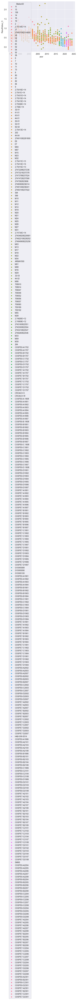

In [820]:
sns.scatterplot(x='year',y='ResultValue_O',hue='StationID',data=testn2)

In [746]:
nmerge_O_ann=np.log(nmerge_O_ann)

In [780]:
nmerge_stage2constr.reset_index(inplace=True)

In [828]:
# Figure out the stations with a majority of the samples
stations=nmerge_stage2constr.groupby('StationID').ResultValue_O.count()
stations_id=stations[stations>20]

In [837]:
stations_id

StationID
11          413
13          411
136         301
14          411
16          412
19          411
2           276
202          77
21          411
264          81
28          408
32          411
32-01        58
32-03        58
33          411
41-01        59
43-01        58
44          193
44-02        55
44-04        57
50-01        56
52          224
52-01        55
54          242
55          270
58          275
594          24
6           229
62-02        43
7           195
70          245
71          217
73          188
8           141
80          149
81          410
82          407
84          410
9           411
ARBAY000    149
E6           84
E7           84
Name: ResultValue_O, dtype: int64

In [838]:
nmerge_stage2constr[nmerge_stage2constr.StationID==11]

,date_adj,StationID,ResultValue_K,ResultValue_A,ResultValue_N,ResultValue_O,year


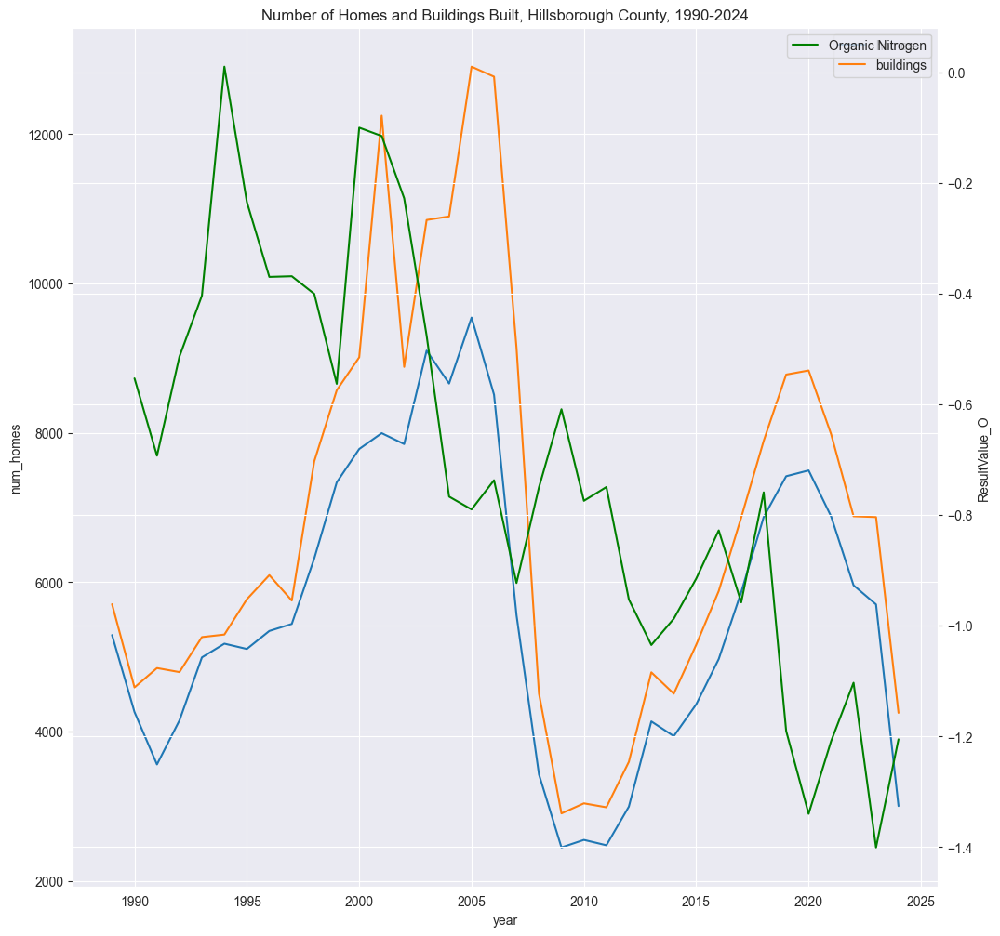

In [748]:
fig, ax = plt.subplots(figsize=(12,12))
plt.subplot()
plt.title('Number of Homes and Buildings Built, Hillsborough County, 1990-2024')
sns.lineplot(x=annbuilt.year,y=annbuilt.num_homes,label='homes',ax=ax)
sns.lineplot(x=annbuilt.year,y=annbuilt.num_buildings,label='buildings',ax=ax)
ylabel='Constructed Units'
ax1=ax.twinx()
plt.subplot()
sns.lineplot(x=nmerge_O_ann.index,y=nmerge_O_ann,label='Organic Nitrogen',ax=ax1, color='green')
plt.legend()
plt.show()

One possible inference from this chart could be the rise of large multi-family complexes. <br>
Developers began to buy larger plots of land and then built properties with multiple buildings on it. <br>
This can be examined with the dataset in further studies

Home construction is driven by an array of various factors that extend beyond the scope of this, in its current form.

When considering the timing and state of the economy amd what was happening at that time, 2009 was the "great recession" and very specifically in real estate.

In recent time, at the advent of the COVID crisis, real estate demand soared with low bank rates. We see that pattern again - this time with house construction and property sales reduced to the bank increasing interest rates.
This chart doesn't line up perfectly with nitrogen concentration dat but as can be seen in the ecosystem data, it may share similarities to biodiversity.

All data still needs to be scaled so it can be used for the construction of the index. Furthermore, it is possible to engineer supplementary metrics that would aid in analysis. 

It doesn't make sense to try and model this data yet - it's driven by factors outside of time alone.
Data will be exported for the final notebook

## Rates of Change

The impact of coastal development extends beyond the shoreline. In an estuarine environment, the watersheds that feed into the estuary (or in the case the bay) are equally important. Using a highway as a physical boundary overlapped with a map of the various watersheds, a representative set of properties, the type, their acreage and the year that they were built will be used as an estimate and proxy for coastline development.  Based on research literature, concentration of non-organic nitrates and phosphates will serve as a proxy for the introduction of artificial damaging compounds - however, in the construction of more complex models, more granular data can be used.

In [919]:
## Looking at rates of change
annbuilt

,year,num_homes,num_buildings
107,1989,5291.0,5705
108,1990,4260.0,4590
109,1991,3558.0,4849
110,1992,4147.0,4795
111,1993,4992.0,5264
112,1994,5176.0,5298
113,1995,5105.0,5771
114,1996,5346.0,6094
115,1997,5440.0,5754
116,1998,6318.0,7619


In [920]:
# Creating series for loop

dfyearbuilt=annbuilt.num_homes
dfyearbuilt.reset_index(drop=True,inplace=True)

In [958]:
## This gives us the annual change in the construction of buildings

perchange = []
year = 1989  # Assuming your data starts with 1989
year1 = []
x_base = []
x1 = []

for x in range(len(dfyearbuilt) - 1):  # Loop until the second-to-last element
    perchange.append(round((dfyearbuilt[x + 1] / dfyearbuilt[x]) * 100, 3))
    x_base.append(dfyearbuilt[x])
    x1.append(dfyearbuilt[x + 1])
    year += 1
    year1.append(year)

In [925]:
#annual change in "properties built"
perchange

[80.514,
 83.521,
 116.554,
 120.376,
 103.686,
 98.628,
 104.721,
 101.758,
 116.14,
 116.129,
 106.092,
 102.724,
 98.174,
 115.949,
 95.155,
 110.207,
 89.178,
 65.284,
 61.616,
 71.437,
 104.129,
 97.173,
 120.929,
 138.122,
 95.235,
 110.846,
 113.886,
 118.028,
 117.15,
 107.96,
 101.051,
 91.797,
 86.574,
 95.703,
 52.631,
 80.514,
 83.521,
 116.554,
 120.376,
 103.686,
 98.628,
 104.721,
 101.758,
 116.14,
 116.129,
 106.092,
 102.724,
 98.174,
 115.949,
 95.155,
 110.207,
 89.178,
 65.284,
 61.616,
 71.437,
 104.129,
 97.173,
 120.929,
 138.122,
 95.235,
 110.846,
 113.886,
 118.028,
 117.15,
 107.96,
 101.051,
 91.797,
 86.574,
 95.703,
 52.631]

In [960]:
# checking values
perchange[0:5]

[80.514, 83.521, 116.554, 120.376, 103.686]

In [961]:
dfperchange=pd.DataFrame()
dfperchange['percentchange']=perchange

In [962]:
dfperchange['x']=x_base
dfperchange['x+1']=x1
dfperchange['year']=year1

In [963]:
dfperchange.head(5)

,percentchange,x,x+1,year
0,80.514,5291.0,4260.0,1990
1,83.521,4260.0,3558.0,1991
2,116.554,3558.0,4147.0,1992
3,120.376,4147.0,4992.0,1993
4,103.686,4992.0,5176.0,1994


In [964]:
annbuilt

,year,num_homes,num_buildings
107,1989,5291.0,5705
108,1990,4260.0,4590
109,1991,3558.0,4849
110,1992,4147.0,4795
111,1993,4992.0,5264
112,1994,5176.0,5298
113,1995,5105.0,5771
114,1996,5346.0,6094
115,1997,5440.0,5754
116,1998,6318.0,7619


In [966]:
dftotalunit=annbuilt.num_buildings

In [967]:
dftotalunit.reset_index(inplace=True,drop=True)

In [968]:
## This gives us the annual change in the construction of buildings

perchange_build = []
year_build = 1989
year1_build = []
x_base1 = []  # Note: You had x_base1 in the original code, keeping it consistent
x2 = []

for x in range(len(dftotalunit) - 1):  # Use dftotalunit for loop range
    perchange_build.append(round((dftotalunit[x + 1] / dftotalunit[x]) * 100, 3))
    x_base1.append(dftotalunit[x])  # Store base value in x_base1
    x2.append(dftotalunit[x + 1])  # Store new value in x2
    year_build += 1
    year1_build.append(year_build)  # Store year in year1_build

# Checking results
for i in range(len(perchange_build)):
    print(f"Year: {year1_build[i]}, Change: {perchange_build[i]}%, Base: {x_base1[i]}, New: {x2[i]}")

Year: 1990, Change: 80.456%, Base: 5705, New: 4590
Year: 1991, Change: 105.643%, Base: 4590, New: 4849
Year: 1992, Change: 98.886%, Base: 4849, New: 4795
Year: 1993, Change: 109.781%, Base: 4795, New: 5264
Year: 1994, Change: 100.646%, Base: 5264, New: 5298
Year: 1995, Change: 108.928%, Base: 5298, New: 5771
Year: 1996, Change: 105.597%, Base: 5771, New: 6094
Year: 1997, Change: 94.421%, Base: 6094, New: 5754
Year: 1998, Change: 132.412%, Base: 5754, New: 7619
Year: 1999, Change: 112.495%, Base: 7619, New: 8571
Year: 2000, Change: 105.145%, Base: 8571, New: 9012
Year: 2001, Change: 135.919%, Base: 9012, New: 12249
Year: 2002, Change: 72.528%, Base: 12249, New: 8884
Year: 2003, Change: 122.152%, Base: 8884, New: 10852
Year: 2004, Change: 100.442%, Base: 10852, New: 10900
Year: 2005, Change: 118.404%, Base: 10900, New: 12906
Year: 2006, Change: 98.962%, Base: 12906, New: 12772
Year: 2007, Change: 71.555%, Base: 12772, New: 9139
Year: 2008, Change: 49.316%, Base: 9139, New: 4507
Year: 200

In [969]:
dfperchange.columns=['perchange_homesbuilt','built_base_year','built_new','year']

In [970]:
dfperchange['perchange_buildings']=perchange_build

In [971]:
dfperchange['build_base']=x_base1
dfperchange['build_new']=x2

In [988]:
dfperchange.head()

,perchange_homesbuilt,built_base_year,built_new,year,perchange_buildings,build_base,build_new
0,80.514,5291.0,4260.0,1990,80.456,5705,4590
1,83.521,4260.0,3558.0,1991,105.643,4590,4849
2,116.554,3558.0,4147.0,1992,98.886,4849,4795
3,120.376,4147.0,4992.0,1993,109.781,4795,5264
4,103.686,4992.0,5176.0,1994,100.646,5264,5298


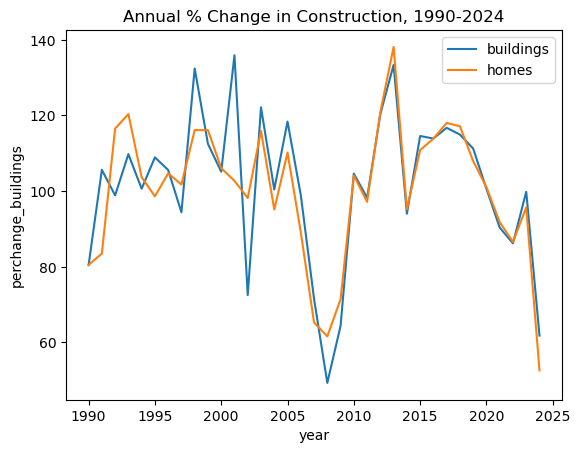

In [992]:
sns.lineplot(x='year',y='perchange_buildings',data=dfperchange,label='buildings')
sns.lineplot(x='year',y='perchange_homesbuilt',data=dfperchange,label='homes')
plt.title('Annual % Change in Construction, 1990-2024')
plt.ylabel='Percent Change (%)'
plt.legend()
plt.show()

## Population Growth

In [1023]:
### Looking into population statistics now

Data:
Regional population growth was difficult to define based on the resolution of data available.
2 sets of population data were initially used forming 2 baseline models:
- Data available specifically for the metro Tampa area
- WHO data for the entire Tampa Bay region.

Both models demonstrated the same growth patterns, as discussed below

The data and model aggregated at the highest level was used to match the scale of the data being considered in both development rates and nutrient loading
The second data set was more comprehensive in its total figures.

The expected outcome of a baseline model was to see exponential growth that would be matched by patterns in development; however, this was not the case.
In the 34 year time scale of the study, population growth was steady and displayed linear growth.

The issue here is the amount of data.
Finding figures that describe the area of interest was limited. Population for the city itself was available for all years but for the region at large, which is what is needed, only WHO data captured that.
The WHO data only has 12 population estimations, each at 5 year intervals (1975-2030) of which the last two are predictions already (2025,2030).

Annual data is needed. To this end, a Linear Regression was used in order to calculate those values using a Leave-one-out (LOO) method for cross validation.

### WHO Population Data

In [1198]:
### Create population DFs
dfpop_staged

,wkt_geom,OBJECTID,SMOD_LEVEL,SMOD_ID,ISO,CNTRY_NAME,JRC_NAME_MAIN,JRC_NAME_LIST,CIESIN_NAME,CIESIN_NAME_TL,AREA_SQKM,AREA_SQM,CIESIN_NAME_ADJ,ADJ,GHSPOP_R19_1975,GHSPOP_R19_1990,GHSPOP_R19_2000,GHSPOP_R19_2015,GHSPOP_R23_1975,GHSPOP_R23_1980,GHSPOP_R23_1985,GHSPOP_R23_1990,GHSPOP_R23_1995,GHSPOP_R23_2000,GHSPOP_R23_2005,GHSPOP_R23_2010,GHSPOP_R23_2015,GHSPOP_R23_2020,GHSPOP_R23_2025,GHSPOP_R23_2030
0,MultiPolygon (((-82.72100607199996603 28.37449...,12407,30,30_12407,USA,United States,Tampa,Tampa; Saint Petersburg; Clearwater; Brandon; ...,Tampa,Tampa,1745.422402,1.745422e+09,Tampa,0.0,F,1.305016e+06,1.714504e+06,1.993365e+06,980167.207100,1.195809e+06,1.333843e+06,1.480168e+06,1.601766e+06,1.717621e+06,1.824984e+06,1.920968e+06,2.045045e+06,2.191664e+06,2.261370e+06,2.330530e+06
1,MultiPolygon (((-82.41634709599998132 27.71290...,101040,23,23_87924,USA,United States,Sun City Center,Sun City Center; Greater Sun Center; Ruskin; G...,"Greater Sun Center, Sun City Center","Greater Sun Center, Sun City Center",42.796333,4.279633e+07,"Greater Sun Center, Sun City Center",NaN,11163.29545,1.725212e+04,2.122397e+04,2.838951e+04,12661.218560,1.253746e+04,1.568739e+04,1.837320e+04,2.062473e+04,2.210739e+04,2.713719e+04,2.711277e+04,2.903848e+04,3.109123e+04,3.220606e+04,3.357573e+04
2,MultiPolygon (((-82.37805279399998426 27.81459...,101047,23,23_87931,USA,United States,Adamsville,Adamsville; North Ruskin; Apollo Beach,Apollo Beach,Apollo Beach,26.476118,2.647612e+07,Apollo Beach,NaN,5564.827307,8.602107e+03,1.090787e+04,1.474059e+04,6259.350004,6.348697e+03,7.839934e+03,9.115709e+03,1.024629e+04,1.101930e+04,1.340539e+04,1.364281e+04,1.467739e+04,1.571192e+04,1.632053e+04,1.699778e+04
3,MultiPolygon (((-82.33898157599998058 27.82306...,101054,23,23_87938,USA,United States,Riverview,Riverview; Riverview,Panther Trace,Panther Trace,17.931987,1.793199e+07,Panther Trace,NaN,10059.89708,1.549627e+04,1.960960e+04,2.584830e+04,10124.148230,1.236164e+04,1.382634e+04,1.547221e+04,1.716790e+04,1.918479e+04,2.176125e+04,2.414159e+04,2.630752e+04,2.811921e+04,2.902663e+04,2.993258e+04
4,MultiPolygon (((-82.21098576599996477 27.84849...,101064,23,23_87948,USA,United States,Fishhawk,Fishhawk,Parkside Village,Parkside Village,4.980987,4.980987e+06,Parkside Village,NaN,2865.958633,4.492428e+03,5.881465e+03,7.213995e+03,3046.078571,3.750538e+03,4.166395e+03,4.651319e+03,5.197914e+03,5.798763e+03,6.694678e+03,7.502811e+03,8.249881e+03,8.864453e+03,9.098630e+03,9.350476e+03


In [1063]:
dfpop=pd.DataFrame()
dfpop['year']=0
dfpop['sumpop']=0

In [1064]:
# Staging table for population statistics
dfpop_staged
## This file was originally a geodatabase file that has been read in as a CSV to access the non-geospatial data.

,wkt_geom,OBJECTID,SMOD_LEVEL,SMOD_ID,ISO,CNTRY_NAME,JRC_NAME_MAIN,JRC_NAME_LIST,CIESIN_NAME,CIESIN_NAME_TL,AREA_SQKM,AREA_SQM,CIESIN_NAME_ADJ,ADJ,GHSPOP_R19_1975,GHSPOP_R19_1990,GHSPOP_R19_2000,GHSPOP_R19_2015,GHSPOP_R23_1975,GHSPOP_R23_1980,GHSPOP_R23_1985,GHSPOP_R23_1990,GHSPOP_R23_1995,GHSPOP_R23_2000,GHSPOP_R23_2005,GHSPOP_R23_2010,GHSPOP_R23_2015,GHSPOP_R23_2020,GHSPOP_R23_2025,GHSPOP_R23_2030
0,MultiPolygon (((-82.72100607199996603 28.37449...,12407,30,30_12407,USA,United States,Tampa,Tampa; Saint Petersburg; Clearwater; Brandon; ...,Tampa,Tampa,1745.422402,1.745422e+09,Tampa,0.0,F,1.305016e+06,1.714504e+06,1.993365e+06,980167.207100,1.195809e+06,1.333843e+06,1.480168e+06,1.601766e+06,1.717621e+06,1.824984e+06,1.920968e+06,2.045045e+06,2.191664e+06,2.261370e+06,2.330530e+06
1,MultiPolygon (((-82.41634709599998132 27.71290...,101040,23,23_87924,USA,United States,Sun City Center,Sun City Center; Greater Sun Center; Ruskin; G...,"Greater Sun Center, Sun City Center","Greater Sun Center, Sun City Center",42.796333,4.279633e+07,"Greater Sun Center, Sun City Center",NaN,11163.29545,1.725212e+04,2.122397e+04,2.838951e+04,12661.218560,1.253746e+04,1.568739e+04,1.837320e+04,2.062473e+04,2.210739e+04,2.713719e+04,2.711277e+04,2.903848e+04,3.109123e+04,3.220606e+04,3.357573e+04
2,MultiPolygon (((-82.37805279399998426 27.81459...,101047,23,23_87931,USA,United States,Adamsville,Adamsville; North Ruskin; Apollo Beach,Apollo Beach,Apollo Beach,26.476118,2.647612e+07,Apollo Beach,NaN,5564.827307,8.602107e+03,1.090787e+04,1.474059e+04,6259.350004,6.348697e+03,7.839934e+03,9.115709e+03,1.024629e+04,1.101930e+04,1.340539e+04,1.364281e+04,1.467739e+04,1.571192e+04,1.632053e+04,1.699778e+04
3,MultiPolygon (((-82.33898157599998058 27.82306...,101054,23,23_87938,USA,United States,Riverview,Riverview; Riverview,Panther Trace,Panther Trace,17.931987,1.793199e+07,Panther Trace,NaN,10059.89708,1.549627e+04,1.960960e+04,2.584830e+04,10124.148230,1.236164e+04,1.382634e+04,1.547221e+04,1.716790e+04,1.918479e+04,2.176125e+04,2.414159e+04,2.630752e+04,2.811921e+04,2.902663e+04,2.993258e+04
4,MultiPolygon (((-82.21098576599996477 27.84849...,101064,23,23_87948,USA,United States,Fishhawk,Fishhawk,Parkside Village,Parkside Village,4.980987,4.980987e+06,Parkside Village,NaN,2865.958633,4.492428e+03,5.881465e+03,7.213995e+03,3046.078571,3.750538e+03,4.166395e+03,4.651319e+03,5.197914e+03,5.798763e+03,6.694678e+03,7.502811e+03,8.249881e+03,8.864453e+03,9.098630e+03,9.350476e+03


In [1523]:
#The multiple measurements "GHSPOP..." are new revisions of the same data set - meaning 'R23' is the most recent revision, in 2023.
dfpop_staged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 30 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   wkt_geom         5 non-null      object 
 1   OBJECTID         5 non-null      int64  
 2   SMOD_LEVEL       5 non-null      int64  
 3   SMOD_ID          5 non-null      object 
 4   ISO              5 non-null      object 
 5   CNTRY_NAME       5 non-null      object 
 6   JRC_NAME_MAIN    5 non-null      object 
 7   JRC_NAME_LIST    5 non-null      object 
 8   CIESIN_NAME      5 non-null      object 
 9   CIESIN_NAME_TL   5 non-null      object 
 10  AREA_SQKM        5 non-null      float64
 11  AREA_SQM         5 non-null      float64
 12  CIESIN_NAME_ADJ  5 non-null      object 
 13  ADJ              1 non-null      float64
 14  GHSPOP_R19_1975  5 non-null      object 
 15  GHSPOP_R19_1990  5 non-null      float64
 16  GHSPOP_R19_2000  5 non-null      float64
 17  GHSPOP_R19_2015  5 n

In [1449]:
# Setting aside the area summaries. This is just because of the way the CSV is read in - moving along the columns for different years
area_stage=pd.concat([dfpop_staged.CIESIN_NAME,dfpop_staged.AREA_SQKM],axis=1)

In [1450]:
area_stage

,CIESIN_NAME,AREA_SQKM
0,Tampa,1745.422402
1,"Greater Sun Center, Sun City Center",42.796333
2,Apollo Beach,26.476118
3,Panther Trace,17.931987
4,Parkside Village,4.980987


In [1451]:
dfpop_staged.AREA_SQKM

0    1745.422402
1      42.796333
2      26.476118
3      17.931987
4       4.980987
Name: AREA_SQKM, dtype: float64

In [1452]:
est_pop=dfpop_staged.iloc[0:,18:]

In [1453]:
est_pop

,GHSPOP_R23_1975,GHSPOP_R23_1980,GHSPOP_R23_1985,GHSPOP_R23_1990,GHSPOP_R23_1995,GHSPOP_R23_2000,GHSPOP_R23_2005,GHSPOP_R23_2010,GHSPOP_R23_2015,GHSPOP_R23_2020,GHSPOP_R23_2025,GHSPOP_R23_2030
0,980167.207100,1.195809e+06,1.333843e+06,1.480168e+06,1.601766e+06,1.717621e+06,1.824984e+06,1.920968e+06,2.045045e+06,2.191664e+06,2.261370e+06,2.330530e+06
1,12661.218560,1.253746e+04,1.568739e+04,1.837320e+04,2.062473e+04,2.210739e+04,2.713719e+04,2.711277e+04,2.903848e+04,3.109123e+04,3.220606e+04,3.357573e+04
2,6259.350004,6.348697e+03,7.839934e+03,9.115709e+03,1.024629e+04,1.101930e+04,1.340539e+04,1.364281e+04,1.467739e+04,1.571192e+04,1.632053e+04,1.699778e+04
3,10124.148230,1.236164e+04,1.382634e+04,1.547221e+04,1.716790e+04,1.918479e+04,2.176125e+04,2.414159e+04,2.630752e+04,2.811921e+04,2.902663e+04,2.993258e+04
4,3046.078571,3.750538e+03,4.166395e+03,4.651319e+03,5.197914e+03,5.798763e+03,6.694678e+03,7.502811e+03,8.249881e+03,8.864453e+03,9.098630e+03,9.350476e+03


In [1455]:
# Get the total sum of the area for calculations in population densities 
area=sum(dfpop_staged.AREA_SQKM)
area

1837.60782761

In [1456]:
dfdf=pd.DataFrame(columns=['year','population','density'])

In [1457]:
area

1837.60782761

In [1458]:
## Set up series for 5 year intervals
f=pd.Series()
density=pd.Series()
counter=1975

for x in est_pop.columns:
    pop_temp=sum(est_pop[x])
    dfdf['year']=counter
    f[counter]=sum(est_pop[x])
    density[counter]=sum(est_pop[x])/area
    counter=counter+5
    
    
    #print(sum(est_pop[x])/area)

In [1459]:
density

1975     550.856384
1980     669.788049
1985     748.452942
1990     831.396548
1995     900.628835
2000     966.327417
2005    1030.678157
2010    1084.762411
2015    1155.479474
2020    1238.267758
2025    1277.760096
2030    1317.139821
dtype: float64

In [1460]:
pop_data=pd.concat([f,density],axis=1)
pop_data.columns=['population','density']
pop_data.reset_index(names=['year'],inplace=True)
pop_data

,year,population,density
0,1975,1.012258e+06,550.856384
1,1980,1.230808e+06,669.788049
2,1985,1.375363e+06,748.452942
3,1990,1.527781e+06,831.396548
4,1995,1.655003e+06,900.628835
5,2000,1.775731e+06,966.327417
6,2005,1.893982e+06,1030.678157
7,2010,1.993368e+06,1084.762411
8,2015,2.123318e+06,1155.479474
9,2020,2.275451e+06,1238.267758


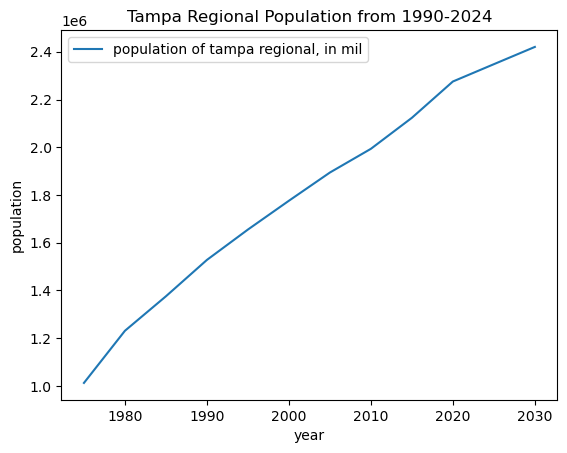

In [1461]:
# Visualize the population growth
# Based on global trends and the stated demand for the area, it may have been expected that the growth pattern was different, if not exponential but it certainly follows a linear trend
sns.lineplot(x=pop_data.year,y=pop_data.population,label='population of tampa regional, in mil')
plt.title('Tampa Regional Population from 1990-2024')
#plt.ylabel='population, in millions'
plt.show()

In [1462]:
# In order to fill in the missing values, a basic univariate linear regression would be benef

In [1463]:
X=pop_data.year.to_frame()

In [1464]:
y=pop_data.population.to_frame()

In [1634]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import LeaveOneOut

# Extract year and population data
year = np.array(pop_data.year).reshape(-1, 1)  # Reshape for sklearn compatibility
population = np.array(pop_data.population)


model = LinearRegression()

# Inst. Leave-One-Out cross-validation
loo = LeaveOneOut()

y_true_all = []  # To store all true values
y_pred_all = []  # To store all predictions

# Performing LOO cross-validation
for train_index, test_index in loo.split(year):
    X_train, X_test = year[train_index], year[test_index]
    y_train, y_test = population[train_index], population[test_index]

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    y_true_all.append(y_test[0])  # Store the true value
    y_pred_all.append(y_pred[0])  # Store the predicted value

# Calculate PRESS (Predicted Residual Sum of Squares)
press = np.sum((np.array(y_true_all) - np.array(y_pred_all)) ** 2)

# Calculate TSS (Total Sum of Squares)
tss = np.sum((population - np.mean(population)) ** 2)

# Calculate predictive R-squared
predictive_r2 = 1 - (press / tss)

print(f"Predictive R-squared: {predictive_r2}")

Predictive R-squared: 0.9825508791080889


In [1605]:
model.coef_

array([25948.01830335])

Regression Results: <br>
Given there's so few samples, it's not feasible to get a normal R2 value,
so a predicted r2 value will be used in place in best estimate.

The r2 describes the regression model as covering 98.25% of the variance, which would indicate it's performing well.

That said, while this gives figures for this the preliminary establishment of the API index, this would need to be run again with a larger dataset.

In [1639]:
# Need to get predicted values for all years

In [1529]:
year_range_current = range(1969, 2025) 

year_range_current_np = np.array(year_range_current) 

# reshape and predicting
WHO_pred_all = model.predict(year_range_current_np.reshape(-1, 1)) 

In [1530]:
pop_all=pd.DataFrame()

In [1531]:
pop_all['year']=year_range_current
pop_all['WHO_pred']=WHO_pred_all

In [1538]:
pop_all.head(2)

,year,WHO_pred
0,1969,942073.589560
1,1970,968021.607863


### City Population Data

Now checking the city population data


In [1574]:
pop_all

,year,WHO_pred,metro_est_pop,metro_known
0,1969,9.420736e+05,9.420736e+05,483694
1,1970,9.680216e+05,9.680216e+05,493409
2,1971,9.939696e+05,9.939696e+05,513136
3,1972,1.019918e+06,1.019918e+06,533386
4,1973,1.045866e+06,1.045866e+06,564604
5,1974,1.071814e+06,1.071814e+06,586558
6,1975,1.097762e+06,1.097762e+06,593254
7,1976,1.123710e+06,1.123710e+06,601762
8,1977,1.149658e+06,1.149658e+06,607712
9,1978,1.175606e+06,1.175606e+06,620076


In [1575]:
# This is the population data for the city alone read in earlier through 2022
pop_metro.head(5)

,Year,Population,Index,Percent Change,Percent of Statewide Total,Percent of Nationwide Total
0,1969,483694,100.000000,N,7.283451,0.240288
1,1970,493409,102.008501,2.008501243,7.207941,0.242106
2,1971,513136,106.086906,3.998102994,7.163676,0.248111
3,1972,533386,110.273437,3.946322223,7.092593,0.254873
4,1973,564604,116.727518,5.852797036,7.122454,0.267143


In [1576]:
pop_metro.describe()

,Year,Population,Index,Percent of Statewide Total,Percent of Nationwide Total
count,54.000000,5.400000e+01,54.000000,54.000000,54.000000
mean,1995.500000,9.581087e+05,198.081573,6.612874,0.347789
std,15.732133,3.042668e+05,62.904804,0.275617,0.059143
min,1969.000000,4.836940e+05,100.000000,6.208716,0.240288
25%,1982.250000,6.935000e+05,143.375771,6.374401,0.298658
50%,1995.500000,9.142940e+05,189.023225,6.616038,0.341357
75%,2008.750000,1.209731e+06,250.102492,6.769157,0.395201
max,2022.000000,1.513473e+06,312.898858,7.283451,0.454126


In [1573]:
# Creating a model to see how well the two predict values, and comparing the coefficients

In [ ]:
# Linear Model for metro population data

import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming your data is in a pandas DataFrame called 'df'
# Extract year and population data
year = np.array(pop_metro.Year).reshape(-1, 1)  # Reshape for sklearn compatibility
population = np.array(pop_metro.Population)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    year, population, test_size=0.2, random_state=42
)

# Initialize and train the model
model2 = LinearRegression()
model2.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model2.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 804375242.0674232
R-squared: 0.9934046470995561


TypeError: 'str' object is not callable

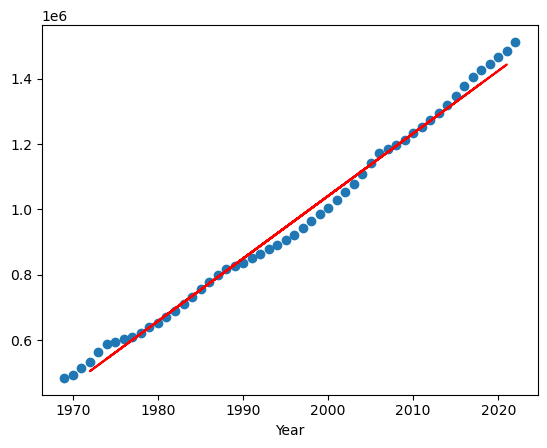

In [ ]:
# Plot the results
plt.scatter(year, population)
plt.plot(X_test, y_pred, color="red")
plt.xlabel("Year")
plt.ylabel("Population")
plt.title("Linear Regression Model")
plt.show()

In [1607]:
METRO_REG_COEF=model2.coef_

In [1608]:
METRO_REG_COEF

array([19178.84778663])

In [1602]:
POP_REG_COEF

array([25948.01830335])

In [1612]:
#missing 2 years needed for data
pop_all.tail(3)

,year,WHO_pred,metro_est_pop,metro_known
53,2022,2.317319e+06,1.463373e+06,1513473.0
54,2023,2.343267e+06,1.482552e+06,NaN
55,2024,2.369215e+06,1.501731e+06,NaN


In [1581]:
# now predicting to join to pop_all
ypred_metro=model.predict(pop_all.year.to_frame())

C:\Users\Ajax\miniconda3\envs\bs\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(


In [1615]:
# Add data to pred values df
pop_all['metro_est_pop']=ypred_metro

In [1616]:
# looking at the missing data
pop_all['metro_known']=pop_metro.Population
pop_all.tail(4)

,year,WHO_pred,metro_est_pop,metro_known
52,2021,2.291371e+06,1.444194e+06,1484607.0
53,2022,2.317319e+06,1.463373e+06,1513473.0
54,2023,2.343267e+06,1.482552e+06,NaN
55,2024,2.369215e+06,1.501731e+06,NaN


In [1618]:
pop_data

,year,population,density
0,1975,1.012258e+06,550.856384
1,1980,1.230808e+06,669.788049
2,1985,1.375363e+06,748.452942
3,1990,1.527781e+06,831.396548
4,1995,1.655003e+06,900.628835
5,2000,1.775731e+06,966.327417
6,2005,1.893982e+06,1030.678157
7,2010,1.993368e+06,1084.762411
8,2015,2.123318e+06,1155.479474
9,2020,2.275451e+06,1238.267758


TypeError: 'str' object is not callable

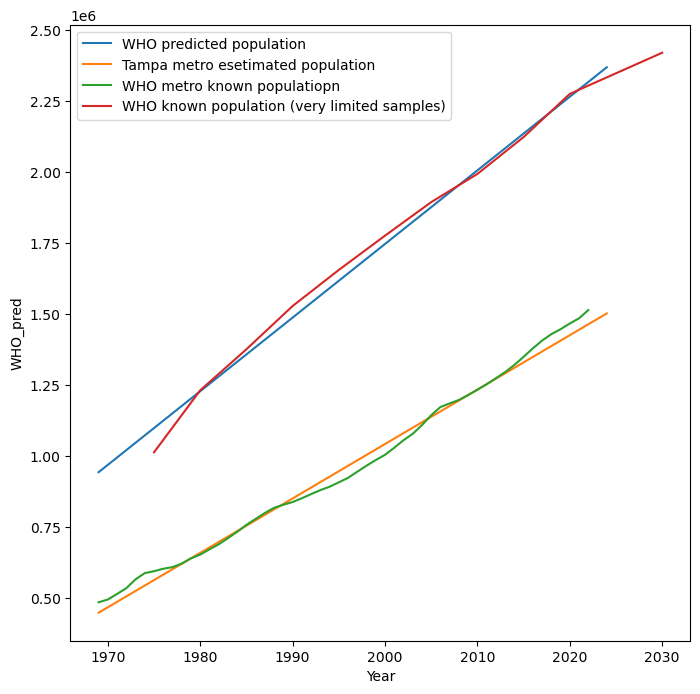

In [1630]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,8))
# Create the line plot
sns.lineplot(x='year', y='WHO_pred', data=pop_all, label='WHO predicted population')
sns.lineplot(x='year', y='metro_est_pop', data=pop_all, label='Tampa metro esetimated population')
sns.lineplot(x='year', y='metro_known', data=pop_all, label='WHO metro known populatiopn')
sns.lineplot(x='year',y='population', data=pop_data, label='WHO known population (very limited samples)')
# Add labels and title
plt.xlabel('Year')
plt.ylabel('Population')
plt.title('Population Estimates Over Time')
plt.tight_layout()
# Show the plot
plt.legend()
plt.show()

In [1624]:
print(f'Metro Coefficient: {METRO_REG_COEF}')
print(f'Regional Population  Coefficient: {POP_REG_COEF}')

Metro Coefficient: [19178.84778663]
Regional Population  Coefficient: [25948.01830335]


In [1631]:
POP_REG_COEF/METRO_REG_COEF

array([1.3529498])

The models, although simple, are based on limited data. The city population regression doesn't match the regional population exactly.
The coefficients of the models were different and would indicate that the regional population was growing 35% more than the city.
As far as their performance go, the metrics would indicate that they performed well given the small sample size.

The metro regression model covered99.3% of the variance, which would indicate it's performing well. The high MSE is hard to evaluate in this context though.

The city data does not help validate the values provided by the regional population regression model.

For the sake of moving forward with the API model, the figures will be used; however, in future iterations, there needs to be a more comprehensive set of population data - however that may look.

In [1640]:
pwd

'J:\\Brainstation\\Capstone Git\\data\\human Imact\\Population Data'

In [1641]:
pop_all.to_csv('population_data.csv')